In [769]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

from multiprocessing import Pool
from functools import partial
from copy import deepcopy
import time, os, sys

from sklearn import linear_model, metrics
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split, KFold
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor

import pickle
from scipy import stats


import mkl
mkl.set_num_threads(1)
nCPU= 20
N=5

model_dict = {
    "LR": linear_model.LinearRegression(), 
    "Lasso": linear_model.Lasso(alpha=0.02, max_iter=1e5), 
    "HR": linear_model.HuberRegressor(), #Linear regression model that is robust to outliers.
    "Ridge": linear_model.Ridge(), 
    "SVR": SVR( gamma='scale'),
    "RFR": RandomForestRegressor(n_estimators=100, max_depth=3, random_state=0), 
    # NN : construct later, because feature length have to be set 
    "NN1": None,
    "NN2": None,
    "NN3": None,
    ##### other ensemble models
    "Boosting": None,
    "Bagging": None, 
    "Stacking": None,
    "Voting": None,
    ##### reimplement published methods
    "baselineEN": linear_model.ElasticNet(l1_ratio = 0.5, random_state = 0, precompute=True), 
    "teamHYU": RandomForestRegressor(n_estimators=100, random_state=0), # Author not providing detail, use default
    "teamHL&YG": None, ## equivalent to RFR without feature selection
    }

list_model = list(model_dict.keys())
method_feature_select = ["cosine", "raw_cosine", "spearmanr", "random", "custom"]
list_metric =  ['r', 'rmse', 'mae'] 

list_topn = [10, 20, 50, 100, 200, 500, 1000, 5000, 'All']

!python --version

Python 3.7.3


In [666]:
## colors mapping for each datasetis the same order as in  figure 1 , prepare the custom cmap: blue+ greeen + orange
cmap = plt.get_cmap("Blues")
outer_colors = cmap([50, 90, 120, 160, 200])

cmap = plt.get_cmap("Greens")
outer_colors = np.vstack([outer_colors, cmap([30, 50, 70, 90, 105, 120, 135, 150, 170, 190, 210, 230])])

cmap = plt.get_cmap("Oranges")
outer_colors = np.vstack([outer_colors, cmap([50, 120,180])])

my_color = {
    'Stacking+Proxy':'orange', 'Voting+Proxy':'red', 'Bagging+Proxy':'gold', 'Boosting+Proxy': 'coral', 
    'baselineEN':'black' , 'teamHYU': 'gray', 'teamHL&YG':'silver', 
    'LR+Proxy':'BLue', 'Lasso+Proxy':'RoyalBlue', 'HR+Proxy':'dodgerBlue', 'Ridge+Proxy':'DeepSkyBlue', 'SVR+Proxy':'LightSkyBlue', 'RFR+Proxy': 'Cyan',
    'NN1+Proxy':'turquoise', 'NN2+Proxy': 'springgreen', 'NN3+Proxy':'limegreen',
    'Stacking':'orange', 'Voting':'red', 'Bagging':'gold', 'Boosting': 'coral', 
    'LR':'BLue', 'Lasso':'RoyalBlue', 'HR':'dodgerBlue', 'Ridge':'DeepSkyBlue', 'SVR':'LightSkyBlue', 'RFR': 'Cyan',
    'NN1':'turquoise', 'NN2': 'springgreen', 'NN3':'limegreen',
}

### load input data sets (X, Y)  and load meta info of results pickle file 

In [2]:
file = '/media/eys/xwj/proteome/data/20211022_dict_matrix_20dataset.pkl'
with open(file, 'rb') as f:
    [ dict_dataset, df_summary]=pickle.load(f)

In [3]:
filelist = pd.read_csv("/media/eys/xwj/proteome/data/res_pkl20211227.list", sep="\t", low_memory=False, header=0, index_col=0)
df_summary.loc[filelist.index, "resultpkl"] = filelist.loc[:, 'resultpkl']
df_summary

,common,totalRNA,totalprotein,pearson,spearman,tissue,samples,ShortName,resultpkl
Name,,,,,,,,,
colon_86_2014_labelfree,2113,14959,2244,0.229183,0.235372,colon,86,CO_labelfree,res_v4.3_20211218-1733_LR-Lasso-HR-Ridge-SVR-R...
brain_71_2017_labelfree,4234,14408,4385,0.151748,0.152212,brain,71,BN_labelfree,res_v4.3_20211221-1443_LR-Lasso-HR-Ridge-SVR-R...
prostate_65_2019_labelfree,3445,21601,3537,0.226986,0.224086,prostate,65,PR_labelfree,res_v4.3_20211219-2158_LR-Lasso-HR-Ridge-SVR-R...
liver_62_2019_labelfree,2315,14180,2354,0.412494,0.386321,liver,62,LV_labelfree,res_v4.3_20211218-1953_LR-Lasso-HR-Ridge-SVR-R...
lung_76_2020_labelfree,2209,16597,2272,0.118115,0.104513,lung,76,LU_labelfree,res_v4.3_20211218-1751_LR-Lasso-HR-Ridge-SVR-R...
liver_318_2019_tmt,6195,12559,6472,0.448624,0.390871,liver,318,LV_tmt,res_v4.3_20211230-1424_merge_liver_318_2019_tm...
colon_95_2019_tmt,4201,12932,4375,0.28984,0.28057,colon,95,CO_tmt,res_v4.3_20211221-1931_LR-Lasso-HR-Ridge-SVR-R...
renal_185_2019_tmt,6933,14636,7146,0.510334,0.531295,renal,185,RC_tmt,res_v4.3_20211227-1705_merge_renal_185_2019_tm...
pedbrain_188_2020_tmt,6184,18197,6425,0.460076,0.428887,pedbrain,188,PBN_tmt,res_v4.3_20211227-1656_merge_pedbrain_188_2020...


In [4]:
filelist = pd.read_csv("/media/eys/xwj/proteome/data/res_pkl_metric20211221.list", sep="\t", low_memory=False, header=0, index_col=0)
df_summary.loc[filelist.index, "resultpkl_metric"] = filelist.loc[:, 'resultpkl']
df_summary

,common,totalRNA,totalprotein,pearson,spearman,tissue,samples,ShortName,resultpkl,resultpkl_metric
Name,,,,,,,,,,
colon_86_2014_labelfree,2113,14959,2244,0.229183,0.235372,colon,86,CO_labelfree,res_v4.3_20211218-1733_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_colon_86_2014_labelfree.pkl
brain_71_2017_labelfree,4234,14408,4385,0.151748,0.152212,brain,71,BN_labelfree,res_v4.3_20211221-1443_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_brain_71_2017_labelfree.pkl
prostate_65_2019_labelfree,3445,21601,3537,0.226986,0.224086,prostate,65,PR_labelfree,res_v4.3_20211219-2158_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_prostate_65_2019_labelfree.pkl
liver_62_2019_labelfree,2315,14180,2354,0.412494,0.386321,liver,62,LV_labelfree,res_v4.3_20211218-1953_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_liver_62_2019_labelfree.pkl
lung_76_2020_labelfree,2209,16597,2272,0.118115,0.104513,lung,76,LU_labelfree,res_v4.3_20211218-1751_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_lung_76_2020_labelfree.pkl
liver_318_2019_tmt,6195,12559,6472,0.448624,0.390871,liver,318,LV_tmt,res_v4.3_20211230-1424_merge_liver_318_2019_tm...,res_v4.3_liver_318_2019_tmt.pkl
colon_95_2019_tmt,4201,12932,4375,0.28984,0.28057,colon,95,CO_tmt,res_v4.3_20211221-1931_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_colon_95_2019_tmt.pkl
renal_185_2019_tmt,6933,14636,7146,0.510334,0.531295,renal,185,RC_tmt,res_v4.3_20211227-1705_merge_renal_185_2019_tm...,res_v4.3_renal_185_2019_tmt.pkl
pedbrain_188_2020_tmt,6184,18197,6425,0.460076,0.428887,pedbrain,188,PBN_tmt,res_v4.3_20211227-1656_merge_pedbrain_188_2020...,res_v4.3_pedbrain_188_2020_tmt.pkl


### Table S1. computation time, at all feature length
20211220 previous six classical models, now 16 models

### Table S2. overall performances of all models with different number of prioritized RNA features by ACS(and other methods) 


In [24]:
df_time_list_topn =  pd.DataFrame(data = 0, 
                          index = pd.MultiIndex.from_product([df_summary.index, list_model ],  names=["dataset", "model"]), 
                          columns= pd.MultiIndex.from_product([ method_feature_select, list_topn ], names=[ "feature selection", "topn"])) 

In [66]:
## a data frame with all metrics. at all feature length
## 1. store test fit
df_metric_list_topn =  pd.DataFrame(data = 0, 
                          index = pd.MultiIndex.from_product([df_summary.index, list_model ],  names=["dataset", "model"]), 
                          columns= pd.MultiIndex.from_product([ method_feature_select,  list_metric, list_topn ],
                                                               names=[ "feature selection", "metric", "topn"])) 
## 2. store train fit
df_metric_list_topn2 =  deepcopy(df_metric_list_topn)                                                       
df_metric_list_topn

feature selection                  cosine                                  \
metric                                  r                                   
topn                                   10 20 50 100 200 500 1000 5000 All   
dataset                 model                                               
colon_86_2014_labelfree LR              0  0  0   0   0   0    0    0   0   
                        Lasso           0  0  0   0   0   0    0    0   0   
                        HR              0  0  0   0   0   0    0    0   0   
                        Ridge           0  0  0   0   0   0    0    0   0   
                        SVR             0  0  0   0   0   0    0    0   0   
...                                   ... .. ..  ..  ..  ..  ...  ...  ..   
stomach_80_2019_itraq   Boosting        0  0  0   0   0   0    0    0   0   
                        Bagging         0  0  0   0   0   0    0    0   0   
                        baselineEN      0  0  0   0   0   0    0    0   0   
                        teamHYU         0  0  0   0   0   0    0    0   0   
                        teamHL&YG       0  0  0   0   0   0    0    0   0   

feature selection                        ... custom                        \
metric                             rmse  ...   rmse mae                     
topn                                 10  ...    All  10 20 50 100 200 500   
dataset                 model            ...                                
colon_86_2014_labelfree LR            0  ...      0   0  0  0   0   0   0   
                        Lasso         0  ...      0   0  0  0   0   0   0   
                        HR            0  ...      0   0  0  0   0   0   0   
                        Ridge         0  ...      0   0  0  0   0   0   0   
                        SVR           0  ...      0   0  0  0   0   0   0   
...                                 ...  ...    ...  .. .. ..  ..  ..  ..   
stomach_80_2019_itraq   Boosting      0  ...      0   0  0  0   0   0   0   
                        Bagging       0  ...      0   0  0  0   0   0   0   
                        baselineEN    0  ...      0   0  0  0   0   0   0   
                        teamHYU       0  ...      0   0  0  0   0   0   0   
                        teamHL&YG     0  ...      0   0  0  0   0   0   0   

feature selection                                 
metric                                            
topn                               1000 5000 All  
dataset                 model                     
colon_86_2014_labelfree LR            0    0   0  
                        Lasso         0    0   0  
                        HR            0    0   0  
                        Ridge         0    0   0  
                        SVR           0    0   0  
...                                 ...  ...  ..  
stomach_80_2019_itraq   Boosting      0    0   0  
                        Bagging       0    0   0  
                        baselineEN    0    0   0  
                        teamHYU       0    0   0  
                        teamHL&YG     0    0   0  

[320 rows x 135 columns]

In [11]:
dataset_ready = [ mykey for mykey in df_summary.index if pd.notna(df_summary.loc[mykey, "resultpkl_metric"]) ]
len(dataset_ready)

20

In [78]:
%%time
## Wall time: 2min/ datasets

print('df_time_list_topn & df_metric_list_topn: ')
dataset_ready = [ mykey for mykey in df_summary.index if pd.notna(df_summary.loc[mykey, "resultpkl_metric"]) ]

for mykey in dataset_ready:
    
    with open( '/public/home/test1/mydata/proteome/data/' + df_summary.loc[mykey, "resultpkl_metric"], 'rb') as f:
        [ res ]=pickle.load(f)

    X = dict_dataset[mykey]["RNA"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
    Y = dict_dataset[mykey]["protein"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
    
    df_template = pd.DataFrame(index= Y.columns, columns= range(N))
    print(mykey, X.shape, Y.shape, df_template.shape)
    print(time.ctime(),  end=":  ")
    ##############
    for mfs in method_feature_select: 
        print(mfs.ljust(8,'-'), end=", ")
        my_list_topn = list(res[mfs].keys())
        for topn in my_list_topn:
            if topn == df_summary.loc[mykey, 'totalRNA']:
                my_topn = 'All'
            else:
                my_topn = topn
                
            df_time_list_topn.loc[(mykey, res[mfs][topn]["time"].index), (mfs, my_topn)] = res[mfs][topn]["time"].loc[:,'val'].values
            
            for m in list_model:
                if m in list_model[-3:]: ## if baselineEN, team1 and team2, skip feature selection
                    if (mfs == method_feature_select[-1]) & (my_topn == 'All'):
                        pass
                    else:
                        continue
                else: ## my models don't do 'custom'
                    if (mfs == method_feature_select[-1]):
                        continue
#                 print(time.ctime(), mfs.ljust(8,'-'), str(topn).ljust(8,'-'), m.ljust(10,'-'), end=":  ")
                
                for metric in ["mae","rmse","r"]:
                    ## 5-fold CV -> average performances at feature length 5~All, only for my models
                    df_metric_list_topn2.loc[(mykey, m), (mfs, metric, my_topn)]  = res[mfs][topn][m]["df_CVtrain_"+ metric].fillna(0).mean(axis=1).mean()
                    df_metric_list_topn.loc[(mykey, m), (mfs, metric, my_topn)]  = res[mfs][topn][m]["df_CVtest_"+ metric].fillna(0).mean(axis=1).mean()
    print('mfs done')

## copy cosine, RFR, 'All' running time to teamHL&YG
df_time_list_topn.loc[(slice(None),  'teamHL&YG'), ('custom','All')] =  df_time_list_topn.loc[(slice(None),  'RFR'),('cosine','All')].values

## copy cosine 'All' to other feature selection methods
for mfs in ['raw_cosine','spearmanr', 'random']:
    for metric in ["mae","rmse","r"]:
        df_metric_list_topn.loc[:, (mfs,metric, 'All')] = df_metric_list_topn.loc[:, ('cosine',metric, 'All')].values
        df_metric_list_topn2.loc[:, (mfs,metric, 'All')] = df_metric_list_topn2.loc[:, ('cosine',metric, 'All')].values
    print(mfs)

df_time_list_topn & df_metric_list_topn: 
headneck_151_2021_tmt (151, 16776) (151, 7511) (7511, 5)
Tue Jan  4 20:56:18 2022:  cosine--, raw_cosine, spearmanr, random--, custom--, mfs done
raw_cosine
spearmanr
random
CPU times: user 1min 46s, sys: 18.7 s, total: 2min 4s
Wall time: 2min 4s


<AxesSubplot:xlabel='model'>

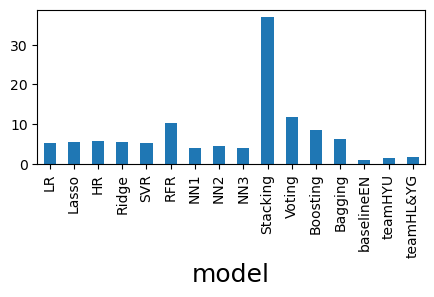

In [900]:
(df_time_list_topn.loc[mykey,].sum(axis=1)/60**2).plot(kind='bar', figsize=(5,2))

In [1417]:
df_time_list_topn.index = pd.MultiIndex.from_product([df_summary.ShortName, list_model ],  names=["dataset", "model"])

In [1418]:
df_time_list_topn\
.to_excel("/media/eys/xwj/proteome/data/TableS1_df_time_list_topn.xlsx") 

In [31]:
df_time_list_topn = pd.read_excel('/media/eys/xwj/proteome/data/TableS1_df_time_list_topn.xlsx', header=[0,1],index_col=[0,1,])

In [36]:
file = "/media/eys/xwj/proteome/data/df_metric_list_topn_%s.pkl" % time.strftime("%Y%m%d")
print(file)
with open(file, 'wb') as f: 
    pickle.dump( [ df_metric_list_topn, df_metric_list_topn2 ],  f)
# file = '/media/eys/xwj/proteome/data/df_metric_list_topn_20211230.pkl'
# with open(file, 'rb') as f:
#     [ df_metric_list_topn, df_metric_list_topn2 ]=pickle.load(f)

/media/eys/xwj/proteome/data/df_metric_list_topn_20220104.pkl


In [1422]:
df_metric_list_topn.index = pd.MultiIndex.from_product([df_summary.ShortName, list_model ],  names=["dataset", "model"])
df_metric_list_topn.tail(30).round(3)

feature selection   cosine                                                   \
metric                   r                                                    
topn                    10     20     50    100    200    500   1000   5000   
dataset  model                                                                
OV_itraq HR          0.451  0.431  0.327  0.255  0.317  0.363  0.377  0.376   
         Ridge       0.446  0.429  0.361  0.272  0.318  0.364  0.377  0.374   
         SVR         0.403  0.408  0.409  0.407  0.403  0.395  0.387  0.365   
         RFR         0.436  0.443  0.448  0.448  0.446  0.443  0.440  0.432   
         NN1         0.098  0.107  0.138  0.175  0.217  0.268  0.290  0.302   
         NN2         0.209  0.193  0.198  0.217  0.244  0.283  0.301  0.311   
         NN3         0.050  0.053  0.063  0.084  0.110  0.158  0.191  0.237   
         Boosting    0.449  0.448  0.444  0.384  0.420  0.414  0.409  0.387   
         Bagging     0.455  0.450  0.406  0.293  0.381  0.409  0.417  0.423   
         Stacking    0.410  0.421  0.425  0.425  0.423  0.418  0.415  0.403   
         Voting      0.403  0.409  0.407  0.403  0.396  0.383  0.373  0.349   
         baselineEN  0.000  0.000  0.000  0.000  0.000  0.000  0.000  0.000   
         teamHYU     0.000  0.000  0.000  0.000  0.000  0.000  0.000  0.000   
         teamHL&YG   0.000  0.000  0.000  0.000  0.000  0.000  0.000  0.000   
GC_itraq LR          0.197  0.178  0.094  0.129  0.188  0.229  0.245  0.257   
         Lasso       0.204  0.202  0.189  0.189  0.192  0.203  0.208  0.210   
         HR          0.194  0.171  0.107  0.141  0.189  0.225  0.236  0.235   
         Ridge       0.199  0.185  0.141  0.151  0.192  0.230  0.246  0.257   
         SVR         0.196  0.212  0.231  0.240  0.245  0.247  0.247  0.239   
         RFR         0.204  0.215  0.227  0.232  0.236  0.239  0.241  0.239   
         NN1         0.045  0.054  0.078  0.111  0.146  0.176  0.190  0.203   
         NN2         0.102  0.105  0.120  0.136  0.160  0.185  0.197  0.208   
         NN3         0.025  0.031  0.038  0.051  0.073  0.116  0.140  0.167   
         Boosting    0.200  0.207  0.214  0.208  0.225  0.237  0.241  0.219   
         Bagging     0.208  0.203  0.157  0.181  0.220  0.248  0.259  0.265   
         Stacking    0.192  0.203  0.215  0.222  0.225  0.229  0.228  0.220   
         Voting      0.188  0.198  0.206  0.207  0.208  0.205  0.204  0.191   
         baselineEN  0.000  0.000  0.000  0.000  0.000  0.000  0.000  0.000   
         teamHYU     0.000  0.000  0.000  0.000  0.000  0.000  0.000  0.000   
         teamHL&YG   0.000  0.000  0.000  0.000  0.000  0.000  0.000  0.000   

feature selection                  ... custom                                  \
metric                       rmse  ...   rmse mae                               
topn                   All     10  ...    All  10 20 50 100 200 500 1000 5000   
dataset  model                     ...                                          
OV_itraq HR          0.369  0.884  ...  0.000   0  0  0   0   0   0    0    0   
         Ridge       0.367  0.892  ...  0.000   0  0  0   0   0   0    0    0   
         SVR         0.345  0.899  ...  0.000   0  0  0   0   0   0    0    0   
         RFR         0.427  0.876  ...  0.000   0  0  0   0   0   0    0    0   
         NN1         0.284  0.990  ...  0.000   0  0  0   0   0   0    0    0   
         NN2         0.300  0.978  ...  0.000   0  0  0   0   0   0    0    0   
         NN3         0.219  0.994  ...  0.000   0  0  0   0   0   0    0    0   
         Boosting    0.435  0.873  ...  0.000   0  0  0   0   0   0    0    0   
         Bagging     0.422  0.869  ...  0.000   0  0  0   0   0   0    0    0   
         Stacking    0.393  0.902  ...  0.000   0  0  0   0   0   0    0    0   
         Voting      0.330  0.917  ...  0.000   0  0  0   0   0   0    0    0   
         baselineEN  0.000  0.000  ...  0.849   0  0  0   0   0   0    0    0   
         teamHYU 

In [1426]:
df_metric_list_topn.round(3).to_excel("/media/eys/xwj/proteome/data/TableS2_df_metric_list_topn.xlsx")

### reviewer 2 & 4, request to compare NN model. We found NN is not a suitable condidate model

In [ ]:
%%time
## Wall time: 18min
m = 'NN'
print('compare NN with other feature selection models')
## a data frame with all metrics. at all feature length
list_model= [ 'LR', 'Lasso', 'HR', 'Ridge', 'SVR', 'RFR', 'NN']
## 1. store train fit
df_metric_list_topnNN =  pd.DataFrame(data = 0, 
                          index = pd.MultiIndex.from_product([df_summary.index, list_model ],  names=["dataset", "model"]), 
                          columns= pd.MultiIndex.from_product([ method_feature_select,  ['r', 'rmse', 'mae'], list_topn ],
                                                               names=[ "feature selection", "metric", "topn"])) 
## 2. store train fit
df_metric_list_topnNN2 =  deepcopy(df_metric_list_topnNN)                                                       

## Wall time: 18min
print('df_time_list_topn & df_metric_list_topnNN: ')
for mykey in df_summary.index:
    print(mykey, end=":")

    with open( '/media/eys/xwj/proteome/data/' + df_summary.loc[mykey, "resultpkl"], 'rb') as f:
        [res ]=pickle.load(f)

    ## trouble shooting
    X = dict_dataset[mykey]["RNA"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
    Y = dict_dataset[mykey]["protein"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
    
    X_use, X_test, Y_use, Y_test = train_test_split(X, Y, test_size=0.2, random_state=123, shuffle=True)
    print(mykey, X.shape, Y.shape, X_use.shape, X_test.shape,  Y_use.shape, Y_test.shape)
    ##############
   
    print( mykey.ljust(30,'-'), end=':' ) 

    for mfs in method_feature_select: 
        ## part 1. summary for a fixed topn, average meric of all genes
        my_list_topn = list(res[mfs].keys())
        print(mfs, end=",")
        for topn in my_list_topn:
            if topn == df_summary.loc[mykey, 'totalRNA']:
                my_topn = 'All'
            else:
                my_topn = topn
            df_time_list_topn.loc[(mykey, res[mfs][topn]["time"].index), (mfs, my_topn)] = res[mfs][topn]["time"].loc[:,'test'].values
            for m in list_model[:7]:
                print(m, end=',')
                for metric in ["mae","rmse","r"]:
                    ## 5-fold CV -> average performances at feature length 5~All, only for my models
                    df_metric_list_topnNN2.loc[(mykey, m), (mfs, metric, my_topn)]  = res[mfs][topn][m]["df_CVtrain_"+ metric].fillna(0).mean(axis=1).mean()
                    df_metric_list_topnNN.loc[(mykey, m), (mfs, metric, my_topn)]  = res[mfs][topn][m]["df_CVtest_"+ metric].fillna(0).mean(axis=1).mean()
    print('done')

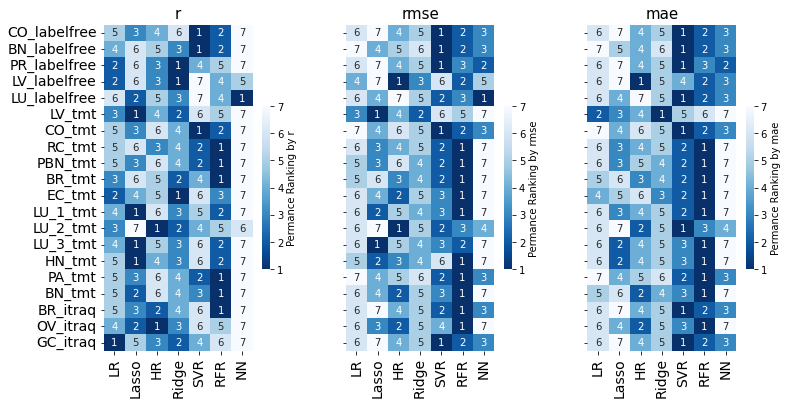

In [1653]:
### Across all featuren length (topn), Neural network performs worst in 17/20 datasets, not an attractive choice
temp = [ df_metric_list_topnNN.loc[mykey, ('cosine', 'r')].max(axis=1) for mykey in df_summary.index ]
( pd.concat(temp , axis =1 ).rank())

plt.rcParams["figure.figsize"] = (12, 6) ### 20 datasets
fig, axes = plt.subplots(1, 3, sharex=True, sharey='row')
fig.subplots_adjust(wspace=0.3, hspace=0.3)

for i, metric in zip(range(3), text_metrics):
    if metric == 'r':
        temp = [ df_metric_list_topnNN.loc[mykey, ('cosine', metric)].max(axis=1) for mykey in df_summary.index ]
        temp = ( pd.concat(temp , axis =1 ).rank(ascending=False).T)
    else:
        temp = [ df_metric_list_topnNN.loc[mykey, ('cosine', metric)].min(axis=1) for mykey in df_summary.index ]
        temp = ( pd.concat(temp , axis =1 ).rank(ascending=True).T)
    
    show_cbar = {'label':'Permance Ranking by '+ text_metrics[metric], "orientation": "vertical",'format':'%.0f', 'shrink':0.5}
    sns.heatmap( temp, cmap='Blues_r', annot=True, fmt='.0f', linewidths = 0, cbar=True, ax= axes[i], cbar_kws=show_cbar)
    
    axes[i].set_yticklabels( df_summary.loc[:,'ShortName'] )
    axes[i].set_title( text_metrics[metric], fontsize=15 )
    axes[i].tick_params(axis="x", rotation=90, labelsize=14)
    axes[i].tick_params(axis="y", rotation=0,  labelsize=14)
    axes[i].set_ylabel(None)
    axes[i].set_xlabel(None)
    
# filename = '/media/eys/xwj/proteome/data/figs/figX2_heatmap_r_neuralnetwork_comparision.svg'
# plt.savefig(filename, format='svg', dpi=600)

## Figure 2, Fig 2, line plot, feature selection number is important

In [929]:
datalist= df_summary.index
datalist

Index(['colon_86_2014_labelfree', 'brain_71_2017_labelfree',
       'prostate_65_2019_labelfree', 'liver_62_2019_labelfree',
       'lung_76_2020_labelfree', 'liver_318_2019_tmt', 'colon_95_2019_tmt',
       'renal_185_2019_tmt', 'pedbrain_188_2020_tmt', 'breast_122_2020_tmt',
       'uterus_115_2020_tmt', 'lung_211_2020_tmt', 'lung_89_2020_tmt',
       'lung_202_2021_tmt', 'headneck_151_2021_tmt', 'pancrea_140_2021_tmt',
       'brain_108_2021_tmt', 'breast_77_2016_itraq', 'ovary_119_2016_itraq',
       'stomach_80_2019_itraq'],
      dtype='object', name='Name')

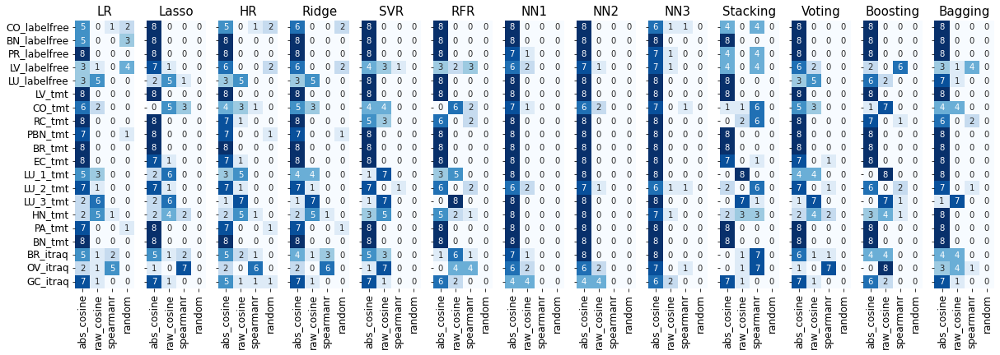

In [966]:
# for (i, mykey) in pd.Series(datalist).iteritems(): 
#     for (j, my_model) in zip(range(6), list_model[:6]): 
#         print( ( df_metric_list_topn2.loc[(mykey, my_model),  (slice(None), metric)].\
#          unstack().rank(axis=0, ascending = False, method='min') == 1).sum(axis = 1)['cosine'].values)
datalist= df_summary.index
datalist

df_mfs_rank =  pd.DataFrame(data = 0, 
                          index = df_summary.index , 
                          columns= pd.MultiIndex.from_product([ list_model[:-3], ['r','rmse', 'mae'], method_feature_select[:-1]],
                                                               names=[  "model", "metric","feature selection",]))
for mykey in datalist:
    for my_model in list_model[:-3]:
        for metric in ['r','rmse', 'mae']:
            switch_ascending = False if metric == 'r' else True
            mfs_rank = df_metric_list_topn.loc[(mykey, my_model),  (method_feature_select[:-1], metric)]\
                .droplevel(level=1).unstack().drop(columns='All').rank(axis=0, ascending = switch_ascending, method='min')
            df_mfs_rank.loc[mykey, (my_model, metric )] = (mfs_rank == 1).sum(axis=1).values
        
n = len(list_model[:-3])
plt.rcParams["figure.figsize"] = (20, 6) ### 
fig, axes = plt.subplots(1, n, sharex=True, sharey='row')
fig.subplots_adjust(wspace=0.2, hspace=0.3)

metric = ['r', 'rmse', 'mae'][0]
for i, my_model in zip(range(n), list_model[:-3]):
#     print(i , my_model)
    how_show_cbar = {'label': '# times Number of times each feature selection method ranks first\nby '+ metric.upper() } if i== (n-1) else {}
    show_or_not = True if i== (n-1) else False
    show_or_not = False
    sns.heatmap( df_mfs_rank.loc[:, (my_model, metric)], cmap='Blues', annot=True, fmt='.0f', linewidths = 0, cbar= show_or_not, ax= axes[i],
               cbar_kws=how_show_cbar)
    axes[i].tick_params(axis="x", rotation=90)
    axes[i].set_xticklabels(['abs_cosine', 'raw_cosine', 'spearmanr','random'], fontsize=12)
    axes[i].set_yticklabels(df_summary.loc[datalist,'ShortName'], fontsize=12)
    axes[i].set_title(my_model, fontsize=15)
    axes[i].set_ylabel(None)
    axes[i].set_xlabel(None)

### gene characteristics

In [978]:
##########  OMIM genes

### 第一步筛选 OMIM disease

# Copyright (c) 1966-2020 Johns Hopkins University. Use of this file adheres to the terms specified at https://omim.org/help/agreement.
# Generated: 2020-07-30
# See end of file for additional documentation on specific fields
# Phenotype Mapping key - Appears in parentheses after a disorder :
# -----------------------------------------------------------------
#
# 1 - The disorder is placed on the map based on its association with
# a gene, but the underlying defect is not known.
# 2 - The disorder has been placed on the map by linkage or other
# statistical method; no mutation has been found.
# 3 - The molecular basis for the disorder is known; a mutation has been
# found in the gene. 
# 4 - A contiguous gene deletion or duplication syndrome, multiple genes
# are deleted or duplicated causing the phenotype.

inputfile = "/media/eys/xwj/download/OMIM/morbidmap.txt"
omim = pd.read_csv(inputfile, sep='\t', comment='#', header=None)
omim.columns = ['Phenotype','Gene Symbols','MIM Number', 'Cyto Location']
omim.loc[:, 'Phenokey'] = [ x[-3:] for x in omim.Phenotype]
omim = omim.loc[ omim.Phenokey == '(3)']

remove_these_keywords = ['tumor', 'cancer', 'virus', 'carcinoma', 'sarcoma' ]
mask = [ all(y not in x for y in remove_these_keywords) for x in omim.Phenotype  ]

omim = omim.loc[ mask]
# omim.loc[:, 'MIM Number'].value_counts()
# omim.loc [omim.loc[:, 'MIM Number'] == 120140 ]  

### gene symbols
list_omim_gene = np.unique([ y.strip()  for x in omim.loc[:, 'Gene Symbols' ] for y in x.split(',')], )
len(list_omim_gene)

### gene ensg id
inputfile = "/media/eys/xwj/download/OMIM/mim2gene.txt"
mim2gene = pd.read_csv(inputfile, sep='\t', comment='#', header=None)
mim2gene = mim2gene.dropna()
mim2gene.columns = ['MIM Number', 'MIM Entry Type', 
                    'Entrez Gene ID (NCBI)', 'Approved Gene Symbol (HGNC)', 'Ensembl Gene ID (Ensembl)']

list_omim_gene = mim2gene.loc[ mim2gene[ 'Approved Gene Symbol (HGNC)' ].isin(list_omim_gene), : ].set_index('Ensembl Gene ID (Ensembl)')
list_omim_gene

,MIM Number,MIM Entry Type,Entrez Gene ID (NCBI),Approved Gene Symbol (HGNC)
Ensembl Gene ID (Ensembl),,,,
ENSG00000111275,100650,gene/phenotype,217.0,ALDH2
ENSG00000138435,100690,gene,1134.0,CHRNA1
ENSG00000170175,100710,gene,1140.0,CHRNB1
ENSG00000135902,100720,gene,1144.0,CHRND
ENSG00000108556,100725,gene,1145.0,CHRNE
...,...,...,...,...
ENSG00000163491,618726,gene,152110.0,NEK10
ENSG00000137473,618735,gene,83894.0,TTC29
ENSG00000113272,618802,gene,54974.0,THG1L


In [940]:
############ protein atlas 
### gene  tissue specificity
inputfile = "/media/eys/xwj/proteome/proteinatlas.tsv/proteinatlas.tsv"
proteinatlas = pd.read_csv(inputfile, sep='\t', header=0)
proteinatlas = proteinatlas.iloc[:, :20].set_index('Ensembl')

inputfile = '/media/eys/xwj/proteome/data/datasets_to_proteinatlas_tissue.txt'
mapping = pd.read_csv(inputfile, sep='\t', header=0)
mapping = mapping.set_index('datasets')

proteinatlas.loc[:, 'tissue specificity'] = proteinatlas.loc[:, 'RNA tissue specificity'].map(
    {'Low tissue specificity': 'Low', 'Not detected': 'Low', 'Tissue enhanced':'High', 'Group enriched':'High',
       'Tissue enriched':'High' })
proteinatlas = proteinatlas.fillna('unknown')

In [942]:
proteinatlas.head().columns

Index(['Gene', 'Gene synonym', 'Gene description', 'Uniprot', 'Chromosome',
       'Position', 'Protein class', 'Biological process', 'Molecular function',
       'Disease involvement', 'Evidence', 'HPA evidence', 'UniProt evidence',
       'NeXtProt evidence', 'MS evidence', 'RNA tissue specificity',
       'RNA tissue distribution', 'RNA tissue specificity score',
       'RNA tissue specific NX', 'tissue specificity'],
      dtype='object')

In [951]:
mask = proteinatlas.loc[:, 'tissue specificity'] == 'High'
list_tissue_genes = proteinatlas.index[mask].tolist()
len(list_tissue_genes)

11069

In [972]:
############# Do several types of protein post-translational modifications affect the prediction accuracy?  Updated on July 28, 2021
inputfile='/media/eys/xwj/proteome/iPTMnet_v6.0_download/ptm.txt'
ptm = pd.read_csv(inputfile, sep='\t', header=None)
ptm.columns = ['ptm_type', 'source', 'substrate_UniProtAC', 'substrate_genename', 'organism', 'site' ,
               'enzyme_UniProtAC' , 'enzyme_genename',      'note' ,    'pmid']
mask = [str(x).startswith('Homo sapiens') for x in  ptm.organism ]
# ptm = ptm[ ptm.organism == 'Homo sapiens (Human)'  ]
ptm = ptm[mask & pd.notna(ptm.substrate_genename) ]

ptm = ptm.drop_duplicates(
  subset = ['ptm_type', 'substrate_genename'],
  keep = 'last').reset_index(drop = True)

ptm.loc[ ptm['ptm_type'].isin(['N-GLYCOSYLATION', 'O-GLYCOSYLATION', 'S-GLYCOSYLATION', 'C-GLYCOSYLATION']), 'ptm_type'] = 'GLYCOSYLATION'

ptm['ptm_type2'] = pd.Categorical(ptm['ptm_type'],  ptm['ptm_type'].value_counts(ascending=True).index.tolist())
print( ptm['ptm_type2'].value_counts() )

### Some genes will undergo a variety of modifications, and this kind of gene label is the rarest one. The main modification method is the label

# mask = [i for i, value in ptm.substrate_genename.value_counts().iteritems() if value > 1 ] 
# ptm.loc[ ptm.substrate_genename.isin( mask ), 'ptm_type2'] = 'MULTIPLE'
ptm = ptm.sort_values(by='ptm_type2').drop_duplicates(
  subset = [ 'substrate_genename'],
  keep = 'first').reset_index(drop = True)

/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (6,7,8) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


PHOSPHORYLATION    9366
ACETYLATION        2910
GLYCOSYLATION      1232
S-NITROSYLATION    1209
METHYLATION         471
UBIQUITINATION      180
MYRISTOYLATION      117
SUMOYLATION          24
Name: ptm_type2, dtype: int64


In [971]:
if False: 
    with open('/media/eys/xwj/proteome/data/20210907ptm.pkl', 'wb') as f:    
        pickle.dump( [ ptm.set_index('substrate_genename') ],  f)
        
inputfile = '/media/eys/xwj/proteome/data/20210907ptm_ensembl_id.pkl'
with open(inputfile, 'rb') as f:
    [ newindex ]=pickle.load(f)
newindex

,ensembl_gene_id
substrate_genename,
TP53,ENSG00000141510
AURKA,ENSG00000087586
MITF,ENSG00000187098
HNRNPC,ENSG00000092199
SP1,ENSG00000185591
...,...
KCNK2,ENSG00000082482
PRSS23,ENSG00000150687
ZNF202,ENSG00000166261


In [973]:
ptm = ptm.set_index('substrate_genename').loc[ newindex.index, :]
ptm['ensembl_id'] = newindex
ptm = ptm.drop_duplicates(subset=[ 'ensembl_id' ],  keep = 'first')
ptm = ptm.reset_index().set_index('ensembl_id')
ptm.head()

,substrate_genename,ptm_type,source,substrate_UniProtAC,organism,site,enzyme_UniProtAC,enzyme_genename,note,pmid,ptm_type2
ensembl_id,,,,,,,,,,,
ENSG00000141510,TP53,SUMOYLATION,pro,P04637,Homo sapiens (Human),K386,NaN,NaN,NaN,NaN,SUMOYLATION
ENSG00000087586,AURKA,SUMOYLATION,pro,O14965,Homo sapiens (Human),K258,NaN,NaN,NaN,NaN,SUMOYLATION
ENSG00000187098,MITF,SUMOYLATION,pro,O75030,Homo sapiens (Human),K423,NaN,NaN,NaN,NaN,SUMOYLATION
ENSG00000092199,HNRNPC,SUMOYLATION,pro,P07910,Homo sapiens (Human),K250,NaN,NaN,NaN,NaN,SUMOYLATION
ENSG00000185591,SP1,SUMOYLATION,pro,P08047-1,Homo sapiens (Human),K16,NaN,NaN,NaN,16407261,SUMOYLATION


In [974]:
file = '/media/eys/xwj/proteome/data/20210421_list_protein_in_complex_CORUM.pkl'
with open(file, 'rb') as f:
    [ list_protein_in_complex ]=pickle.load(f)

<AxesSubplot:>

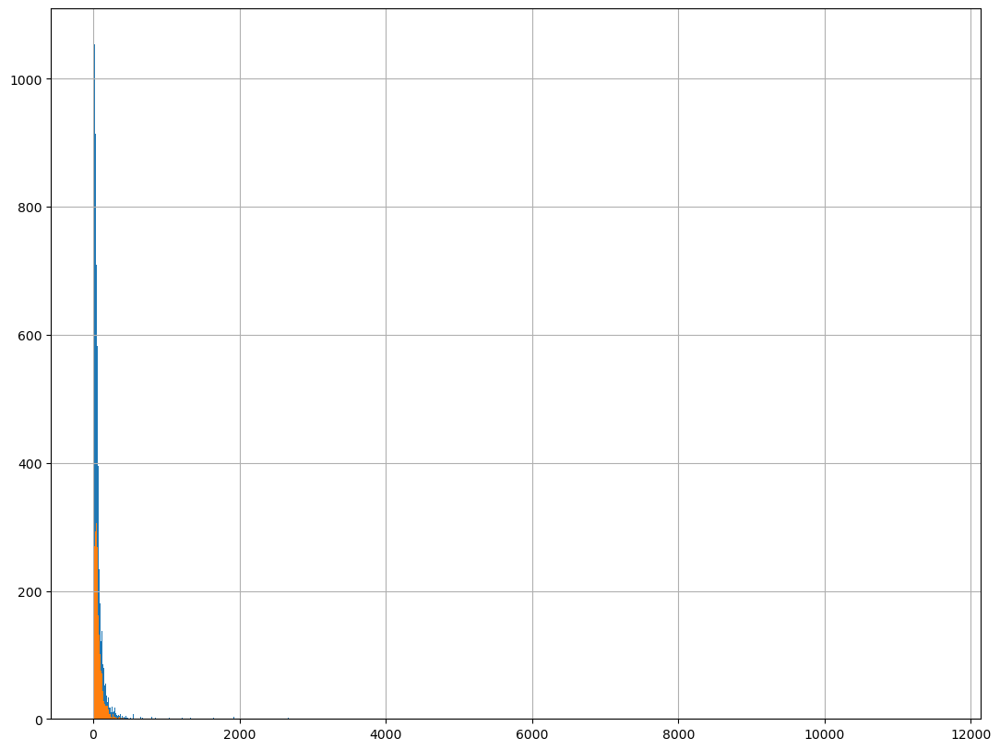

In [975]:
## genesymbol mapping to ENSG id
## Protein T1/2 ?
file = "/media/eys/xwj/proteome/data/20210422_zecha_protein_property_ensembl_id.pkl"
with open(file, 'rb') as f:
    [ zecha_protein_property ]=pickle.load(f)
# zecha_protein_property = pd.read_excel(inputfile, sheet_name="Properties and functions")
zecha_protein_property = zecha_protein_property.groupby(zecha_protein_property.index).first()
keep = ~ (zecha_protein_property.loc[:, "T1/2 [h]"] == "inf.")
zecha_protein_property = zecha_protein_property.loc[keep, :]
zecha_protein_property.loc[:, "T1/2 [h]"].hist(bins=1000)
zecha_protein_property.loc[:, "Molecular weight [kDa]"].hist(bins=1000)
# plt.xscale('log')

In [1021]:
subcell.value_counts()

subcell  
Cytoplasm    18
Nucleus      10
Secretory     9
dtype: int64

In [1022]:
# The localization of protein in cells is divided into three large regions

subcell = pd.read_csv('/media/eys/xwj/download/HPA/hpa_structure_name_subcell.txt', sep='\t', index_col=0)

## "Cytosol", "Mitochondria", "Nucleoplasm", 
for g in zecha_protein_property.index:
    temp = zecha_protein_property.loc[g, "Subcellular location (HPA)"]
    if isinstance(temp, pd.Series): # some gene have > 1 lines, take the first one
        temp = zecha_protein_property.loc[g, "Subcellular location (HPA)"][0]
    if len(temp)>1: # 
        if ";" in (temp): # take the main celluluar location
            temp = temp.split(";")[0]
        zecha_protein_property.loc[g, "subcell_xwj"] = subcell.loc[temp].values
        
### Protein class (HPA)
list_class = ["transcription factor", "transporter", "protein kinase", "ribosomal protein", "peptidase",   "other enzyme", "not enzyme" ]
zecha_protein_property.loc[:, "class_xwj"] = list_class[-1] ##default is : not enzyme

for g in zecha_protein_property.index:
    temp = zecha_protein_property.loc[g, "Protein class (HPA)"]
    if isinstance(temp, pd.Series): # some gene have > 1 lines, take the first one
        temp = zecha_protein_property.loc[g, "Protein class (HPA)"][0]

    if len(temp.strip())>1: # 
        for c in list_class[:-1] : 
            if c in temp:
                zecha_protein_property.loc[g, "class_xwj"] = c 
                break
zecha_protein_property.loc[:, "class_xwj"].value_counts(), zecha_protein_property.loc[:, "subcell_xwj"].value_counts()

(not enzyme              4277
 other enzyme            1005
 transcription factor     325
 transporter              248
 protein kinase           208
 peptidase                169
 ribosomal protein        119
 Name: class_xwj, dtype: int64,
 Nucleus      3250
 Cytoplasm    1098
 Secretory    1028
 Name: subcell_xwj, dtype: int64)

### Figure 7, Fig 7 final model
Which protein properties are related to the prediction accuracy？

In [1027]:
#### empty dict to hold target annotations
dict_data = dict()

for mykey in df_summary.index:
#     plt.rcParams["figure.figsize"] = (20,5)
#     fig, axes = plt.subplots(1,6, sharey=True)
#     fig.subplots_adjust(hspace=0.3)
    
    data = pd.DataFrame({
        "r":dict_r_final[mykey].loc[:, ('CVtest', 'Voting', 'r')].mean(axis=1), 
        "abundance": dict_dataset[mykey]["protein"].transpose().median()} )
    
    bin_n = 5
    data["r_group"] = pd.qcut(data["r"], q=bin_n, labels = [ "r"+str(i) for i in range(bin_n) ])
    
    ## ##################################
    #### tissue_specificity
    data.loc[:, 'tissue_specificity'] = False
    overlap = set(data.index) & set(proteinatlas.index) 
    mykey_map_tissue = mapping.loc[mykey, 'tissue_mapping_to_proteinatlas']
    data.loc[overlap, 'tissue_specificity']  = [ mykey_map_tissue in entry for entry in proteinatlas.loc[overlap, 'RNA tissue specific NX' ] ] 
    data.loc[:, 'tissue_specificity']  = data['tissue_specificity'].map({False: 'not_tissue_elevated', True: 'tissue_elevated'}) 
    
    ####PTM
    data.loc[:, 'protein_ptm']  = 'Unknown'
    overlap = set(data.index) & set(ptm.index) 
    data.loc[overlap, 'protein_ptm'] = ptm.loc[overlap, 'ptm_type2']
    
    ## complex members prediction performances
    data.loc[~ data.index.isin(list_protein_in_complex), "complex"] = 'not_in_complex' 
    data.loc[    data.index.isin(list_protein_in_complex), "complex"] = 'in_complex'

    overlap = set(data.index) & set(zecha_protein_property.index)
    ### subcell
    data.loc[overlap, 'subcell'] = zecha_protein_property.loc[overlap, "subcell_xwj"]
    print(mykey, zecha_protein_property.loc[overlap, "subcell_xwj"].value_counts())
    ### function class
    data.loc[overlap, 'class'] = zecha_protein_property.loc[overlap, "class_xwj"]
    #### omim gene？
    data.loc[  data.index.isin(list_omim_gene.index), 'omim'] = 'omim_gene'
    data.loc[~data.index.isin(list_omim_gene.index), 'omim'] = 'not_omim_gene'
    #### essential genes?
    data.loc[  data.index.isin(list_essential_gene), 'essential'] = 'essential'
    data.loc[~data.index.isin(list_essential_gene), 'essential'] = 'not_essential'  
    
    ##################################
    ### T1/2 half-life 
    bin_n = 2
    data.loc[overlap, 'halflife'] = pd.qcut( zecha_protein_property.loc[overlap, "T1/2 [h]"].astype(np.float64),  
                                            q=bin_n, labels = [ 'short_life', 'long_life' ])
    ### Protein sequence length 
    data.loc[overlap, 'peptide_length'] = pd.qcut( zecha_protein_property.loc[overlap, "Protein sequence length"].astype(np.float64), 
                                                  q=bin_n, labels = [ 'short_peptide', 'long_peptide' ])
    ### protein absolute level
    if mykey.endswith("labelfree"):
        bin_n = 3
        data["abundance_labelfree"] = pd.qcut(data["abundance"], q=bin_n, labels = [ 'low_abundance','medium_abundance','high_abundance' ])
    
    
    ### save dict
    dict_data[mykey] = data

colon_86_2014_labelfree Nucleus      717
Cytoplasm    397
Secretory    365
Name: subcell_xwj, dtype: int64
brain_71_2017_labelfree Nucleus      1157
Cytoplasm     613
Secretory     558
Name: subcell_xwj, dtype: int64
prostate_65_2019_labelfree Nucleus      1170
Cytoplasm     577
Secretory     530
Name: subcell_xwj, dtype: int64
liver_62_2019_labelfree Nucleus      704
Cytoplasm    424
Secretory    401
Name: subcell_xwj, dtype: int64
lung_76_2020_labelfree Nucleus      653
Secretory    400
Cytoplasm    388
Name: subcell_xwj, dtype: int64
liver_318_2019_tmt Nucleus      2133
Cytoplasm     839
Secretory     794
Name: subcell_xwj, dtype: int64
colon_95_2019_tmt Nucleus      1457
Cytoplasm     673
Secretory     632
Name: subcell_xwj, dtype: int64
renal_185_2019_tmt Nucleus      2384
Cytoplasm     916
Secretory     848
Name: subcell_xwj, dtype: int64
pedbrain_188_2020_tmt Nucleus      2084
Cytoplasm     834
Secretory     784
Name: subcell_xwj, dtype: int64
breast_122_2020_tmt Nucleus      26

In [1030]:
data.subcell.value_counts()

Nucleus      36996
Cytoplasm    14942
Secretory    14036
Name: subcell, dtype: int64

In [1047]:
### convert dict to long table
data = pd.concat( dict_data).reset_index().rename(columns={'level_0': 'dataset'})
data.loc[:, 'dataset'] = df_summary.loc[data.dataset,'ShortName'].values
if False:
    data.to_csv('/media/eys/xwj/proteome/data/toR_violin20220108.txt', sep='\t')
data

,dataset,level_1,r,abundance,r_group,tissue_specificity,protein_ptm,complex,subcell,class,omim,essential,halflife,peptide_length,abundance_labelfree
0,CO_labelfree,ENSG00000000419,0.095473,2.6990,r1,not_tissue_elevated,ACETYLATION,in_complex,NaN,other enzyme,omim_gene,essential,long_life,short_peptide,low_abundance
1,CO_labelfree,ENSG00000000457,0.251826,2.5360,r2,not_tissue_elevated,MYRISTOYLATION,not_in_complex,NaN,NaN,not_omim_gene,not_essential,NaN,NaN,low_abundance
2,CO_labelfree,ENSG00000000938,-0.150682,2.7700,r0,not_tissue_elevated,PHOSPHORYLATION,not_in_complex,NaN,NaN,not_omim_gene,not_essential,NaN,NaN,low_abundance
3,CO_labelfree,ENSG00000000971,0.432967,5.2365,r4,not_tissue_elevated,GLYCOSYLATION,not_in_complex,Secretory,not enzyme,omim_gene,not_essential,long_life,long_peptide,high_abundance
4,CO_labelfree,ENSG00000001084,0.356723,2.1435,r3,not_tissue_elevated,ACETYLATION,in_complex,Nucleus,other enzyme,omim_gene,not_essential,long_life,long_peptide,low_abundance
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112541,GC_itraq,ENSG00000109917,0.521655,0.0975,r4,not_tissue_elevated,Unknown,not_in_complex,Secretory,not enzyme,not_omim_gene,essential,long_life,long_peptide,NaN
112542,GC_itraq,ENSG00000132485,0.232102,0.0450,r1,not_tissue_elevated,ACETYLATION,in_complex,Nucleus,not enzyme,not_omim_gene,not_essential,long_life,short_peptide,NaN
112543,GC_itraq,ENSG00000086827,0.385073,-0.0470,r3,not_tissue_elevated,ACETYLATION,in_complex,Cytoplasm,not enzyme,not_omim_gene,not_essential,short_life,long_peptide,NaN
112544,GC_itraq,ENSG00000159840,0.377766,0.3535,r3,not_tissue_elevated,ACETYLATION,in_complex,Cytoplasm,not enzyme,not_omim_gene,not_essential,short_life,long_peptide,NaN


### essential genes

In [983]:
# Bartha, I., di Iulio, J., Venter, J. et al. Human gene essentiality. Nat Rev Genet 19, 51–62 (2018). https://doi.org/10.1038/nrg.2017.75
# recent review
input = '/media/eys/xwj/proteome/human_essential/41576_2018_BFnrg201775_MOESM118_ESM.xlsx'
essential = pd.read_excel(input, 
              sheet_name='Values', index_col=0)
essential

,RVIS,missense-Z,pLi,Phi,LofTool,s_het,Blomen KBM7,Wang KBM7,Wang K562,Wang Jiyoye,Wang Raji,Hart HCT116,Hart HeLa,Hart GBM,Hart RPE1,Hart DLD1,Dickinson_EG
ENSG00000172410,16.221914,-0.577938,1.520000e-05,2.428205e-10,0.423,0.002420,-1.000000,0.007,-0.139,-0.115,-0.176,-34.895,-30.617,-13.050,-24.580,-5.006,0.0
ENSG00000077312,89.121137,1.881890,6.027945e-02,1.583828e-03,0.515,0.015382,-0.325455,0.936,0.352,0.786,0.603,35.346,-13.511,-10.534,-3.785,19.483,NaN
ENSG00000162702,83.091380,2.488358,9.516716e-01,9.992973e-01,0.811,0.127835,-0.528302,0.480,-0.244,0.044,0.303,-80.332,33.519,7.716,-19.319,-8.865,1.0
ENSG00000151498,75.712306,-0.140066,1.170000e-05,7.067052e-08,0.713,0.009103,-0.543956,0.578,1.117,0.593,0.656,-73.588,-69.049,-8.742,-53.976,-12.382,NaN
ENSG00000167895,46.220107,0.978494,5.570000e-12,6.591276e-15,0.101,0.008629,-0.516408,0.335,0.606,0.303,0.419,-96.462,-39.976,-12.347,0.913,6.011,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000272398,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
ENSG00000175164,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
ENSG00000012171,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
ENSG00000249751,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [1405]:
###### keep 5000 gene， overlapping times >6
essential = essential.loc[:, ['Blomen KBM7', 'Wang KBM7', 'Wang K562', 'Wang Jiyoye', 'Wang Raji', 
                  'Hart HCT116', 'Hart HeLa', 'Hart GBM', 'Hart RPE1', 'Hart DLD1']]

list_essential_gene = essential.loc[ (essential.rank(ascending=False) < 5001).sum(axis=1) > 6].index.tolist()
len(list_essential_gene)

2199

### Figure 6. performance coorelated with dataset 

 ### comput data complexity
 save in df.columns = [dataset,  sample_size, sample_complexity, protein_number ] 

In [917]:
%%time
### complexity
# complexity_RNA = np.corrcoef(X, rowvar=True).mean()
for mykey in df_summary.index:
# for mykey in df_summary.index:
    ## load res for current data set
    X = dict_dataset[mykey]["RNA"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
    Y = dict_dataset[mykey]["protein"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
    complexity_X = np.corrcoef(X, rowvar=True)
    complexity_Y = np.corrcoef(Y, rowvar=True)
    
    complexity_X[ range(X.index.size), range(X.index.size) ] = 0
    complexity_Y[ range(Y.index.size), range(Y.index.size) ] = 0
    
    print(Y.shape, X.shape, 
          "%.3f" %  (complexity_X.sum()/X.index.size), 
          "%.3f" %  ( complexity_Y.sum()/Y.index.size ) , 
#           "%.3f" %  (np.abs(complexity_X).sum()/X.index.size), ## xwj修改
          "%.3f" %  complexity_X.max(axis=1).mean(),
          "%.3f" %  complexity_Y.max(axis=1).mean() ## Genome Biol 2019
         )

    df_summary.loc[mykey, 'complexity_RNA'] = complexity_X.max(axis=1).mean()# (np.abs(complexity_X).sum()/X.index.size - 1)
    df_summary.loc[mykey, 'complexity_protein'] = complexity_Y.max(axis=1).mean()# (np.abs(complexity_Y).sum()/Y.index.size - 1)

(86, 2244) (86, 14959) -0.908 -0.904 0.394 0.364
(71, 4385) (71, 14408) -0.784 -0.841 0.718 0.443
(65, 3537) (65, 21601) -0.946 -0.967 0.450 0.281
(62, 2354) (62, 14180) -0.009 -0.565 0.434 0.436
(76, 2272) (76, 16597) -0.587 -0.961 0.525 0.516
(318, 6472) (318, 12559) 0.660 4.111 0.578 0.611
(95, 4375) (95, 12932) -0.854 -0.946 0.446 0.386
(185, 7146) (185, 14636) -0.008 -0.951 0.599 0.637
(188, 6425) (188, 18197) 0.885 -0.679 0.628 0.613
(122, 7581) (122, 10163) -0.597 -0.961 0.358 0.385
(115, 5177) (115, 16392) -0.769 -0.832 0.472 0.472
(211, 7131) (211, 15257) 1.873 -0.132 0.582 0.549
(89, 7005) (89, 26595) -0.919 -0.796 0.323 0.441
(202, 8212) (202, 15587) 1.346 0.456 0.593 0.581
(151, 7511) (151, 16776) -0.835 -0.831 0.485 0.503
(140, 5748) (140, 17165) -0.737 -0.875 0.410 0.476
(108, 8825) (108, 21542) -0.717 -0.617 0.426 0.474
(77, 6995) (77, 14056) -0.902 -0.884 0.348 0.342
(119, 4251) (119, 16697) -0.942 -0.916 0.300 0.268
(80, 4900) (80, 15091) -0.823 -0.884 0.436 0.546
CPU 

In [918]:
## add columns
df_summary.loc[:, "tissue"] = [np.str(idx.split("_")[0]) for idx in df_summary.index ]
df_summary.loc[:, "samples"] = [np.int64(idx.split("_")[1]) for idx in df_summary.index ]
df_summary.loc[:, "platform"] = [idx.split("_")[-1] for idx in df_summary.index ]
df_summary = df_summary.astype({'totalRNA': np.int64, 'totalprotein': np.int64, 'common': np.int64, 'pearson':np.float64})
df_summary.head()

,common,totalRNA,totalprotein,pearson,spearman,tissue,samples,ShortName,resultpkl,resultpkl_metric,platform,complexity_RNA,complexity_protein
Name,,,,,,,,,,,,,
colon_86_2014_labelfree,2113,14959,2244,0.229183,0.235372,colon,86,CO_labelfree,res_v4.3_20211218-1733_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_colon_86_2014_labelfree.pkl,labelfree,0.393815,0.363863
brain_71_2017_labelfree,4234,14408,4385,0.151748,0.152212,brain,71,BN_labelfree,res_v4.3_20211221-1443_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_brain_71_2017_labelfree.pkl,labelfree,0.717820,0.442767
prostate_65_2019_labelfree,3445,21601,3537,0.226986,0.224086,prostate,65,PR_labelfree,res_v4.3_20211219-2158_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_prostate_65_2019_labelfree.pkl,labelfree,0.449804,0.281128
liver_62_2019_labelfree,2315,14180,2354,0.412494,0.386321,liver,62,LV_labelfree,res_v4.3_20211218-1953_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_liver_62_2019_labelfree.pkl,labelfree,0.434155,0.435965
lung_76_2020_labelfree,2209,16597,2272,0.118115,0.104513,lung,76,LU_labelfree,res_v4.3_20211218-1751_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_lung_76_2020_labelfree.pkl,labelfree,0.525222,0.515724


In [935]:
# add model performane
temp = pd.concat(dict_r_final, names=['dataset','gene'])\
    .groupby(level=0).mean()\
    .groupby(axis = 1, by=['group', 'model', 'metric']).mean().loc[:, ('CVtest','Voting') ]
df_summary = pd.concat([df_summary, temp], axis =1)
# df_draw.loc[:, ['CVtest','CVtrain']  ] = df_draw.loc[:, ['CVtest','CVtrain']  ].clip(upper=1.1)

In [957]:
## tissue sepcific gene
for mykey in df_summary.index:
    ## load res for current data set
    Y = dict_dataset[mykey]["protein"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
    df_summary.loc[mykey, 'tissue_specific_protein'] = Y.columns.isin( list_tissue_genes).sum()

In [962]:
df_summary.loc[:, 'test'] = df_summary.loc[:, 'tissue_specific_protein']/df_summary.loc[:, 'totalprotein']

In [1452]:
df_summary

,common,totalRNA,totalprotein,pearson,spearman,tissue,samples,ShortName,resultpkl,resultpkl_metric,platform,complexity_RNA,complexity_protein,mae,r,rmse,tissue specific protein,tissue_specific_protein,test
colon_86_2014_labelfree,2113,14959,2244,0.229183,0.235372,colon,86,CO_labelfree,res_v4.3_20211218-1733_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_colon_86_2014_labelfree.pkl,labelfree,0.393815,0.363863,0.751304,0.259475,0.956563,757.0,757.0,0.337344
brain_71_2017_labelfree,4234,14408,4385,0.151748,0.152212,brain,71,BN_labelfree,res_v4.3_20211221-1443_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_brain_71_2017_labelfree.pkl,labelfree,0.717820,0.442767,0.680979,0.397859,0.880700,1850.0,1850.0,0.421893
prostate_65_2019_labelfree,3445,21601,3537,0.226986,0.224086,prostate,65,PR_labelfree,res_v4.3_20211219-2158_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_prostate_65_2019_labelfree.pkl,labelfree,0.449804,0.281128,0.745326,0.297630,0.932632,1060.0,1060.0,0.299689
liver_62_2019_labelfree,2315,14180,2354,0.412494,0.386321,liver,62,LV_labelfree,res_v4.3_20211218-1953_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_liver_62_2019_labelfree.pkl,labelfree,0.434155,0.435965,0.641711,0.509291,0.813337,757.0,757.0,0.321580
lung_76_2020_labelfree,2209,16597,2272,0.118115,0.104513,lung,76,LU_labelfree,res_v4.3_20211218-1751_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_lung_76_2020_labelfree.pkl,labelfree,0.525222,0.515724,0.770595,0.326919,0.958027,712.0,712.0,0.313380
liver_318_2019_tmt,6195,12559,6472,0.448624,0.390871,liver,318,LV_tmt,res_v4.3_20211230-1424_merge_liver_318_2019_tm...,res_v4.3_liver_318_2019_tmt.pkl,tmt,0.578292,0.611368,0.529236,0.697328,0.694758,2067.0,2067.0,0.319376
colon_95_2019_tmt,4201,12932,4375,0.289840,0.28057,colon,95,CO_tmt,res_v4.3_20211221-1931_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_colon_95_2019_tmt.pkl,tmt,0.446393,0.385841,0.752258,0.327762,0.949505,1392.0,1392.0,0.318171
renal_185_2019_tmt,6933,14636,7146,0.510334,0.531295,renal,185,RC_tmt,res_v4.3_20211227-1705_merge_renal_185_2019_tm...,res_v4.3_renal_185_2019_tmt.pkl,tmt,0.598990,0.637353,0.510158,0.734394,0.640897,2292.0,2292.0,0.320739
pedbrain_188_2020_tmt,6184,18197,6425,0.460076,0.428887,pedbrain,188,PBN_tmt,res_v4.3_20211227-1656_merge_pedbrain_188_2020...,res_v4.3_pedbrain_188_2020_tmt.pkl,tmt,0.628463,0.612700,0.567398,0.654054,0.728755,2313.0,2313.0,0.360000
breast_122_2020_tmt,5698,10163,7581,0.443950,0.449147,breast,122,BR_tmt,res_v4.3_20211226-0924_LR-Lasso-HR-Ridge-SVR-R...,res_v4.3_breast_122_2020_tmt.pkl,tmt,0.357786,0.385439,0.628184,0.553957,0.803906,2450.0,2450.0,0.323176


In [1455]:
## Supplemental Table S6 dataset characteristics
filename = "/media/eys/xwj/proteome/data/TableS6_df_summary_%s.xlsx" % time.strftime("%Y%m%d")
print(filename)
df_summary.set_index('ShortName').drop(columns=['resultpkl' , 'resultpkl_metric','test','tissue specific protein']).\
   to_excel(filename)

/media/eys/xwj/proteome/data/TableS6_df_summary_20220210.xlsx


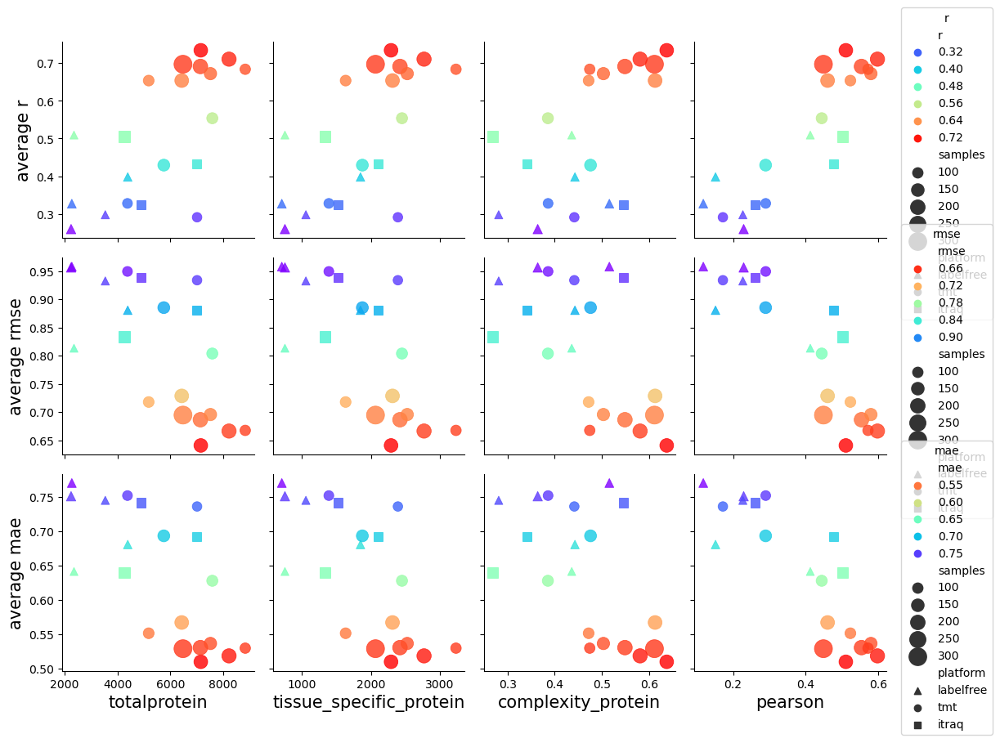

In [1291]:
plt.rcParams["figure.figsize"] = (13, 10) ### 
fig, axes = plt.subplots(3, 4, sharex='col', sharey='row')
fig.subplots_adjust(wspace=0.1, hspace=0.1)

draw_figure5 = ['totalprotein','complexity_protein', 'pearson',]
draw_figure5 = ['totalprotein','tissue_specific_protein', 'complexity_protein', 'pearson',]
for i in range(3):
    metric = ['r', 'rmse', 'mae'][i]
    for j in range(4):
        x_value = draw_figure5[j]
#         print(metric, x_value)
        my_palette = 'rainbow' if metric == 'r' else 'rainbow_r'

        sns.scatterplot(  x = x_value , y= metric,  size='samples',  hue=metric, data=df_summary, ax = axes[i, j],
                    style='platform', markers =['^', 'o', 's'], sizes=(50, 250),  alpha=0.8, palette =my_palette, edgecolor=None, legend=True)
        axes[i, j].set_ylabel( 'average '+ metric, fontsize=15)
        axes[i, j].set_xlabel( x_value, fontsize=15)
        axes[i,j].spines['top'].set_visible(False)
        axes[i,j].spines['right'].set_visible(False)
        
#         axes[i, j].legend(bbox_to_anchor=(1.05, 1, 0.1, 0.2), title=metric)
        
        if (j == 3):
            axes[i, j].legend(bbox_to_anchor=(1.05, 1, 0.1, 0.2), title=metric)
        else:
            axes[i, j].get_legend().remove()
filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX6_datasets_scatter.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

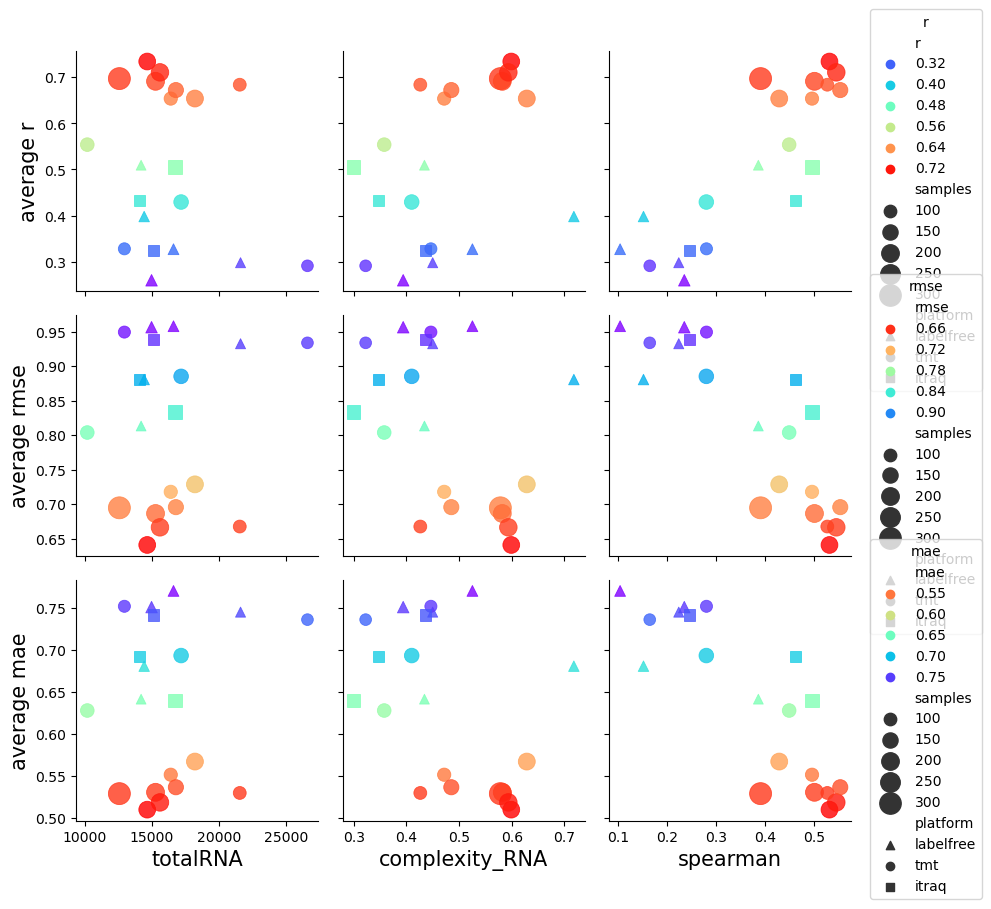

In [1294]:
plt.rcParams["figure.figsize"] = (10, 10) 
fig, axes = plt.subplots(3, 3, sharex='col', sharey='row')
fig.subplots_adjust(wspace=0.1, hspace=0.1)

draw_figure5_supp = ['totalRNA','complexity_RNA', 'spearman',]

for i in range(3):
    metric = ['r', 'rmse', 'mae'][i]
    for j in range(3):
        x_value = draw_figure5_supp[j]
#         print(metric, x_value)
        my_palette = 'rainbow' if metric == 'r' else 'rainbow_r'

        sns.scatterplot(  x = x_value , y= metric,  size='samples',  hue=metric, data=df_summary, ax = axes[i, j],
                    style='platform', markers =['^', 'o', 's'], sizes=(50, 250),  alpha=0.8, palette =my_palette, edgecolor=None, legend=True)
        axes[i, j].set_ylabel( 'average '+ metric, fontsize=15)
        axes[i, j].set_xlabel( x_value, fontsize=15)
        axes[i,j].spines['top'].set_visible(False)
        axes[i,j].spines['right'].set_visible(False)
        
        if (j == 2) :
            axes[i, j].legend(bbox_to_anchor=(1.05, 1, 0.1, 0.2), title=metric)
        else:
            axes[i, j].get_legend().remove()
filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX6_datasets_scatter2.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

### Figure 7
Figure 7. Prediction protein profiles recapitulates the brain structure. A and B: PCA plots show the relative
distance of samples computed from RNA profiles (input experimental data)(A) and protein profiles (output
computational inferred data) (B) of whole brain. C and D: PCA plots of the RNA profile (C) and protein profile
(D) of the cerebral cortex. Dots represent sample and are colored by brain region

In [1102]:
pca= dict()
file="/media/eys/xwj/proteome/gzg20211210_PCA/General List gene 1A.txt"
file="/media/eys/xwj/proteome/gzg20220111FigureBrain2022/RNA total/General List gene1.txt"
pca['A'] = pd.read_csv(file, sep='\t')
# file="/media/eys/xwj/proteome/gzg20211210_PCA/General List protein 1B.txt"
file="/media/eys/xwj/proteome/gzg20220111FigureBrain2022/Protein total/General List protein 1.txt"
pca['B'] = pd.read_csv(file, sep='\t')
# file="/media/eys/xwj/proteome/gzg20211210_PCA/General List gene cerebral cortex 1C.txt"
file="/media/eys/xwj/proteome/gzg20220111FigureBrain2022/RNA CC/General List geneS1.txt"
pca['C'] = pd.read_csv(file, sep='\t')
# file="/media/eys/xwj/proteome/gzg20211210_PCA/General List protein cerebral cortex 1D.txt"
file="/media/eys/xwj/proteome/gzg20220111FigureBrain2022/protein CC/General List protein S1.txt"
pca['D'] = pd.read_csv(file, sep='\t')
pca['D']

,Obs ID (Primary),Obs ID ($ClassID),Obs ID (Obs. Sec. ID:1),Class,M1.t[1],M1.t[2],M1.t[3],M1.t[4],M1.t[5],M1.t[6],M1.t[7],M1.t[8],M1.t[9],M1.t[10]
0,S010002,PL,SPL-s,1,-29.09800,42.87090,17.52740,13.07880,22.40600,17.84730,11.65250,16.55510,8.36637,-2.23419
1,S010003,PL,SPL-s,1,-7.76394,18.33350,55.17740,-3.38245,7.83528,20.06680,5.04391,-8.22750,-14.91520,8.08234
2,S010006,PL,SPL-i,1,-21.46200,8.32852,14.81850,40.21440,19.64870,-5.20033,-4.48132,5.56707,-16.87820,-3.22493
3,S010007,PL,AnG-s,1,-15.25530,10.75540,-18.23210,21.49980,35.95700,-2.06393,2.03457,6.52460,-1.44779,-3.30109
4,S010017,FL,SFG-l,2,10.47690,20.64530,-11.42220,27.81870,-7.09345,4.27514,1.94200,-7.55972,18.43210,4.63936
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,S010450,TL,ITG-its,4,42.07470,-4.60534,28.92400,-26.55770,-5.82295,4.75079,19.21330,-6.84279,-3.65842,-3.50474
87,S010457,TL,STG-l,4,17.95850,-1.97714,-9.21740,26.93720,-3.92282,23.65640,25.77170,3.55797,21.31220,6.17145
88,S010465,TL,ITG-l,4,40.80190,-12.56660,-3.53305,8.26814,-2.74919,-9.48236,20.06140,1.75452,-4.02482,-7.10138
89,S010476,CgG,CgGp-s,5,29.07530,-32.89630,20.81580,-16.96530,-27.86910,-1.12936,-4.30027,-6.42570,-13.15890,11.75900


A 0 0 RNA(whole brain)
B 0 1 Protein(whole brain)
C 1 0 RNA(cerebral cortex)
D 1 1 Protein(cerebral cortex)


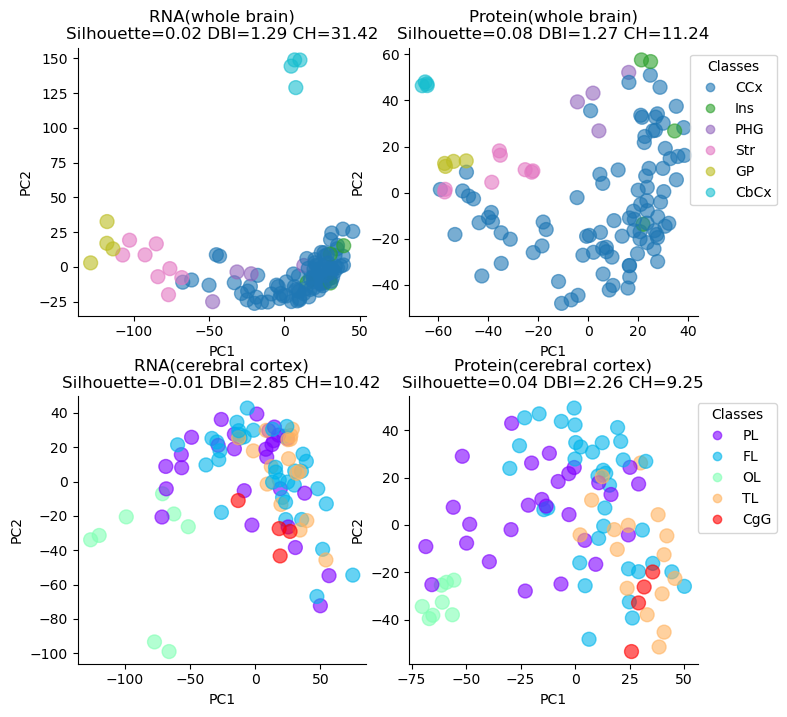

In [1106]:
# 1. Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and  the mean nearest-cluster distance (b) for each sample. \
# The best value is 1 and the worst value is -1.
# 2. Davies-Bouldin score. The score is defined as the average similarity measure of each cluster with its most similar cluster, \
# where similarity is the ratio of within-cluster distances to between-cluster distances. smaller is better
# 3. calinski_harabasz_score. defined as ratio between the within-cluster dispersion and the between-cluster dispersion
# The minimum score is zero, with lower values indicating better clustering.
plt.rcParams.update(plt.rcParamsDefault)
fig, axes = plt.subplots(2,2,figsize=(8,8))
fig.subplots_adjust(wspace=0.15, hspace=0.3)

for subfig,(i,j, subtitle) in dict({
    'A':(0,0, 'RNA(whole brain)'), 
    'B':(0,1,'Protein(whole brain)' ), 
    'C':(1,0, 'RNA(cerebral cortex)'), 
    'D':(1,1, 'Protein(cerebral cortex)')}).items():#'A'BCD:
    
    print ( subfig, i, j, subtitle)
    X=pca[subfig].iloc[:, 4]#np.random.randint(10, size=(5))
    Y=pca[subfig].iloc[:, 5]#['M1.t[2]'] #np.random.randint(10, size=(5))
    annotations= pca[subfig].iloc[:,2] 
    colors = pca[subfig]['Class'].values
    group = pca[subfig].loc[:, ['Obs ID ($ClassID)', 'Class']].drop_duplicates().iloc[:, 0].tolist()

    # annotations= ["Point-1","Point-2","Point-3","Point-4","Point-5"]
    # colors = [1,2,1,3,3]
    my_cmap = 'tab10' if i == 0 else 'rainbow'
    scatter = axes[i,j].scatter(X,Y, s =100, label=annotations, c=colors, cmap= my_cmap, alpha=0.6) #  cmap='tab10'
    axes[i,j].spines['top'].set_visible(False)
    axes[i,j].spines['right'].set_visible(False)
    axes[i,j].set_xlabel('PC1')
    axes[i,j].set_ylabel('PC2')
    if j ==1:
        handles, labels = scatter.legend_elements(prop="colors")
        labels = group
        # # produce a legend with the unique colors from the scatter
        legend1 = axes[i,j].legend(handles, labels, loc="upper right", title="Classes", bbox_to_anchor=(1.2, 0.8, 0.1, 0.2))
    
    axes[i, j].set_title(subtitle+'\nSilhouette=%.2f DBI=%.2f CH=%.2f' % (
          metrics.silhouette_score(pca[subfig].iloc[:, 4:], pca[subfig]['Obs ID ($ClassID)'], metric='euclidean'),
          metrics.davies_bouldin_score(pca[subfig].iloc[:, 4:], pca[subfig]['Obs ID ($ClassID)']), 
          metrics.calinski_harabasz_score(pca[subfig].iloc[:, 4:], pca[subfig]['Obs ID ($ClassID)']) ))
# for subfig in 'ABCD':
#     print( subfig, 'Silhouette=%.2f, DBI=%.2f , CH=%.2f' % (
#           metrics.silhouette_score(pca[subfig].iloc[:, 4:], pca[subfig]['Obs ID ($ClassID)'], metric='euclidean'),
#           metrics.davies_bouldin_score(pca[subfig].iloc[:, 4:], pca[subfig]['Obs ID ($ClassID)']), 
#           metrics.calinski_harabasz_score(pca[subfig].iloc[:, 4:], pca[subfig]['Obs ID ($ClassID)']) )) 

#     axes[i,j].set_xlim(-150, 150)
#     if i == 1:
#         for idx, label in enumerate(annotations):
#             axes[i,j].annotate(label, (X[idx], Y[idx]), ha='center', va='center', fontsize=8)

if True:
    plt.savefig("/media/eys/xwj/proteome/data/figs/fig7_cluster_brain.svg",  format='svg', dpi=200, transparent=True, bbox_inches="tight")

### proxy:regression mix model. prepare a fake regression model y_pred with CV 5, then

In [1040]:
# performance save
# df_template_common = pd.DataFrame(index= common_genes, columns= range(N))
# for metric in list_metric:
#     xxxx["df_CVtest_"+ metric] = deepcopy(df_template_common)
#     xxxx["df_CVtrain_"+ metric] = deepcopy(df_template_common)

## focus on 'r' metric: get topn with best performance of models
mfs = 'cosine' # 
metric = 'r'
df_best_flen = df_metric_list_topn.loc[:, (['cosine', 'custom'], metric)].idxmax(axis = 1)

print( mykey.ljust(30,'-'), end=':' ) 
X = dict_dataset[mykey]["RNA"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
Y = dict_dataset[mykey]["protein"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
Y = Y.iloc[:, :30]

## proxy model need common genes
common_genes = list(set(X.columns) & set(Y.columns))
len(common_genes)

res_proxy = dict()
res_proxy['y_pred_CVtrain'], res_proxy['y_pred_CVtest']  = {}, {}

list_wp=[1,9,7,5,3,1,1,1,1,1,0]
list_wr=[0,1,1,1,1,1,3,5,7,9,1]

inner_cols = [ str(wp)+":"+str(wr) for wp, wr in zip(list_wp, list_wr) ]

mindex = pd.MultiIndex.from_product([ df_summary.index, list_model], names=["dataset", "model"])
mcols = pd.MultiIndex.from_product([ ['CVtrain', 'CVtest'], ['r', 'rmse', 'mae'], inner_cols, range(N) ], names=[ "group", "metric", "ratio","split"])
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>><<<<<<<
print('make new df_out. press Enter to continue: ')
# my_input = input()
df_out_fixflen = pd.DataFrame(data = 0, index = mindex, columns= mcols)

kf = KFold(n_splits=N, random_state=1, shuffle=True)
for i, (train_index, test_index) in zip(range(N), kf.split(Y)): 
    X_train, X_test = X.iloc[train_index],  X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index],  Y.iloc[test_index]
    
    sample_index = dict({'CVtrain':Y.index[train_index], 'CVtest':Y.index[test_index]})
    
    res_proxy['y_pred_CVtrain'][i] = X_train.loc[:, common_genes]
    res_proxy['y_pred_CVtest'][i] = X_test.loc[:, common_genes]
    Y_train, Y_test = Y_train.loc[:, common_genes], Y_test.loc[:, common_genes]

    ############ ratio of proxy:gene-specific model (only at optimal feature length )
    y_pred_mix = dict.fromkeys(['CVtrain', 'CVtest'])
    for group in y_pred_mix:
        y_pred_mix[group] = dict.fromkeys(list_model)
        for m in list_model:
            y_pred_mix[group][m] = dict.fromkeys(inner_cols)

            mfs, _, topn = df_best_flen.loc[mykey, m] # ('custom', 'r', 'All')
            topn = X.shape[1] if topn == 'All' else topn
            y_pred = pd.DataFrame(data=np.array( res[mfs][topn][m]['y_pred_'+group][i]).T, index = sample_index[group], columns =Y.columns)
            y_pred = y_pred.loc[:, common_genes]
            for wp, wr in zip(list_wp, list_wr):
                y_pred_mix[group][m][str(wp) + ":" + str(wr)] = (res_proxy['y_pred_'+group][i]*wp+ y_pred*wr)/(wp+wr)

    print(time.ctime(), 'proxy: regress mix done')
    ##### output df_out_fixflen
    def speed_up_metric(y_true,  y_pred,  tuple_m_wp_wr):
        (m, wp_wr) = tuple_m_wp_wr
        proteins = y_true.columns
        return m, wp_wr,\
            np.nan_to_num([ np.corrcoef(y_true[g], y_pred[m][wp_wr][g])[1,0] for g in proteins]).mean(), \
            np.nan_to_num([ np.sqrt(metrics.mean_squared_error(y_true[g], y_pred[m][wp_wr][g])) for g in proteins ]).mean(), \
            np.nan_to_num([ metrics.mean_absolute_error(y_true[g], y_pred[m][wp_wr][g]) for g in proteins ]).mean()

    jobs = [(m, wp_wr) for m in list_model for wp_wr in inner_cols ]
    with Pool(nCPU) as pool:
        group = 'CVtest'
        metrics_in_rows = pool.map(partial(speed_up_metric, Y_test, y_pred_mix[group]), jobs)
        for m, wp_wr, one_r, one_rmse, one_mae in metrics_in_rows:
            df_out_fixflen.loc[(mykey, m), (group,'r', wp_wr, i)] = one_r
            df_out_fixflen.loc[(mykey, m), (group,'rmse', wp_wr,i)] = one_rmse
            df_out_fixflen.loc[(mykey, m), (group,'mae', wp_wr,i)] = one_mae
        group = 'CVtrain'
        metrics_in_rows = pool.map(partial(speed_up_metric, Y_train, y_pred_mix[group]), jobs)
        for m, wp_wr, one_r, one_rmse, one_mae in metrics_in_rows:
            df_out_fixflen.loc[(mykey, m), (group,'r', wp_wr, i)] = one_r
            df_out_fixflen.loc[(mykey, m), (group,'rmse', wp_wr,i)] = one_rmse
            df_out_fixflen.loc[(mykey, m), (group,'mae', wp_wr,i)] = one_mae

colon_86_2014_labelfree-------:make new df_out. press Enter to continue: 
Fri Dec 17 13:53:24 2021 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Fri Dec 17 13:53:30 2021 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Fri Dec 17 13:53:35 2021 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Fri Dec 17 13:53:41 2021 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Fri Dec 17 13:53:48 2021 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


### TableS3 20220114. mixing ratio 1:3 highlighted

In [1437]:
df_out_fixflen.groupby( axis =1, level=['group', 'metric','ratio'], sort=False).mean().loc[:, ('CVtest','r')]\
.style.highlight_max(axis=1).format("{:0.3f}").to_excel("/media/eys/xwj/proteome/data/TableS3_df_out_fixflen_mixing_ratio.xlsx") 

In [1431]:
### whether other is better?
df_metric_list_topn.loc[:, (method_feature_select[:-1], metric)]\
.rank(axis=1, ascending=False).stack(level = 0).astype(np.int16)

metric                                   mae                                  
topn                                      10  20  50 100 200 500 1000 5000 All
dataset      model     feature selection                                      
CO_labelfree LR        cosine             27  22   7   8  12  24   29   35  32
                       random             36  15   1   2   9  21   25   30  32
                       raw_cosine         26  20   5   6  11  14   18   16  32
                       spearmanr          28  17   3   4  10  13   19   23  32
             Lasso     cosine             33  32  21  17  18  20   23   24  26
...                                       ..  ..  ..  ..  ..  ..  ...  ...  ..
GC_itraq     teamHYU   spearmanr          18  18  18  18  18  18   18   18  18
             teamHL&YG cosine             18  18  18  18  18  18   18   18  18
                       random             18  18  18  18  18  18   18   18  18
                       raw_cosine         18  18  18  18  18  18   18   18  18
                       spearmanr          18  18  18  18  18  18   18   18  18

[1280 rows x 9 columns]

### list_model, six classical model have weight at topn, re-train weighted mean model
V2 inner cross validation

In [1172]:
list_six_model = ['LR', 'Lasso', 'HR', 'Ridge', 'SVR', 'RFR']

weight = df_metric_list_topn.loc[(mykey, list_six_model), ('cosine', 'r')].rank(axis =0, ascending=True)
weight#.loc[mykey, 'All'].values
df_metric_list_topn.loc[(mykey, list_six_model), ('cosine', 'r')]

topn                       10   20   50  100  200  500  1000  5000  All
dataset            model                                               
liver_318_2019_tmt LR     0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0
                   Lasso  0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0
                   HR     0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0
                   Ridge  0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0
                   SVR    0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0
                   RFR    0.0  0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0

In [1087]:
%%time
# Wall time: 3min/dataset
## a data frame with all metrics. at all feature length
list_model= ['LR', 'Lasso', 'HR', 'Ridge', 'SVR', 'RFR', 'NN1', 'NN2', 'NN3', 
             'Stacking', 'Voting', 'Boosting', 'Bagging', 'baselineEN', 'teamHYU', 'teamHL&YG']

list_topn = [10, 20, 50, 100, 200, 500, 1000, 5000, 'All']
list_metric =  ['r', 'rmse', 'mae']
print( list_model, method_feature_select, list_topn, list_metric)
## 1. store train fit
df_metric_list_topn_voting =  pd.DataFrame(data = 0, 
                          index = pd.MultiIndex.from_product([df_summary.index, list_model ],  names=["dataset", "model"]), 
                          columns= pd.MultiIndex.from_product([ method_feature_select, list_metric, list_topn ],
                                                               names=[ "feature selection", "metric", "topn"])) 
## 2. store test fit
df_metric_list_topn_voting2 =  deepcopy(df_metric_list_topn_voting)                                                       
df_metric_list_topn_voting#.loc[:, ("random",'r')]

print( mykey)
print( mykey.ljust(30,'-'), end=':' ) 
X = dict_dataset[mykey]["RNA"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
Y = dict_dataset[mykey]["protein"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
Y = Y.iloc[:, :30]

# filename = '/public/home/test1/mydata/proteome/data/\
# res_v4.3_20211215-1638_LR-Lasso-HR-Ridge-SVR-RFR-NN1-NN2-NN3-\
# Stacking-Voting-Boosting-Bagging-baselineEN-teamHYU-teamHL&YG_colon_86_2014_labelfree.pkl'
# with open(filename, 'rb') as f:
#     [ res ]=pickle.load(f) # load res for current data set

df_template = pd.DataFrame(index= Y.columns, columns= range(N))

for mfs in method_feature_select:
    for topn in res[mfs].keys():
        for m in list_model:
            for metric in list_metric:
                res[mfs][topn][m]["df_CVtest_"+ metric] = deepcopy(df_template)
                res[mfs][topn][m]["df_CVtrain_"+ metric] = deepcopy(df_template)

kf = KFold(n_splits=N, random_state=1, shuffle=True)
for i, (train_index, test_index) in zip(range(N), kf.split(Y)): 
    X_train, X_val = X.iloc[train_index],  X.iloc[test_index]
    Y_train, Y_val = Y.iloc[train_index],  Y.iloc[test_index]

    for mfs in method_feature_select[:1]: ## my models with feature selection
        for topn in res[mfs].keys():
            for m in ['Voting']:
#                 mfs, topn, m = method_feature_select[0], list_topn[0], list_model[0]
                y_pred =  pd.DataFrame(data=np.array( res[mfs][topn][m]['y_pred_CVtrain'][i]).T, index=Y_train.index, columns =Y.columns)
                res[mfs][topn][m]["df_CVtrain_mae"].loc[:, i] = [ metrics.mean_absolute_error(Y_train[g], y_pred[g]) for g in Y.columns]
                res[mfs][topn][m]["df_CVtrain_rmse"].loc[:, i] = [ np.sqrt(metrics.mean_squared_error(Y_train[g], y_pred[g])) for g in Y.columns]
                res[mfs][topn][m]["df_CVtrain_r"].loc[:, i] = [ np.corrcoef(Y_train[g], y_pred[g])[1,0] for g in Y.columns]

                y_pred =  pd.DataFrame(data=np.array( res[mfs][topn][m]['y_pred_CVtest'][i]).T, index=Y_val.index, columns =Y.columns)
                res[mfs][topn][m]["df_CVtest_mae" ].loc[:, i] = [ metrics.mean_absolute_error(Y_val[g], y_pred[g]) for g in Y.columns]
                res[mfs][topn][m]["df_CVtest_rmse"].loc[:, i] = [ np.sqrt(metrics.mean_squared_error(Y_val[g], y_pred[g])) for g in Y.columns]
                res[mfs][topn][m]["df_CVtest_r"].loc[:, i]      = [ np.corrcoef(Y_val[g], y_pred[g])[1,0] for g in Y.columns]

#### copy performance value to
for mfs in method_feature_select: 
    for topn in res[mfs].keys():
        my_topn = 'All' if (topn > 5000) else topn
        for m in ['Voting']:
            for metric in list_metric:
                df_metric_list_topn_voting.loc[(mykey, m), (mfs, metric, my_topn)]  = res[mfs][topn][m]["df_CVtest_"+ metric].fillna(0).mean(axis=1).mean()
                df_metric_list_topn_voting2.loc[(mykey, m), (mfs, metric, my_topn)]  = res[mfs][topn][m]["df_CVtrain_"+ metric].fillna(0).mean(axis=1).mean()
    print(mfs, end=",")
print('finish')        

['LR', 'Lasso', 'HR', 'Ridge', 'SVR', 'RFR', 'NN1', 'NN2', 'NN3', 'Stacking', 'Voting', 'Boosting', 'Bagging', 'baselineEN', 'teamHYU', 'teamHL&YG'] ['cosine', 'raw_cosine', 'spearmanr', 'random', 'custom'] [10, 20, 50, 100, 200, 500, 1000, 5000, 'All'] ['r', 'rmse', 'mae']
colon_86_2014_labelfree
colon_86_2014_labelfree-------:cosine,raw_cosine,spearmanr,random,custom,finish
CPU times: user 6.87 s, sys: 350 ms, total: 7.22 s
Wall time: 7.23 s


In [ ]:
### V2 make a weighted Voting with outer 8/2 split and inner 5-fold crossvalidation 20211217
## jupyter notebook RNA-Protein_predict_v4.3_votingwt
model_dict = {
    "LR": linear_model.LinearRegression(), 
    "Lasso": linear_model.Lasso(alpha=0.02, max_iter=1e5), 
    "HR": linear_model.HuberRegressor(), #Linear regression model that is robust to outliers.
    "Ridge": linear_model.Ridge(), 
    "SVR": SVR( gamma='scale'),
    "RFR": RandomForestRegressor(n_estimators=100, max_depth=3, random_state=0), 
    # NN : construct later, because feature length have to be set 
    "NN1": None,
    "NN2": None,
    "NN3": None,
    ##### other ensemble models
    "Stacking": None,
    "Voting": None,
    "Boosting": None,
    "Bagging": None, 
    ##### reimplement published methods
    "baselineEN": linear_model.ElasticNet(l1_ratio = 0.5, random_state = 0, precompute=True), 
    "teamHYU": RandomForestRegressor(n_estimators=100, random_state=0), # Author not providing detail, use default
    "teamHL&YG": None, ## equivalent to RFR without feature selection
    }

basic_estimators = [
    ("LR",  model_dict['LR']), 
    ("Lasso", model_dict['Lasso']), 
    ("HR",  model_dict['HR']),
    ("Ridge", model_dict['Ridge']), 
    ("SVR", model_dict['SVR']),
    ("RFR", model_dict['RFR']), 
    ]

## voting ensemble with weight at topn, weight will be determined later
model_dict['Voting'] = VotingRegressor(basic_estimators)

list_model = list(model_dict.keys())
print( model_dict, list_model )
method_feature_select = ["cosine", "raw_cosine", "spearmanr", "random", "custom"]

# feature numbers to be prioritized in feature selection 
list_topn = [10, 20, 50, 100, 200, 500, 1000, 5000  ] # v3

#############
def create_res(list_topn):
    res = {}
    for mfs in method_feature_select:
        res[mfs] = {} 
        for topn in list_topn:
            # summary table
            res[mfs][topn] = {}
            res[mfs][topn]["time"] = pd.DataFrame(data = 0, dtype = np.int32, index = model_dict, columns= ["val","train","test"])
            # detail data for all models
            for m in model_dict:
                res[mfs][topn][m]={}
                res[mfs][topn][m]["y_pred_CVtrain"], res[mfs][topn][m]["y_pred_CVtest"] ={}, {}
    return res

def comp_y_pred(p): ### this function fit a classical machine learning model and pred y value
    # usage: comp_y_pred("ENSG00000000419") 
    select=X_train.columns[ df_topn[p] ]
    X_val_select, X_train_select, y_val, y_train = X_val[select], X_train[select], Y_val[p], Y_train[p]
    my_model=model_dict[m].fit(X_train_select, y_train) #'''fit model with selected features'''
    # training fit and test fit
    return my_model.predict(X_train_select), my_model.predict(X_val_select)

run_cross_validation = True
run_test = True
list_model_done = [ ]
print(time.ctime(), 'nCPU =', nCPU, 'run_cross_validation=', run_cross_validation, 'run_test=', run_test)

## a data frame with all metrics. at all feature length
list_model= [ 'LR', 'Lasso', 'HR', 'Ridge', 'SVR', 'RFR','Voting']
list_metric =  ['r', 'rmse', 'mae']
## 1. store test fit
df_metric_list_topn =  pd.DataFrame(data = 0, 
                          index = pd.MultiIndex.from_product([df_summary.index, list_model ],  names=["dataset", "model"]), 
                          columns= pd.MultiIndex.from_product([ method_feature_select,  ['r', 'rmse', 'mae'], list_topn ], names=[ "feature selection", "metric", "topn"])) ## a data frame with all metrics. at all feature length
mykey = 'liver_318_2019_tmt'

outfile = '/public/home/test1/mydata/proteome/data/res_v4.3_voting_' +time.strftime("%Y%m%d-%H%M")+\
    '_temp_'+ mykey + '.pkl'

########### 1. load and transform data 
X = dict_dataset[mykey]["RNA"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
Y = dict_dataset[mykey]["protein"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
Y = Y.iloc[:, :30]

### outer layer split, should be enough > 200 = 160 + 40 
X_use, X_test, Y_use, Y_test = train_test_split(X, Y, test_size=0.2, random_state=123, shuffle=True)

my_list_topn = [X.shape[1]] + list_topn[::-1] #+ [X.shape[1]]
print(time.ctime(), mykey, my_list_topn, 'X',  X.shape, 'Y', Y.shape, X_use.shape, X_test.shape, Y_use.shape, Y_test.shape, )

df_template = pd.DataFrame(index= Y.columns, columns= range(N))
res = create_res(my_list_topn)

########### 2. Pre-comput feature ranking by feature selection methods 1~4
#rank RNAs by linear correlation, run once for the data set, use the matrix later, N-fold CV split i have its own feature ranking matrix
dict_feature_rank = dict.fromkeys(method_feature_select[:-1])
for mfs in dict_feature_rank:
    dict_feature_rank[mfs] = {'CV': dict.fromkeys(range(N)), 'test': dict.fromkeys(range(N))}

df_template = pd.DataFrame(index= Y.columns, columns= range(N))
res = create_res(my_list_topn)
### test split只算1次
if run_test:
    print(time.ctime(), "prepare test set.")
    cos = pd.DataFrame(data=metrics.pairwise.cosine_similarity(X=X_use.transpose(), Y=Y_use.transpose(), 
                                                                dense_output=True), columns=Y.columns)
    i = 0
    np.random.seed(i)
    dict_feature_rank['random']['test'][i] = \
        pd.DataFrame([ np.random.permutation(range(1,X.shape[1]+1)) for col in Y.columns], index = Y.columns).T
    dict_feature_rank['cosine']['test'][i] = abs(cos).rank(axis=0, ascending=False, method='first').astype(np.int32)

## bottom layer split; train 6 models, find weight
## first, new machine learning models by me
############## 1. rank all features by a method, run once for the data set, use the maxtrix later
# split i have its own feature rankings
if run_cross_validation == True:
    print(time.ctime(), "prepare training set.")
    # cross-validation on train set; 
    kf = KFold(n_splits=N, random_state=1, shuffle=True)
    i = 0
    for train_index, test_index in kf.split(Y_use): 
        X_train, X_val = X_use.iloc[train_index],  X_use.iloc[test_index]
        Y_train, Y_val = Y_use.iloc[train_index],  Y_use.iloc[test_index]
        
        cos = pd.DataFrame(data=metrics.pairwise.cosine_similarity(X=X_train.transpose(), Y=Y_train.transpose(), 
                                                                   dense_output=True), columns=Y.columns)
      
        np.random.seed(i)
        dict_feature_rank['random']['CV'][i] = \
            pd.DataFrame([ np.random.permutation(range(1,X.shape[1]+1)) for col in Y.columns], index = Y.columns).T
        dict_feature_rank['cosine']['CV'][i] = abs(cos).rank(axis=0, ascending=False, method='first').astype(np.int32)
        i = i +1
    
##### 2. cross-validaton model fit and evaluate with test
########### 3. Classical machine learning models using prioritized features
for mfs in method_feature_select[ :1]:
    for topn in my_list_topn:
        for m in list_model[ :6]:
            for metric in list_metric:
                res[mfs][topn][m]["df_CVtest_"+ metric] = deepcopy(df_template)
                res[mfs][topn][m]["df_CVtrain_"+ metric] = deepcopy(df_template)

            if (topn == X.shape[1] ) & (mfs !='cosine'): ### avoid recomputing all features, 
                res[mfs][topn][m] = deepcopy( res['cosine'][topn][m])
                continue
            print(time.ctime(), mfs.ljust(8,'-'), str(topn).ljust(8,'-'), m.ljust(10,'-'), end=":  ")
            my_topn = 'All' if (topn == X.shape[1]) else topn
            
            if run_cross_validation: # cross-validaton, model fit and evaluate with test
                start = time.time()
                print("training split ", end=" ")
                i = 0
                            
                for train_index, test_index in kf.split(Y_use): 
                    X_train, X_val = X_use.iloc[train_index],  X_use.iloc[test_index]
                    Y_train, Y_val = Y_use.iloc[train_index],  Y_use.iloc[test_index]
                    
                    df_topn = ( dict_feature_rank[mfs]['CV'][i] <= topn ) ## feature selection

                    with Pool(nCPU) as pool:
                        y_pred_in_rows = []
                        temp = pool.map_async(comp_y_pred, Y_train.columns,  callback=y_pred_in_rows.extend)
                        temp.wait()
                        y_pred_train_in_rows, y_pred_val_in_rows = zip(*y_pred_in_rows)

                    ## store y_pred
                    res[mfs][topn][m]["y_pred_CVtest"][i] = y_pred_val_in_rows
                    res[mfs][topn][m]["y_pred_CVtrain"][i] = y_pred_train_in_rows
                    y_pred =  pd.DataFrame(data=np.array( res[mfs][topn][m]['y_pred_CVtrain'][i]).T, index=Y_train.index, columns =Y.columns)
                    res[mfs][topn][m]["df_CVtrain_mae"].loc[:, i] = [ metrics.mean_absolute_error(Y_train[g], y_pred[g]) for g in Y.columns]
                    res[mfs][topn][m]["df_CVtrain_rmse"].loc[:, i] = [ np.sqrt(metrics.mean_squared_error(Y_train[g], y_pred[g])) for g in Y.columns]
                    res[mfs][topn][m]["df_CVtrain_r"].loc[:, i] = [ np.corrcoef(Y_train[g], y_pred[g])[1,0] for g in Y.columns]

                    y_pred =  pd.DataFrame(data=np.array( res[mfs][topn][m]['y_pred_CVtest'][i]).T, index=Y_val.index, columns =Y.columns)
                    res[mfs][topn][m]["df_CVtest_mae" ].loc[:, i] = [ metrics.mean_absolute_error(Y_val[g], y_pred[g]) for g in Y.columns]
                    res[mfs][topn][m]["df_CVtest_rmse"].loc[:, i] = [ np.sqrt(metrics.mean_squared_error(Y_val[g], y_pred[g])) for g in Y.columns]
                    res[mfs][topn][m]["df_CVtest_r"].loc[:, i]      = [ np.corrcoef(Y_val[g], y_pred[g])[1,0] for g in Y.columns]

                    i = i + 1;  print(i, end=" ");  # end for split i
                # end:  N fold
                res[mfs][topn]["time"].loc[m, "val"] =  int(time.time() - start)
                my_topn = 'All' if (topn > 5000) else topn
                for metric in list_metric:
                    df_metric_list_topn.loc[(mykey, m), (mfs, metric, my_topn)]  = res[mfs][topn][m]["df_CVtest_"+ metric].fillna(0).mean(axis=1).mean()

            list_model_done.extend([ m ])
            with open(outfile, 'wb') as f: 
                pickle.dump( [res],  f)
            print("done.")

### weight
weight = df_metric_list_topn.loc[(mykey, list_six_model), ('cosine', 'r')].rank(axis =0, ascending=True)

In [12]:
### comput Voting ensemble with outer layer split
m = 'Voting'
mfs = 'cosine'
X_train, X_val = X_use,  X_test
Y_train, Y_val = Y_use, Y_test
start = time.time()
for topn in my_list_topn:
    for metric in list_metric:
        res[mfs][topn][m]["df_CVtest_"+ metric] = deepcopy(df_template)
        res[mfs][topn][m]["df_CVtrain_"+ metric] = deepcopy(df_template)
    my_topn = 'All' if (topn > 5000) else topn
    model_dict[m] = VotingRegressor(basic_estimators, weights = weight.loc[mykey, my_topn].values)
#     print(model_dict[m])
    i = 0
    df_topn = ( dict_feature_rank[mfs]['test'][i] <= topn ) ## feature selection
    with Pool(nCPU) as pool:
        y_pred_in_rows = []
        temp = pool.map_async(comp_y_pred, Y_train.columns,  callback=y_pred_in_rows.extend)
        temp.wait()
        y_pred_train_in_rows, y_pred_val_in_rows = zip(*y_pred_in_rows)
    ## store y_pred
    res[mfs][topn][m]["y_pred_CVtest"][i] = y_pred_val_in_rows
    res[mfs][topn][m]["y_pred_CVtrain"][i] = y_pred_train_in_rows
    y_pred =  pd.DataFrame(data=np.array( res[mfs][topn][m]['y_pred_CVtrain'][i]).T, index=Y_train.index, columns =Y.columns)
    res[mfs][topn][m]["df_CVtrain_mae"].loc[:, i] = [ metrics.mean_absolute_error(Y_train[g], y_pred[g]) for g in Y.columns]
    res[mfs][topn][m]["df_CVtrain_rmse"].loc[:, i] = [ np.sqrt(metrics.mean_squared_error(Y_train[g], y_pred[g])) for g in Y.columns]
    res[mfs][topn][m]["df_CVtrain_r"].loc[:, i] = [ np.corrcoef(Y_train[g], y_pred[g])[1,0] for g in Y.columns]

    y_pred =  pd.DataFrame(data=np.array( res[mfs][topn][m]['y_pred_CVtest'][i]).T, index=Y_val.index, columns =Y.columns)
    res[mfs][topn][m]["df_CVtest_mae" ].loc[:, i] = [ metrics.mean_absolute_error(Y_val[g], y_pred[g]) for g in Y.columns]
    res[mfs][topn][m]["df_CVtest_rmse"].loc[:, i] = [ np.sqrt(metrics.mean_squared_error(Y_val[g], y_pred[g])) for g in Y.columns]
    res[mfs][topn][m]["df_CVtest_r"].loc[:, i]      = [ np.corrcoef(Y_val[g], y_pred[g])[1,0] for g in Y.columns]

    res[mfs][topn]["time"].loc[m, "val"] =  int(time.time() - start)

    for metric in list_metric: ## don't fill na
        df_metric_list_topn.loc[(mykey, m), (mfs, metric, my_topn)]  = res[mfs][topn][m]["df_CVtest_"+ metric].mean(axis=1).mean()

list_model_done.extend([ m ])
list_model_done = [m for m in list_model if m in list_model_done]
outfile = '/public/home/test1/mydata/proteome/data/res_v4.3_voting_' + \
    time.strftime("%Y%m%d-%H%M")+ '_'+'-'.join(list_model_done)+'_'+ mykey + '.pkl'
with open(outfile, 'wb') as f: 
    pickle.dump( [res],  f)
print(time.ctime(), "complete", outfile)

Sat Dec 18 14:02:09 2021 complete /public/home/test1/mydata/proteome/data/res_v4.3_voting_20211218-1402_LR-Lasso-HR-Ridge-SVR-RFR-Voting_liver_318_2019_tmt.pkl


In [195]:
df_summary[(df_summary.samples > 150)].index.tolist()

['liver_318_2019_tmt',
 'renal_185_2019_tmt',
 'pedbrain_188_2020_tmt',
 'lung_211_2020_tmt',
 'lung_202_2021_tmt',
 'headneck_151_2021_tmt']

### Figure S1. RFR with cosine

breast_77_2016_itraq r
ovary_119_2016_itraq r


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/ipykernel_launcher.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator


,dataset,model,feature selection,metric,topn,0
0,breast_77_2016_itraq,RFR,cosine,mae,10,0.735081
1,breast_77_2016_itraq,RFR,cosine,mae,20,0.729391
2,breast_77_2016_itraq,RFR,cosine,mae,50,0.725059
3,breast_77_2016_itraq,RFR,cosine,mae,100,0.723779
4,breast_77_2016_itraq,RFR,cosine,mae,200,0.723625
...,...,...,...,...,...,...
265,ovary_119_2016_itraq,RFR,spearmanr,rmse,200,0.869711
266,ovary_119_2016_itraq,RFR,spearmanr,rmse,500,0.872100
267,ovary_119_2016_itraq,RFR,spearmanr,rmse,1000,0.874407
268,ovary_119_2016_itraq,RFR,spearmanr,rmse,5000,0.879975


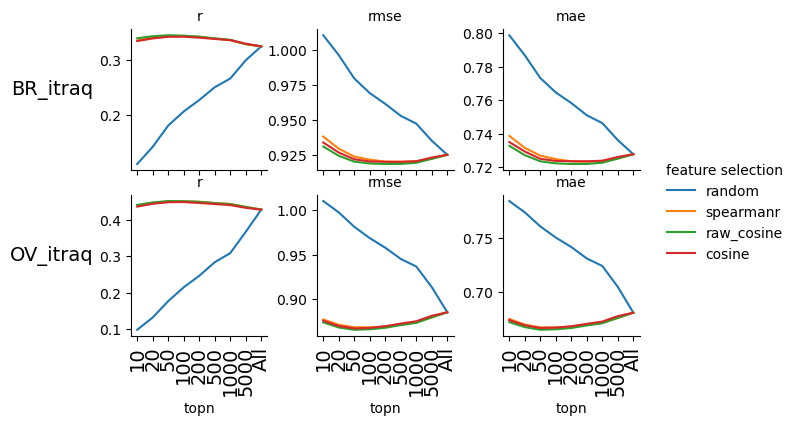

In [1386]:
myinput = df_metric_list_topn.loc[ (['breast_77_2016_itraq', 'ovary_119_2016_itraq'], ['RFR']), ].stack([0,1,2]).reset_index()

metric = list_metric[0]
# myinput = df_metric_list_topn.loc[(dataset_ready, list_model[:-3]), (method_feature_select[:-1], 'r')].stack(level=[0,1,2,]).reset_index()
myinput.loc[:, 'topn'] = myinput.topn.astype(np.str)

# myinput = df_metric_list_topn.loc[(mykey, list_model[:-3]), (method_feature_select[:-1], 'r')].droplevel(0).unstack().reset_index()
## trend of changing 
g = sns.relplot( data=myinput, x="topn", y=0, hue="feature selection", 
            hue_order = ['random','spearmanr','raw_cosine', 'cosine'], 
            col="metric", col_order=list_metric, row='dataset', kind="line", height=2, aspect=1, ci=0, alpha = 1,
            facet_kws={'sharey': False, 'sharex': 'col'})
(g.set_titles("{col_name}").tight_layout(w_pad=0, h_pad=0))

for (row_val, col_val), ax in g.axes_dict.items():
    if col_val == list_metric[0]:
        print(row_val, col_val)
        row_val = df_summary.loc[row_val, 'ShortName']
        ax.set_ylabel(row_val, fontsize=14, rotation=0, ha ='right')
#     if row_val == dataset_ready[0]:
#         ax.set_title(col_val, fontsize = 20)
#     else:
#         ax.set_title(None)
#     if row_val == dataset_ready[-1]:
#         ax.set_xlabel('topn', fontsize=20)
    ax.set_xticklabels(list_topn, fontsize=14, rotation = 90, ha ='center')
filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figS1_RFR_mfs_comparision.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")
myinput

## 2021/12/30  Figure 2
scatter performance of all features.  Sometimes model baselineEN is the best

In [376]:
## load on res
dataset_ready = [ mykey for mykey in df_summary.index if pd.notna(df_summary.loc[mykey, "resultpkl_metric"]) ]
len(dataset_ready)

20

In [718]:
## df_draw
# res[mfs][topn][m]["df_CVtest_rmse"]
df_draw = df_metric_list_topn.loc[(slice(None), list_model[:-2]), (['cosine','custom'], slice(None), 'All') ].stack([0,2])
df_draw = df_draw[ df_draw.all(axis = 1) ].reset_index()# level=[1,2,3])
df_draw.loc[:, 'rmse'] = df_draw['rmse'].clip(upper=1.1)
df_draw.loc[:, 'size'] = 100
df_draw.head()

metric,dataset,model,feature selection,topn,mae,r,rmse,size
0,colon_86_2014_labelfree,LR,cosine,All,0.838425,0.174233,1.059745,100
1,brain_71_2017_labelfree,LR,cosine,All,0.755334,0.380931,0.977027,100
2,prostate_65_2019_labelfree,LR,cosine,All,0.805880,0.227691,1.006369,100
3,liver_62_2019_labelfree,LR,cosine,All,0.691767,0.456314,0.876198,100
4,lung_76_2020_labelfree,LR,cosine,All,0.809945,0.293014,1.005840,100


In [822]:
df_draw.loc[:, 'ShortName'] = df_summary.loc[ df_draw['dataset'],  'ShortName' ].values

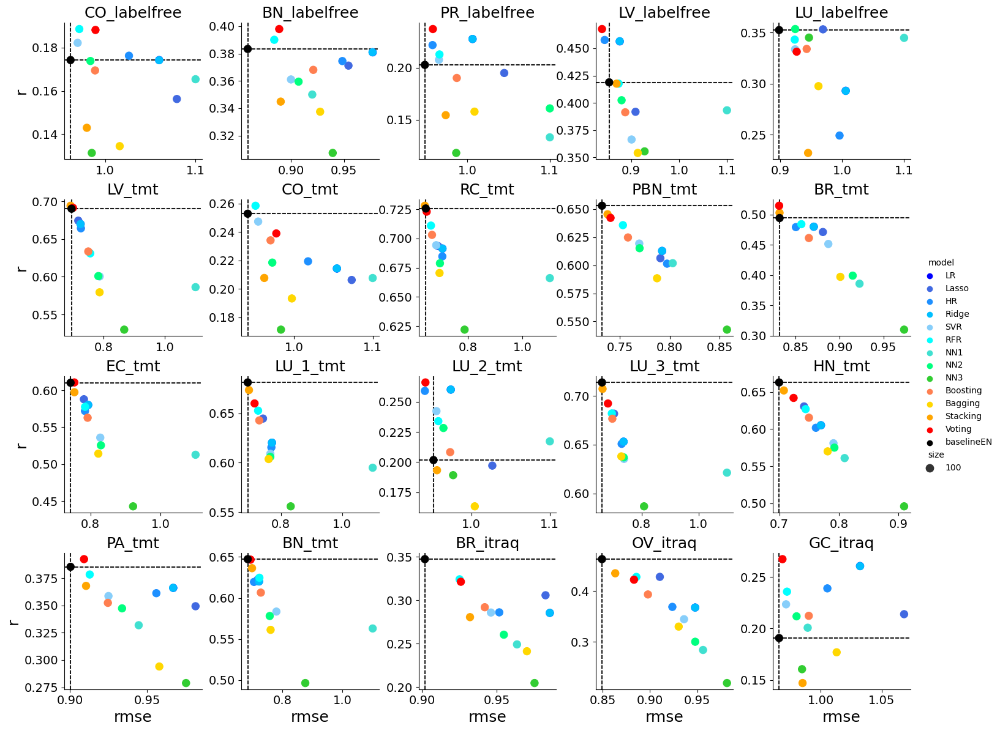

In [831]:
### models can be improved by mfs, show basline 
# fig, axes = plt.subplots(1, 1, figsize=(10, 6) )
# sns.scatterplot(data= df_draw.loc[xxx],  x='rmse', y='r', hue='model',  ax=axes,  legend='auto')

### V1
# g = sns.relplot( data=df_draw,  x='rmse', y='r', hue='model',  col="dataset", palette=my_color, #'tab20c',
#                 markers = 'o', sizes = (100,200), size = 'size', alpha = 0.8, col_wrap=5, kind ="scatter", height=3, aspect= 1, 
#             facet_kws={'sharey': False, 'sharex': False})
# for mykey, sub_g in zip(df_draw.dataset.unique(), g.axes):
#     sub_g.set_title(mykey, fontsize=13)
    
#     base_r = df_draw.loc[ (df_draw.model == 'baselineEN') & ( df_draw.dataset == mykey) , 'r'].values[0]
#     base_rmse = df_draw.loc[ (df_draw.model == 'baselineEN') & ( df_draw.dataset == mykey) , 'rmse'].values[0]
#     sub_g.axhline( y= base_r, color=".1", dashes=(3, 1), zorder=0)
#     sub_g.axvline( x = base_rmse, color=".1", dashes=(3, 1), zorder=0)
# filename =  '/media/eys/xwj/proteome/data/figs/figX2_scatter_r_rmse_comparision.png'
# plt.savefig(filename, format='png', dpi=200, bbox_inches="tight")

#### V2
myinput = df_draw.copy()
plt.rcParams["axes.labelsize"] = 18 ### 默认label字体大小是多少
g = sns.relplot( data=myinput,  x='rmse', y='r', hue='model',  col="ShortName", palette=my_color, 
               sizes = (80,200), size = 'size', alpha = 1, col_wrap=5, kind ="scatter", height=3, aspect= 1, edgecolor=None,
            facet_kws={'sharey': False, 'sharex': False})
for mykey, sub_g in zip(myinput.ShortName.unique(), g.axes):
#     print(mykey)
    sub_g.set_title(mykey, fontsize=18)
    sub_g.tick_params(axis = 'both', labelsize=14)
    base_r = myinput.loc[ (myinput.model == 'baselineEN') & ( myinput.ShortName == mykey) , 'r'].values[0]
    base_rmse = myinput.loc[ (myinput.model == 'baselineEN') & ( myinput.ShortName == mykey) , 'rmse'].values[0]
    sub_g.axhline( y= base_r, color=".1", dashes=(3, 1), zorder=0)
    sub_g.axvline( x = base_rmse, color=".1", dashes=(3, 1), zorder=0)
    
filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX2_scatter_r_rmse_comparision.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

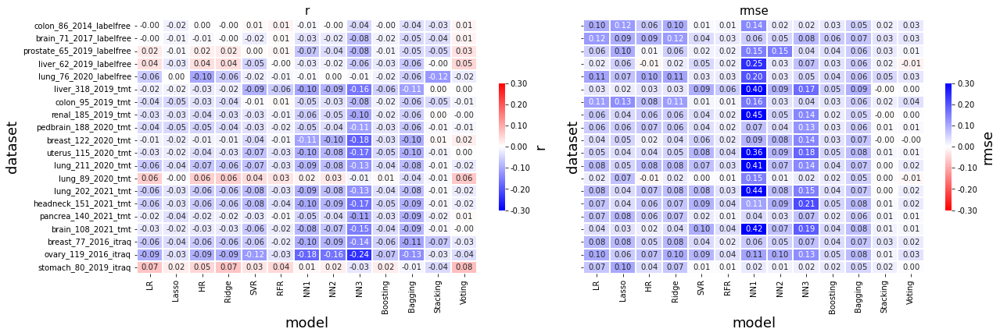

In [719]:
### how many models are better than baselineEN, 非常少

plt.rcParams["figure.figsize"] = (20, 6) ### datasets
fig, axes = plt.subplots(1, 2, sharex=True, sharey='row')
fig.subplots_adjust(wspace=0.05, hspace=0)

df_heatmap = df_draw.pivot(index=['dataset'], columns=['model'],).loc[dataset_ready,:]

for i in [0,1]:   
    metric = list_metric[i]
    mycmap = 'bwr' if (i == 0) else 'bwr_r'
    df_plot = df_heatmap.loc[:, (metric)].subtract( df_heatmap.loc[:, (metric, 'baselineEN')], axis = 0 ) 
    df_plot = df_plot.loc[:, list_model[:-3] ]

    sns.heatmap( df_plot, cmap= mycmap, center=0, annot=True, fmt='.2f', linewidths = 0.1, ax= axes[i], vmax=0.3, vmin=-0.3, 
                cbar_kws={'label':metric, "orientation": "vertical", 'format':'%.2f', 'shrink':0.5} )
    axes[i].set_title(metric, fontsize=15)
#     break
# filename =  '/media/eys/xwj/proteome/data/figs/figX2_heatmap_13_model_metric.png'
#  plt.savefig(filename, format='png', dpi=200, bbox_inches="tight")

###  2022/1/6  Figure 3A
feature selection can improve many models performances, more candidate models become better than baseline models

'colon_86_2014_labelfree', SVR，RFR  
'brain_71_2017_labelfree', voting, SVR, RFR,   
'prostate_65_2019_labelfree',**voting**, SVR, RFR  
'liver_62_2019_labelfree', Voting, Ridge, HR, LR,  
'lung_76_2020_labelfree', NN, RFR  
'liver_318_2019_tmt',    
'colon_95_2019_tmt', Voting,SVR< RFR,  
'renal_185_2019_tmt',  
'pedbrain_188_2020_tmt',
'breast_122_2020_tmt', voting
'uterus_115_2020_tmt', 
'lung_211_2020_tmt', fail
'lung_89_2020_tmt', Voting, 
'lung_202_2021_tmt', fail
'pancrea_140_2021_tmt',voting
'brain_108_2021_tmt', fail
'breast_77_2016_itraq', fail
'ovary_119_2016_itraq', fail 
'stomach_80_2019_itraq' ,Voting
 

In [737]:
myinput.head()

metric,model,feature selection,topn,mae,r,rmse,hit,size
0,LR,cosine,10,0.850978,0.174961,1.077905,1,100
26,LR,random,All,0.838425,0.174233,1.059745,1,100
35,LR,raw_cosine,All,0.838425,0.174233,1.059745,1,100
36,LR,spearmanr,10,0.848431,0.174540,1.074213,1,100
45,Lasso,cosine,10,0.831378,0.181151,1.053849,1,100


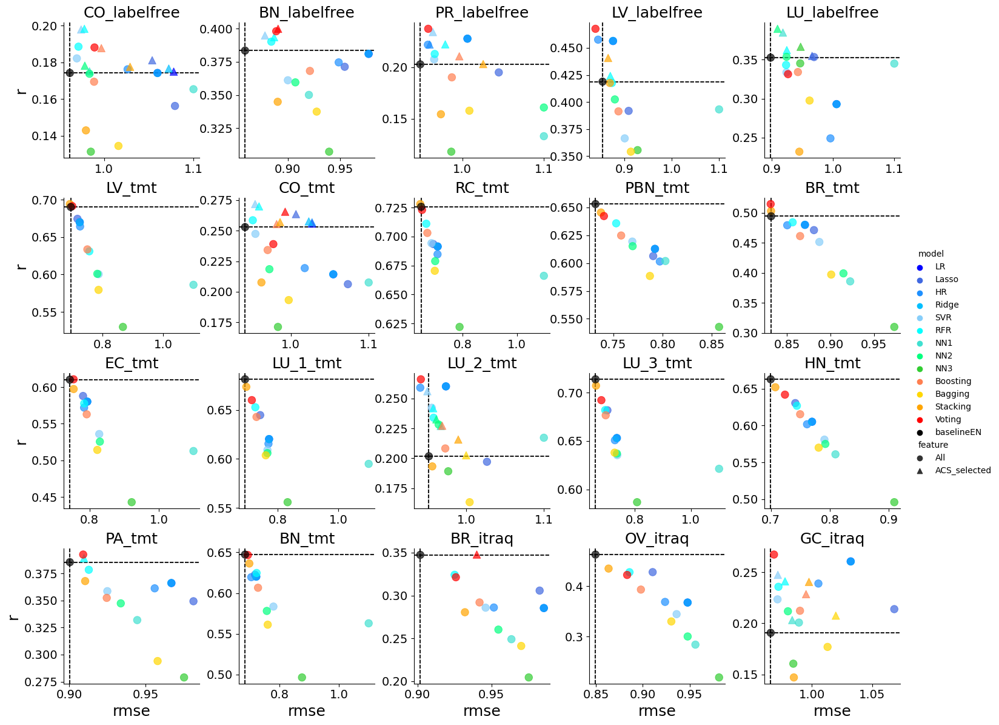

In [1088]:
### add 'cosine'  points to show improved model and, original 'All' model
## baseline 
base_r = df_metric_list_topn.loc[(dataset_ready, 'baselineEN' ),('custom', 'r','All')]

myinput = df_metric_list_topn.loc[(dataset_ready ),(['cosine','custom'])].stack(level=[0,2])#.reset_index()
# myinput.loc[:, 'topn'] = myinput.topn.astype(np.str)
myinput.loc[:, 'hit'] = 0
myinput.loc[:, 'size'] = 100
myinput.loc[(slice(None), slice(None), 'cosine', 'All'),'hit'] = 1

best_topn_per_model = myinput.groupby(level=[0,1])['r'].idxmax()
for idx, (d, m, mfs, topn) in best_topn_per_model.iteritems():
#     print(idx, topn)
    myinput.loc[(d, m, mfs, topn),'hit'] = 1
#     break
myinput.loc[:, 'hit'].sum(),myinput.shape

for mykey in dataset_ready:
    myinput.loc[mykey, 'outperfbase'] = (myinput.loc[mykey,'r'] >= base_r.loc[mykey].values[0]).values

## only 13 models + baselineEN
myinput = myinput.loc[(slice(None), list_model[:-2]),:]
myinput.loc[(slice(None), list_model[:-3], 'cosine', 'All'),'outperfbase']=True
myinput = myinput.loc[ myinput.outperfbase, : ].reset_index()
myinput.loc[:, 'rmse'] = myinput.loc[:,'rmse'].clip(upper=1.1)
myinput = myinput.loc[ (myinput.hit & myinput.outperfbase), : ]
myinput.loc[:, 'feature'] = [ 'All' if ( x == 'All') else 'ACS_selected' for x in myinput.loc[:, 'topn'] ]
myinput.loc[:, 'ShortName'] = df_summary.loc[ myinput['dataset'],  'ShortName' ].values

# test code v1:
# mykey = dataset_ready[0]
# mask = (myinput.dataset == mykey)
# g = sns.relplot(data=myinput.loc[mask] , x='rmse', y='r', hue='model', style= 'feature', style_order=['all','selected'],
#             size='size', sizes=(100, 200), legend='auto', height=5, palette='tab20', alpha=0.8,)

## 
# myinput = myinput.loc[ myinput.dataset.isin(['colon_95_2019_tmt', 'lung_76_2020_labelfree', 'stomach_80_2019_itraq']) ]

plt.rcParams["axes.labelsize"] = 18 ### 默认label字体大小是多少
g = sns.relplot( data=myinput,  x='rmse', y='r', hue='model',  col="ShortName", palette=my_color, 
                style= 'feature', style_order=['All','ACS_selected'], s= 80, markers = ['o','^'],#sizes = (80,200), size = 'size',
                alpha = 0.7, col_wrap=5, kind ="scatter", height=3, aspect= 1, edgecolor=None,
            facet_kws={'sharey': False, 'sharex': False})
for mykey, sub_g in zip(myinput.ShortName.unique(), g.axes):
#     print(mykey)
    sub_g.set_title(mykey, fontsize=18)
    sub_g.tick_params(axis = 'both', labelsize=14)
    base_r = myinput.loc[ (myinput.model == 'baselineEN') & ( myinput.ShortName == mykey) , 'r'].values[0]
    base_rmse = myinput.loc[ (myinput.model == 'baselineEN') & ( myinput.ShortName == mykey) , 'rmse'].values[0]
    sub_g.axhline( y= base_r, color=".1", dashes=(3, 1), zorder=0)
    sub_g.axvline( x = base_rmse, color=".1", dashes=(3, 1), zorder=0)
    
filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX3_scatter_r_rmse_comparision.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

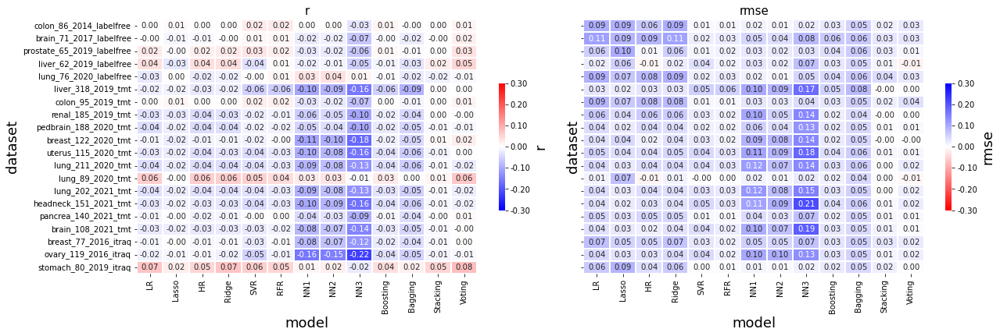

In [717]:
plt.rcParams["figure.figsize"] = (20, 6) ### datasets
fig, axes = plt.subplots(1, 2, sharex=True, sharey='row')
fig.subplots_adjust(wspace=0.05, hspace=0)

# df_heatmap = df_draw.pivot(index=['dataset'], columns=['model'],)

for i in [0,1]:   
    metric = list_metric[i]
    mycmap = 'bwr' if (i == 0) else 'bwr_r'

    myinput = df_metric_list_topn.loc[(dataset_ready, list_model[:-3]), ('cosine', metric)].stack(level=[0,]).reset_index()
    myinput.loc[:, 'topn'] = myinput.topn.astype(np.str)
    myinput = myinput.pivot(index=['dataset'], columns=['model','topn'],).droplevel(axis =1 ,level=0)
    myinput = myinput.clip(upper=1.1).loc[dataset_ready,:] ## RMSE clip at 1.1
# .rename({0:'r'},axis=1).
    base_r = df_metric_list_topn.loc[(dataset_ready, list_model[-3]), ('custom', metric, 'All')].values
    if metric == 'r':
        df_plot_select = myinput.sub( base_r, axis = 0).groupby(axis =1,by='model').max().loc[:, list_model[:-3] ] 
    else:
        df_plot_select = myinput.sub( base_r, axis = 0).groupby(axis =1,by='model').min().loc[:, list_model[:-3] ] 
#     df_plot_select = df_heatmap.loc[:, (metric)].subtract( df_heatmap.loc[:, (metric, 'baselineEN')], axis = 0 ) 
#     df_plot_select = df_plot_select.loc[:, list_model[:-3] ]

    sns.heatmap( df_plot_select, cmap= mycmap, center=0, annot=True, fmt='.2f', linewidths = 0.1, ax= axes[i], vmax=0.3, vmin=-0.3, 
                cbar_kws={'label':metric, "orientation": "vertical", 'format':'%.2f', 'shrink':0.5} )
    axes[i].set_title(metric, fontsize=15)
#     break

# filename =  '/media/eys/xwj/proteome/data/figs/figX3_heatmap_cosine_improve_metric.png'
# plt.savefig(filename, format='png', dpi=200, bbox_inches="tight")

### Figure 3B ACS improve model, compare to BaselineEN

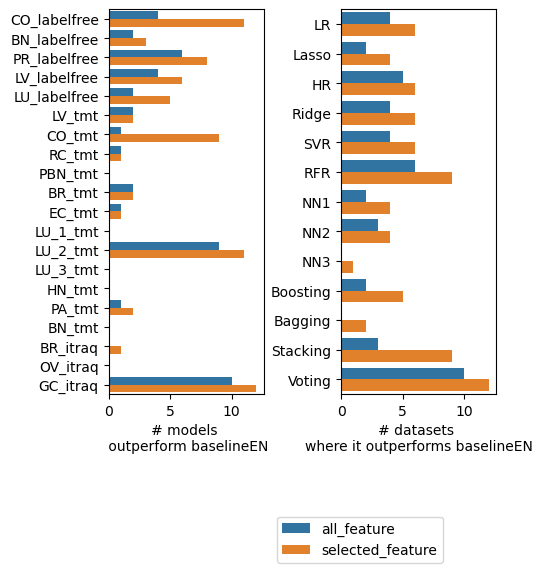

In [1400]:
metric = 'r'

metric = 'r'
df_draw = df_metric_list_topn.loc[(slice(None), list_model[:-2]), (['cosine','custom'], slice(None), 'All') ].stack([0,2])
df_draw = df_draw[ df_draw.all(axis = 1) ].reset_index()# level=[1,2,3])
df_draw.loc[:, 'rmse'] = df_draw['rmse'].clip(upper=1.1)
df_draw.loc[:, 'size'] = 100
df_draw.pivot(index=['dataset'], columns=['model'],).loc[dataset_ready,:]
df_plot = df_heatmap.loc[:, (metric)].subtract( df_heatmap.loc[:, (metric, 'baselineEN')], axis = 0 ) 
df_plot = df_plot.loc[:, list_model[:-3] ]

myinput = df_metric_list_topn.loc[(dataset_ready, list_model[:-3]), ('cosine', metric)].stack(level=[0,]).reset_index()
myinput.loc[:, 'topn'] = myinput.topn.astype(np.str)
myinput = myinput.pivot(index=['dataset'], columns=['model','topn'],).droplevel(axis =1 ,level=0)
myinput = myinput.clip(upper=1.1).loc[dataset_ready,:] ## RMSE clip at 1.1

# .rename({0:'r'},axis=1).
base_r = df_metric_list_topn.loc[(dataset_ready, list_model[-3]), ('custom', metric, 'All')].values
if metric == 'r':
    df_plot_select = myinput.sub( base_r, axis = 0).groupby(axis =1,by='model').max().loc[:, list_model[:-3] ] 

plt.rcParams.update(plt.rcParamsDefault)

plt.rcParams["figure.figsize"] = (5, 5) ### datasets
fig, axes = plt.subplots(1, 2, sharex=False, sharey=False)
fig.subplots_adjust(wspace=0.5, hspace=0)
data_bar = pd.concat( [ (df_plot > 0).sum(axis =1), (df_plot_select > 0).sum(axis = 1)], 
          axis =1, keys=['all_feature','selected_feature'])
data_bar = data_bar.stack().reset_index()

sns.barplot(data= data_bar, y= 'dataset', x =0,hue ='level_1', orient='h', ax = axes[0])
axes[0].get_legend().remove() 
axes[0].set_xlabel('# models \n outperform baselineEN')
axes[0].set_ylabel(None)
axes[0].set_yticklabels(df_summary.loc[dataset_ready, 'ShortName'])
data_bar = pd.concat( [ (df_plot > 0).sum(axis =0), (df_plot_select > 0).sum(axis = 0)], 
          axis =1, keys=['all_feature','selected_feature'])
data_bar = data_bar.stack().reset_index()

sns.barplot(data= data_bar, y= 'model', x =0, hue ='level_1', orient='h', ax = axes[1])
axes[1].set_xlabel('# datasets \nwhere it outperforms baselineEN')
axes[1].set_ylabel(None)
axes[1].legend(bbox_to_anchor=(0.5, -0.5, 0.2, 0.2) )

# (df_plot_select > df_plot ).sum(axis = 1)
filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX3_bar_comparision.' + filetype
# plt.savefig(filename, format=filetype,  dpi=200,  transparent=True,  bbox_inches="tight")

colon_86_2014_labelfree


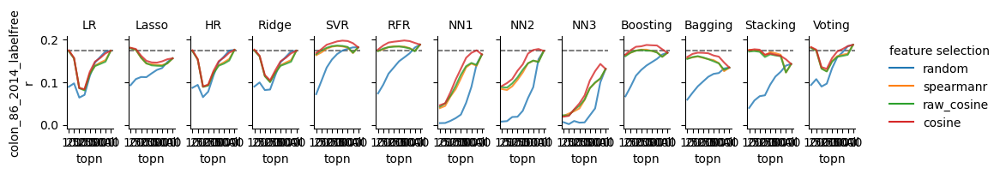

In [786]:
method_feature_select = ["cosine", "raw_cosine", "spearmanr", "random", "custom"]
list_model = list(model_dict.keys())

mykey = df_summary.index[-1]
for mykey in dataset_ready:
    print(mykey)
    myinput = df_metric_list_topn.loc[(mykey, list_model[:-3]), (method_feature_select[:-1], 'r')].droplevel(0).unstack().reset_index()
    myinput.loc[:, 'topn'] = myinput.topn.astype(np.str)
    ## trend of changing 
    g = sns.relplot( data=myinput, x="topn", y=0, hue="feature selection", 
                hue_order = ['random','spearmanr','raw_cosine', 'cosine'], 
                col="model", col_wrap=13, kind="line", height=2, aspect=0.4, ci=0, alpha = 0.8,
                facet_kws={'sharey': True, 'sharex': True})
    base_r = df_draw.loc[ (df_draw.model == 'baselineEN') & ( df_draw.dataset == mykey) , 'r'].values[0]
    (g.map(plt.axhline, y= base_r, color=".5", dashes=(3, 1), zorder=0)
#     base_r = df_draw.loc[ (df_draw.loc[:, 'feature selection'] == 'custom') & ( df_draw.dataset == mykey) , 'r'].values
#     (g.map(plt.axhline, y= base_r[0], color=".3", dashes=(1, 1), zorder=0)
#      .map(plt.axhline, y= base_r[1], color=".3", dashes=(3, 1), zorder=0)
#      .map(plt.axhline, y= base_r[2], color=".3", dashes=(5, 1), zorder=0)
      .set_axis_labels("topn", mykey +"\n"+"r" )
      .set_titles("{col_name}")
      .tight_layout(w_pad=0))
    break
#     filename =  '/media/eys/xwj/proteome/data/figs/figX3_line_r_mfs_comparision_%s.png' % mykey
#     plt.savefig(filename, format='png', dpi=200, bbox_inches="tight")

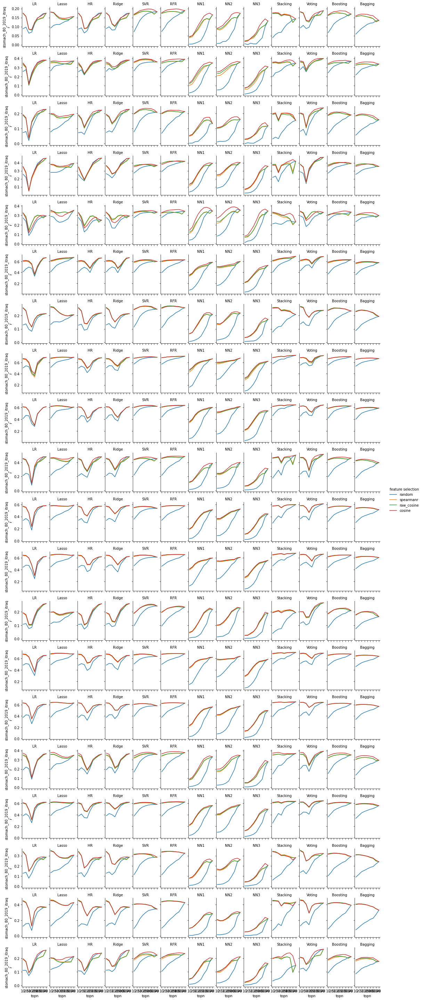

In [971]:
### v1
myinput = df_metric_list_topn.loc[(dataset_ready, list_model[:-3]), (method_feature_select[:-1], 'r')].stack(level=[0,1,2,]).reset_index()
myinput.loc[:, 'topn'] = myinput.topn.astype(np.str)
# myinput = df_metric_list_topn.loc[(mykey, list_model[:-3]), (method_feature_select[:-1], 'r')].droplevel(0).unstack().reset_index()
## trend of changing 
g = sns.relplot( data=myinput, x="topn", y=0, hue="feature selection", 
            hue_order = ['random','spearmanr','raw_cosine', 'cosine'], 
            col="model",row='dataset', kind="line", height=2, aspect=0.6, ci=0, alpha = 1,
            facet_kws={'sharey': 'row', 'sharex': 'col'})
(g.set_axis_labels("topn", mykey +"\n"+"r" )
.set_titles("{col_name}")
  .tight_layout(w_pad=0))

### Figure 3 supplemental.
supplement Figures: lineplot x 3, heatmap x3, swarmplot+ heatmap(voting-wt vs voting ).
at different feature length, which one mfs is best？

/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/ipykernel_launcher.py:27: UserWarning: FixedFormatter should only be used together with FixedLocator
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/ipykernel_launcher.py:27: UserWarning: FixedFormatter should only be used together with FixedLocator
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/ipykernel_launcher.py:27: UserWarning: FixedFormatter should only be used together with FixedLocator


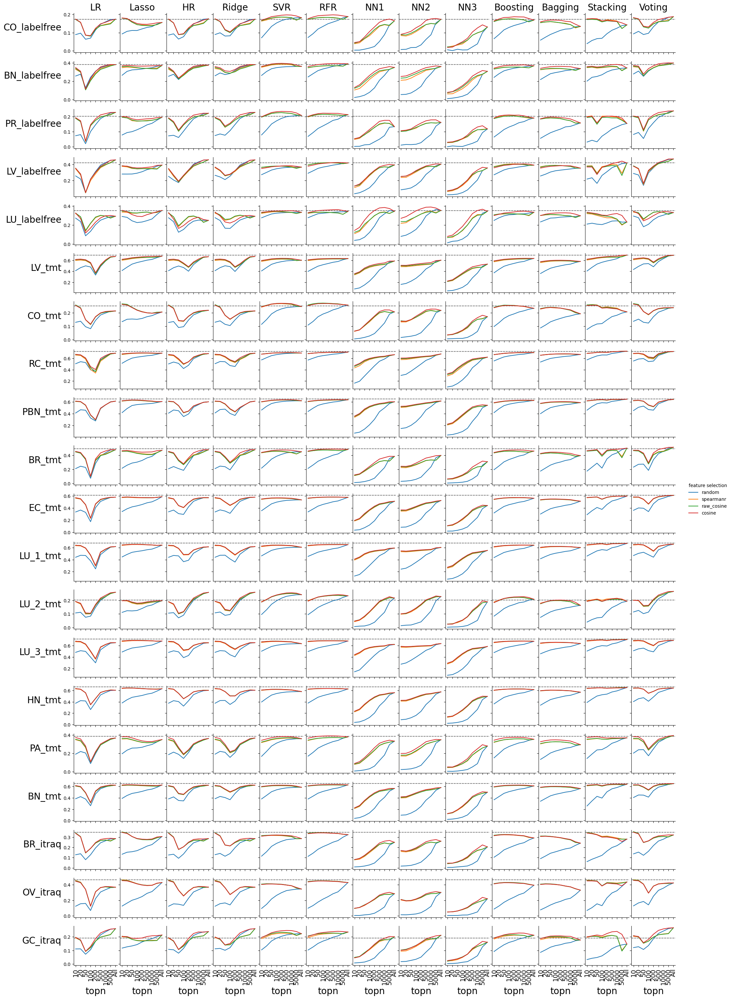

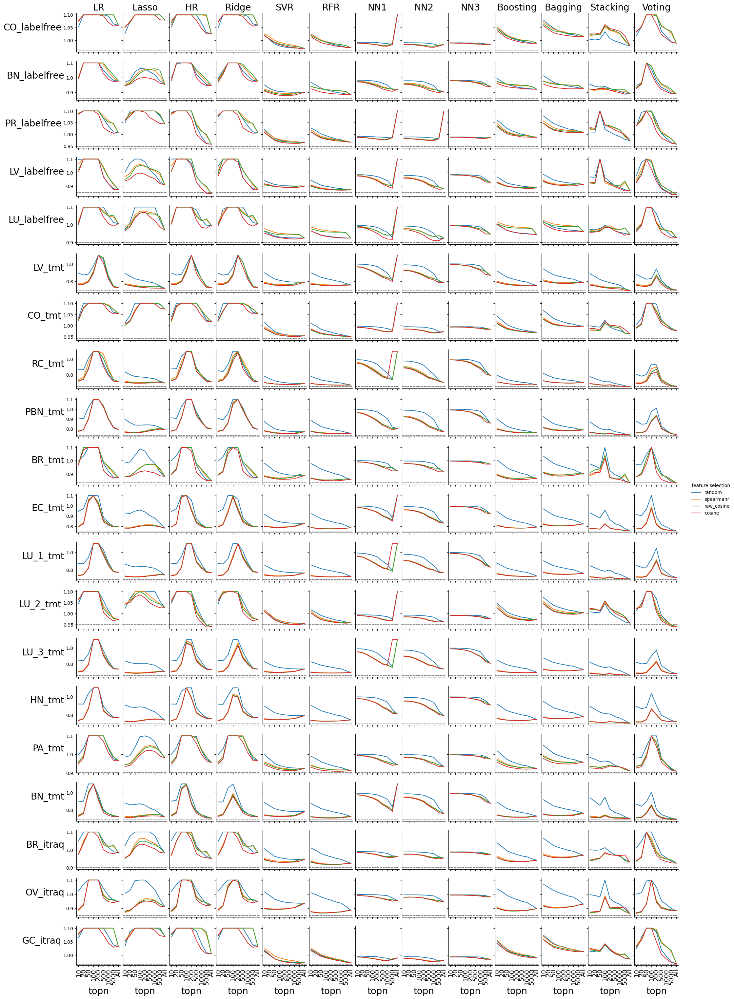

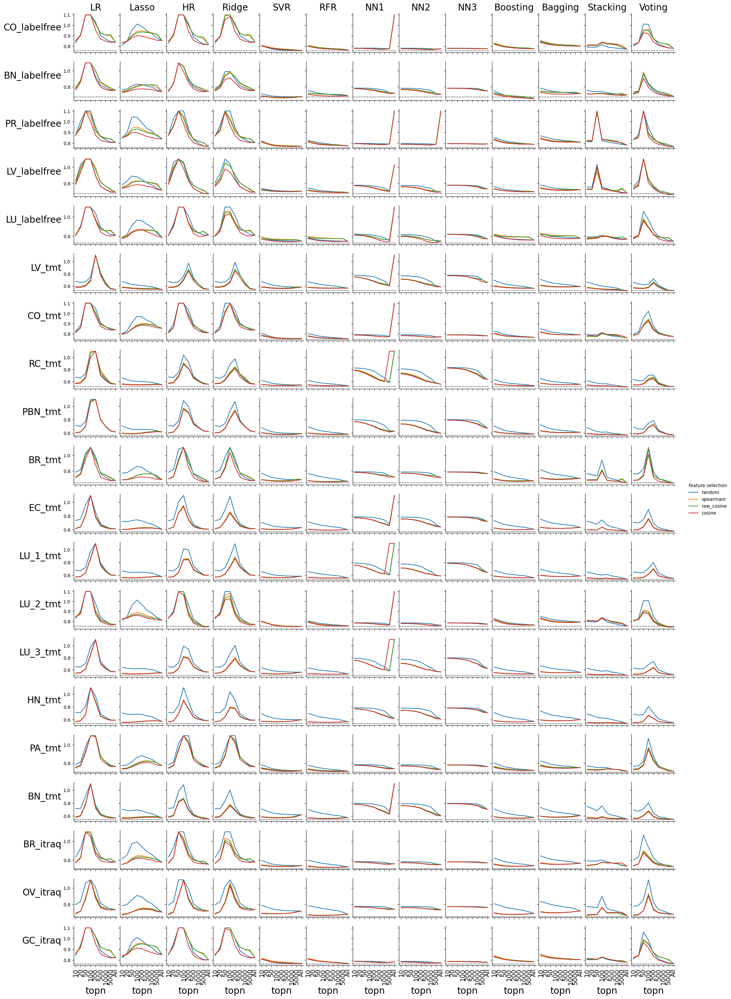

In [1403]:
### v2 做成一张大图 20 D x 13 M

for metric in list_metric:
    myinput = df_metric_list_topn.loc[(dataset_ready[:], list_model[:-3]), (method_feature_select[:-1], metric)].stack(level=[0,1,2,]).reset_index()
    myinput.loc[:, 'topn'] = myinput.topn.astype(np.str)
    myinput.loc[:, 0] = myinput.loc[:, 0].clip(upper=1.1)
#     myinput.loc[:, 'dataset'] = df_summary.loc[myinput.dataset, 'ShortName'].values
    ## trend of changing 
    g = sns.relplot( data=myinput, x="topn", y=0, hue="feature selection", 
                hue_order = ['random','spearmanr','raw_cosine', 'cosine'], 
                col="model",row='dataset', kind="line", height=1.5, aspect=1, ci=0, alpha = 1,
                facet_kws={'sharey': 'row', 'sharex': 'col'})
    (g .tight_layout(w_pad=0, h_pad=0))
    
    for (row_val, col_val), ax in g.axes_dict.items():
        if col_val == list_model[0]:
#             print(row_val, col_val)
            shortname = df_summary.loc[row_val, 'ShortName']
            ax.set_ylabel(shortname, fontsize=20, rotation=0, ha ='right')
        if row_val == dataset_ready[0]:
            ax.set_title(col_val, fontsize = 20)
        else:
            ax.set_title(None)
        if row_val == dataset_ready[-1]:
            ax.set_xlabel('topn', fontsize=20)
#         print('here')
        ax.set_xticklabels(list_topn, fontsize=14, rotation = 90, ha ='center')
        base_r = df_draw.loc[ (df_draw.model == 'baselineEN') & ( df_draw.dataset == row_val) , metric].values[0]
        ax.axhline( y= base_r, color=".5", dashes=(3, 1), zorder = 0)
   
    filetype = 'svg'
    filename =  '/media/eys/xwj/proteome/data/figs/figS2_lineplot_mfs_comparision_acs_best_%s.%s' % (metric, filetype)
    plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

In [1395]:
myinput.loc[:, 'dataset'] = df_summary.loc[myinput.dataset, 'ShortName'].values
myinput

,dataset,model,feature selection,metric,topn,0
0,CO_labelfree,LR,cosine,r,10,0.174961
1,CO_labelfree,LR,cosine,r,20,0.157342
2,CO_labelfree,LR,cosine,r,50,0.086116
3,CO_labelfree,LR,cosine,r,100,0.083766
4,CO_labelfree,LR,cosine,r,200,0.124425
...,...,...,...,...,...,...
9355,GC_itraq,Voting,spearmanr,r,200,0.199418
9356,GC_itraq,Voting,spearmanr,r,500,0.215975
9357,GC_itraq,Voting,spearmanr,r,1000,0.221848
9358,GC_itraq,Voting,spearmanr,r,5000,0.225240


In [772]:
datalist= df_summary.index
method_feature_select = ["cosine", "raw_cosine", "spearmanr", "random", "custom"]

df_mfs_rank =  pd.DataFrame(data = 0, 
                          index = df_summary.index, 
                          columns= pd.MultiIndex.from_product([ list_model[:-3], ['r','rmse', 'mae'], method_feature_select[:-1]],
                                                              names=[  "model", "metric","feature selection",]))
                                                        
for mykey in datalist:
    for my_model in list_model[:-3]:
        for metric in ['r','rmse', 'mae']:
            switch_ascending = False if metric == 'r' else True
            mfs_rank = df_metric_list_topn.loc[(mykey, my_model),  (method_feature_select[:-1], metric)]\
                .droplevel(level=1).unstack().drop(columns='All').rank(axis=0, ascending = switch_ascending, method='min')
            df_mfs_rank.loc[mykey, (my_model, metric )] = (mfs_rank == 1).sum(axis=1).values

model                          LR                                     \
metric                          r                               rmse   
feature selection          cosine raw_cosine spearmanr random cosine   
Name                                                                   
colon_86_2014_labelfree         5          0         1      2      7   
brain_71_2017_labelfree         5          0         0      3      5   
prostate_65_2019_labelfree      8          0         0      0      7   
liver_62_2019_labelfree         3          1         0      4      5   
lung_76_2020_labelfree          3          5         0      0      5   
liver_318_2019_tmt              8          0         0      0      8   
colon_95_2019_tmt               6          2         0      0      6   
renal_185_2019_tmt              8          0         0      0      8   
pedbrain_188_2020_tmt           7          0         0      1      5   
breast_122_2020_tmt             8          0         0      0      6   
uterus_115_2020_tmt             8          0         0      0      8   
lung_211_2020_tmt               5          3         0      0      6   
lung_89_2020_tmt                7          1         0      0      7   
lung_202_2021_tmt               2          6         0      0      6   
headneck_151_2021_tmt           2          5         1      0      7   
pancrea_140_2021_tmt            7          0         0      1      8   
brain_108_2021_tmt              8          0         0      0      8   
breast_77_2016_itraq            5          1         2      0      7   
ovary_119_2016_itraq            2          1         5      0      6   
stomach_80_2019_itraq           7          1         0      0      7   

model                                                                     ...  \
metric                                                    mae             ...   
feature selection          raw_cosine spearmanr random cosine raw_cosine  ...   
Name                                                                      ...   
colon_86_2014_labelfree             0         0      1      7          0  ...   
brain_71_2017_labelfree             0         0      3      8          0  ...   
prostate_65_2019_labelfree          0         0      1      8          0  ...   
liver_62_2019_labelfree             0         0      3      6          0  ...   
lung_76_2020_labelfree              2         0      1      5          2  ...   
liver_318_2019_tmt                  0         0      0      8          0  ...   
colon_95_2019_tmt                   2         0      0      6          1  ...   
renal_185_2019_tmt                  0         0      0      8          0  ...   
pedbrain_188_2020_tmt               0         2      1      7          0  ...   
breast_122_2020_tmt                 0         0      2      8          0  ...   
uterus_115_2020_tmt                 0         0      0      8          0  ...   
lung_211_2020_tmt                   2         0      0      6          2  ...   
lung_89_2020_tmt                    0         0      1      7          0  ...   
lung_202_2021_tmt                   2         0      0      5          3  ...   
headneck_151_2021_tmt               1         0      0      6          2  ...   
pancrea_140_2021_tmt                0         0      0      8          0  ...   
brain_108_2021_tmt                  0         0      0      8          0  ...   
breast_77_2016_itraq                1         0      0      7          1  ...   
ovary_119_2016_itraq                0         2      0      6          0  ...   
stomach_80_2019_itraq               0         0      1      7          0  ...   

model                         Voting                                     \
metric                             r          rmse                        
feature selection          spearmanr random cosine raw_cosine spearmanr   
Name                                                                      
colon_86_2014_labelfree   

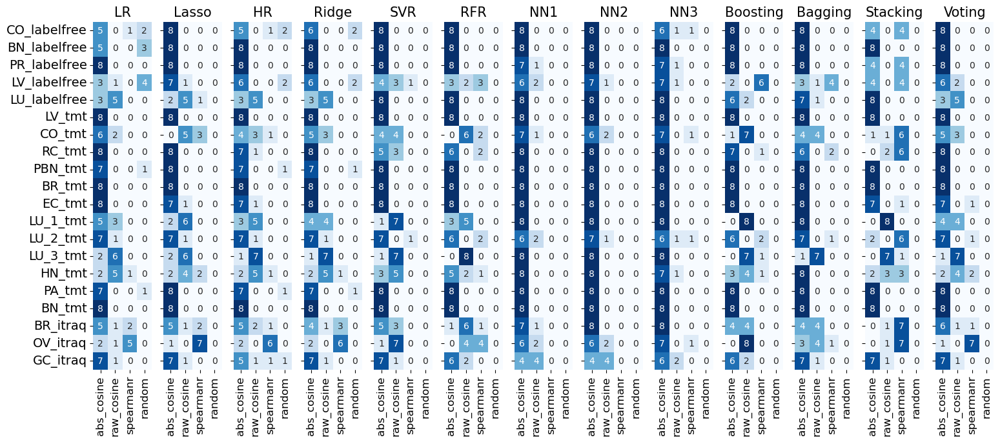

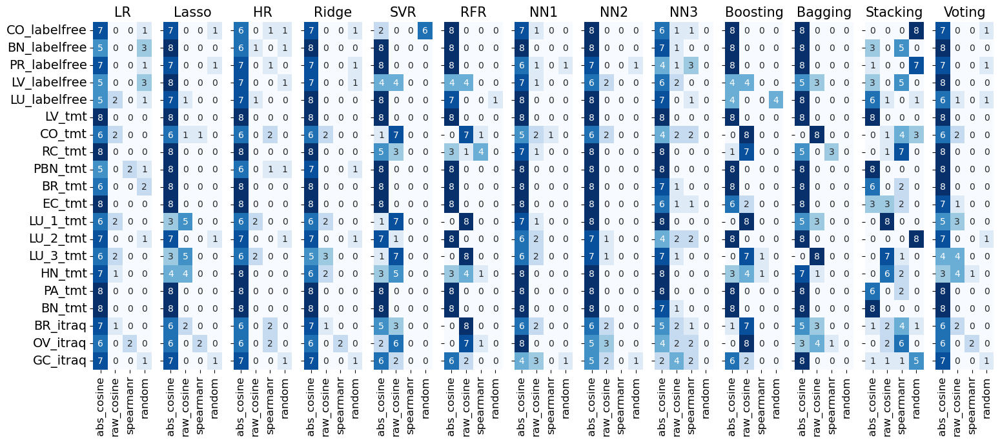

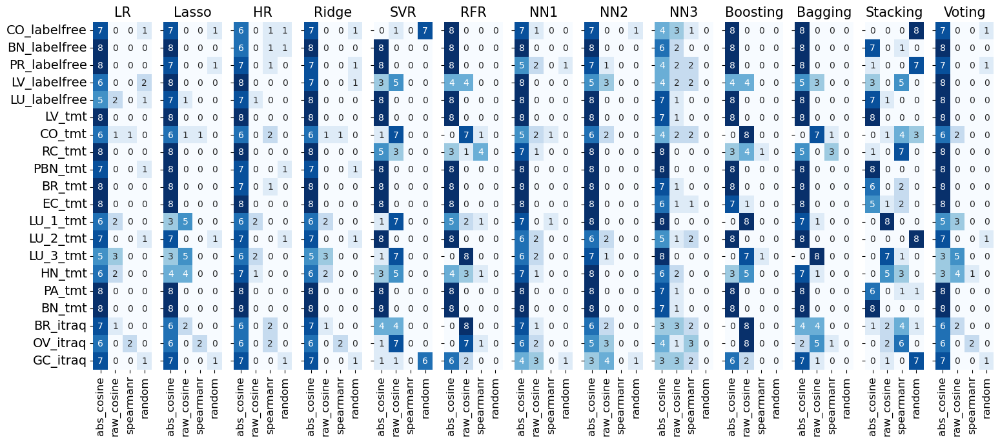

In [785]:
n = len(list_model[:-3])
plt.rcParams["figure.figsize"] = (18, 7) ### datasets

for metric in ['r', 'rmse', 'mae']:
    fig, axes = plt.subplots(1, n, sharex=True, sharey='row')
    fig.subplots_adjust(wspace=0.2, hspace=0.3)
    for i, my_model in zip(range(n), list_model[:-3]):
    #     print(i , my_model)
        how_show_cbar = {'label': '# times Number of times each feature selection method ranks first\nby '+ metric.upper() } if i== (n-1) else {}
        show_or_not = True if i== (n-1) else False
        show_or_not = False
        sns.heatmap( df_mfs_rank.loc[:, (my_model, metric)], cmap='Blues', annot=True, fmt='.0f', linewidths = 0, cbar= show_or_not, ax= axes[i],
                   cbar_kws=how_show_cbar)
        axes[i].tick_params(axis="x", rotation=90)
        axes[i].set_xticklabels(['abs_cosine', 'raw_cosine', 'spearmanr','random'], fontsize=12)
        axes[i].set_yticklabels(df_summary.loc[datalist,'ShortName'], fontsize=14)
        axes[i].set_title(my_model, fontsize=15)
        axes[i].set_ylabel(None)
        axes[i].set_xlabel(None)

    filetype = 'svg'
    filename =  '/media/eys/xwj/proteome/data/figs/figX3_heatmap_mfs_comparision_acs_best_%s.%s' % (metric, filetype)
    # filename =  '/media/eys/xwj/proteome/data/figs/figX3_boxplot_13model_comparision.' + filetype
    plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

### Figure 3. Boxplot, which models perform best across all dataset? 
voting ensemble is relatively better than other models 

In [1074]:
## compute baslineEN performance
baseline = df_metric_list_topn.loc[(dataset_ready, list_model[-3] ),('custom',slice(None), 'All')]\
.droplevel(axis=0, level=1).droplevel(axis=1, level=[0,2])
baseline.head()

## then, 13 condidate models performance
myinput = df_metric_list_topn.loc[(dataset_ready,list_model[:-3] ),(['cosine'])].stack(level=[0,2])#.reset_index()
# myinput.loc[:, 'topn'] = myinput.topn.astype(np.str)
myinput.loc[:, 'hit'] = 0
myinput.loc[:, 'rmse'] = myinput['rmse'].clip(upper=1.1)
myinput.loc[:, 'mae'] = myinput['mae'].clip(upper=1)

best_topn_per_model = myinput.groupby(level=[0,1])['r'].idxmax()
for idx, (d, m, mfs, topn) in best_topn_per_model.iteritems():
#     print(idx, topn)
    myinput.loc[(d, m, mfs, topn),'hit'] = 1

myinput.loc[:, 'hit'].sum(),myinput.shape
myinput = myinput.loc[ myinput.hit == 1, list_metric ]

## Last, normalize performance by baseline model EN
for mykey in dataset_ready:
    myinput.loc[mykey] = myinput.loc[mykey].div( baseline.loc[mykey], axis =1).values

myinput = myinput.reset_index()
myinput.loc[:, 'dataset'] = df_summary.loc[ myinput.dataset,'ShortName'].values
myinput.head()

metric,dataset,model,feature selection,topn,r,rmse,mae
0,CO_labelfree,LR,cosine,10,1.004149,1.120852,1.126510
1,CO_labelfree,Lasso,cosine,10,1.039672,1.095838,1.100564
2,CO_labelfree,HR,cosine,All,1.011436,1.067194,1.079547
3,CO_labelfree,Ridge,cosine,10,1.013804,1.115105,1.120644
4,CO_labelfree,SVR,cosine,500,1.136096,1.013122,1.010534


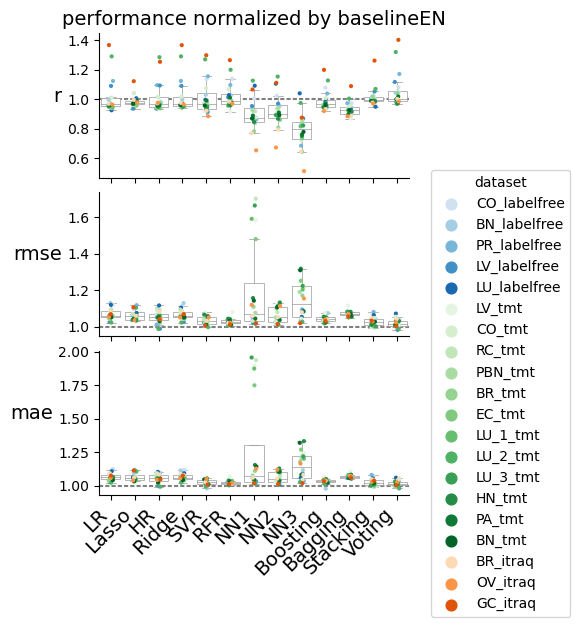

In [1075]:
## colors mapping for each datasetis the same order as in  figure 1 , prepare the custom cmap: blue+ greeen + orange
cmap = plt.get_cmap("Blues")
outer_colors = cmap([50, 90, 120, 160, 200])

cmap = plt.get_cmap("Greens")
outer_colors = np.vstack([outer_colors, cmap([30, 50, 70, 90, 105, 120, 135, 150, 170, 190, 210, 230])])

cmap = plt.get_cmap("Oranges")
outer_colors = np.vstack([outer_colors, cmap([50, 120,180])])

plt.rcParams["figure.figsize"] = (4, 6) 
fig, axes = plt.subplots(3, 1, sharex=True, sharey=False )
fig.subplots_adjust(wspace=0.2, hspace=0.1 )
for i in range(3):
    mymetric  = list_metric[i]
    sns.boxplot(data=myinput, x="model", y=mymetric, color='white', saturation=1, order= list_model[:-3], 
                width=0.8, linewidth=0.5, dodge=True, fliersize=0, ax=axes[i])
    sns.stripplot(data=myinput, x="model", y=mymetric, hue = 'dataset', order= list_model[:-3], 
                  palette=outer_colors, ax=axes[i], size =3, dodge=False)#color=".25")
    if i == 0:
        axes[i].set_title('performance normalized by baselineEN', fontsize = 14)
    if i == 1:
        axes[i].legend(bbox_to_anchor=(1.05, 1, 0.1, 0.2), title='dataset')
    else: 
        axes[i].get_legend().remove() 
    axes[i].set_xticklabels(list_model[:-3], fontsize=14, rotation = 45,ha ='right')
    axes[i].set_ylabel(mymetric, fontsize=14, rotation = 0, ha ='right')
    axes[i].axhline( y= 1, color=".5", dashes=(2, 1), zorder = 0)
    axes[i].set_xlabel(None)
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX3_boxplot_13model_comparision.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

### Figure 4. if at different ratio (regression: proxy), which models perform best across all dataset? 


In [ ]:
mfs = 'cosine' # 
metric = 'r'

nCPU=30

df_best_flen = df_metric_list_topn.loc[:, (['cosine', 'custom'], metric)].idxmax(axis = 1)
df_best_flen.loc[mykey]

In [ ]:
%%time
## focus on 'r' metric: get topn with best performance of models

list_model_14 = ['LR', 'Lasso', 'HR', 'Ridge', 'SVR', 'RFR', 'NN1', 'NN2', 'NN3', 'Stacking', 'Voting', 'Boosting', 'Bagging', 'teamHL&YG']
list_wp = [1,9,7,5,3,1,1,1,1,1,0]
list_wr  = [0,1,1,1,1,1,3,5,7,9,1]

inner_cols = [ str(wp)+":"+str(wr) for wp, wr in zip(list_wp, list_wr) ]
jobs = [(m, wp_wr) for m in list_model_14 for wp_wr in inner_cols ]

print(nCPU, inner_cols, list_model_14)

mindex = pd.MultiIndex.from_product([ df_summary.index, list_model_14], names=["dataset", "model"])
mcols = pd.MultiIndex.from_product([ ['CVtrain', 'CVtest'], ['r', 'rmse', 'mae'], inner_cols, range(N) ], names=[ "group", "metric", "ratio","split"])
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>><<<<<<<
print('make new df_out. press Enter to continue: ')
# my_input = input()
df_out_fixflen = pd.DataFrame(data = 0, index = mindex, columns= mcols)

kf = KFold(n_splits=N, random_state=1, shuffle=True)

In [87]:
for mykey in dataset_ready[18:]:# df_summary.index[3:5]:

    with open( '/public/home/test1/mydata/proteome/data/' + df_summary.loc[mykey, "resultpkl_metric"], 'rb') as f:
        [ res ]=pickle.load(f)
    
    print( mykey.ljust(30,'-'), end=':' )
    
    X = dict_dataset[mykey]["RNA"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
    Y = dict_dataset[mykey]["protein"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
#     Y = Y.iloc[:, :30]
    ## proxy model need common genes
    common_genes = list(set(X.columns) & set(Y.columns))
    
    res_proxy = dict()
    res_proxy['y_pred_CVtrain'], res_proxy['y_pred_CVtest']  = {}, {}

    for i, (train_index, test_index) in zip(range(N), kf.split(Y)): 
        X_train, X_test = X.iloc[train_index],  X.iloc[test_index]
        Y_train, Y_test = Y.iloc[train_index],  Y.iloc[test_index]

        sample_index = dict({'CVtrain':Y.index[train_index], 'CVtest':Y.index[test_index]})

        res_proxy['y_pred_CVtrain'][i] = X_train.loc[:, common_genes]
        res_proxy['y_pred_CVtest'][i] = X_test.loc[:, common_genes]
        Y_train, Y_test = Y_train.loc[:, common_genes], Y_test.loc[:, common_genes]

        ############ ratio of proxy:gene-specific model (only at optimal feature length )
        y_pred_mix = dict.fromkeys(['CVtrain', 'CVtest'])
        for group in y_pred_mix:
            y_pred_mix[group] = dict.fromkeys(list_model_14)
            for m in list_model_14:
                y_pred_mix[group][m] = dict.fromkeys(inner_cols)

                mfs, _, topn = df_best_flen.loc[mykey, m] # ('custom', 'r', 'All')
                topn = X.shape[1] if topn == 'All' else topn
                y_pred = pd.DataFrame(data=np.array( res[mfs][topn][m]['y_pred_'+group][i]).T, 
                                      index = sample_index[group], 
                                      columns =Y.columns)
                y_pred = y_pred.loc[:, common_genes]
                for wp, wr in zip(list_wp, list_wr):
                    y_pred_mix[group][m][str(wp) + ":" + str(wr)] = (res_proxy['y_pred_'+group][i]*wp+ y_pred*wr)/(wp+wr)


        ##### output df_out_fixflen
        def speed_up_metric(y_true,  y_pred,  tuple_m_wp_wr):
            (m, wp_wr) = tuple_m_wp_wr
            proteins = y_true.columns
            return m, wp_wr,\
                np.nan_to_num([ np.corrcoef(y_true[g], y_pred[m][wp_wr][g])[1,0] for g in proteins]).mean(), \
                np.nan_to_num([ np.sqrt(metrics.mean_squared_error(y_true[g], y_pred[m][wp_wr][g])) for g in proteins ]).mean(), \
                np.nan_to_num([ metrics.mean_absolute_error(y_true[g], y_pred[m][wp_wr][g]) for g in proteins ]).mean()


        with Pool(nCPU) as pool:
            group = 'CVtest'
            metrics_in_rows = pool.map(partial(speed_up_metric, Y_test, y_pred_mix[group]), jobs)
            for m, wp_wr, one_r, one_rmse, one_mae in metrics_in_rows:
                df_out_fixflen.loc[(mykey, m), (group,'r', wp_wr, i)] = one_r
                df_out_fixflen.loc[(mykey, m), (group,'rmse', wp_wr,i)] = one_rmse
                df_out_fixflen.loc[(mykey, m), (group,'mae', wp_wr,i)] = one_mae
            group = 'CVtrain'
            metrics_in_rows = pool.map(partial(speed_up_metric, Y_train, y_pred_mix[group]), jobs)
            for m, wp_wr, one_r, one_rmse, one_mae in metrics_in_rows:
                df_out_fixflen.loc[(mykey, m), (group,'r', wp_wr, i)] = one_r
                df_out_fixflen.loc[(mykey, m), (group,'rmse', wp_wr,i)] = one_rmse
                df_out_fixflen.loc[(mykey, m), (group,'mae', wp_wr,i)] = one_mae
        print(time.ctime(), 'split', i, 'proxy: regress mix done')

ovary_119_2016_itraq----------:Tue Jan  4 22:54:45 2022 split 0 proxy: regress mix done
Tue Jan  4 22:57:48 2022 split 1 proxy: regress mix done
Tue Jan  4 23:00:48 2022 split 2 proxy: regress mix done
Tue Jan  4 23:03:54 2022 split 3 proxy: regress mix done
Tue Jan  4 23:06:59 2022 split 4 proxy: regress mix done
stomach_80_2019_itraq---------:Tue Jan  4 23:12:05 2022 split 0 proxy: regress mix done
Tue Jan  4 23:15:05 2022 split 1 proxy: regress mix done
Tue Jan  4 23:18:07 2022 split 2 proxy: regress mix done
Tue Jan  4 23:21:06 2022 split 3 proxy: regress mix done
Tue Jan  4 23:23:50 2022 split 4 proxy: regress mix done


In [89]:
outfile = '/public/home/test1/mydata/proteome/data/df_out_fixflen' + \
    time.strftime("%Y%m%d-%H%M")+ '.pkl'
print(outfile)
with open(outfile, 'wb') as f: 
    pickle.dump( [df_out_fixflen],  f)

/public/home/test1/mydata/proteome/data/df_out_fixflen20220105-0749.pkl


In [1436]:
mindex = pd.MultiIndex.from_product([ df_summary.ShortName, list_model_14], names=["dataset", "model"])
df_out_fixflen.index  = mindex
df_out_fixflen

group                    CVtrain                                          \
metric                         r                                           
ratio                        1:0                                           
split                          0         1         2         3         4   
dataset      model                                                         
CO_labelfree LR         0.236310  0.243510  0.241803  0.242196  0.242840   
             Lasso      0.236310  0.243510  0.241803  0.242196  0.242840   
             HR         0.236310  0.243510  0.241803  0.242196  0.242840   
             Ridge      0.236310  0.243510  0.241803  0.242196  0.242840   
             SVR        0.236310  0.243510  0.241803  0.242196  0.242840   
...                          ...       ...       ...       ...       ...   
GC_itraq     Stacking   0.258461  0.280247  0.265117  0.242866  0.234443   
             Voting     0.258461  0.280247  0.265117  0.242866  0.234443   
             Boosting   0.258461  0.280247  0.265117  0.242866  0.234443   
             Bagging    0.258461  0.280247  0.265117  0.242866  0.234443   
             teamHL&YG  0.258461  0.280247  0.265117  0.242866  0.234443   

group                                                                     ...  \
metric                                                                    ...   
ratio                        9:1                                          ...   
split                          0         1         2         3         4  ...   
dataset      model                                                        ...   
CO_labelfree LR         0.285446  0.289477  0.290370  0.293174  0.291304  ...   
             Lasso      0.282565  0.286820  0.287617  0.290314  0.288513  ...   
             HR         0.332923  0.336897  0.339118  0.341999  0.339516  ...   
             Ridge      0.284982  0.289067  0.289943  0.292733  0.290868  ...   
             SVR        0.298662  0.303086  0.303935  0.306790  0.305678  ...   
...                          ...       ...       ...       ...       ...  ...   
GC_itraq     Stacking   0.330210  0.347091  0.337221  0.311261  0.308114  ...   
             Voting     0.340086  0.359542  0.345859  0.323433  0.316964  ...   
             Boosting   0.342805  0.361908  0.347954  0.326112  0.319683  ...   
             Bagging    0.329610  0.346639  0.333612  0.310477  0.305842  ...   
             teamHL&YG  0.315795  0.335852  0.322650  0.299855  0.292905  ...   

group                     CVtest                                          \
metric                       mae                                           
ratio                        1:9                                           
split                          0         1         2         3         4   
dataset      model                                                         
CO_labelfree LR         0.848054  0.806755  0.787921  0.830935  0.835982   
             Lasso      0.826802  0.794466  0.774477  0.813114  0.818238   
             HR         0.804934  0.790168  0.745616  0.795343  0.810325   
             Ridge      0.843009  0.803896  0.784854  0.827084  0.832212   
             SVR        0.763743  0.760212  0.727375  0.741488  0.749470   
...                          ...       ...       ...       ...       ...   
GC_itraq     Stacking   0.742898  0.792779  0.792466  0.719112  0.811877   
             Voting     0.718867  0.785028  0.776319  0.690057  0.779717   
             Boosting   0.717414  0.818452  0.781403  0.724986  0.806990   
             Bagging    0.738849  0.843201  0.797463  0.737020  0.822192   
             teamHL&YG  0.708026  0.793396  0.760718  0.711455  0.787625   

group                                                                     
metric                                                                    
ratio                        0:1                                          
split                          0         1  

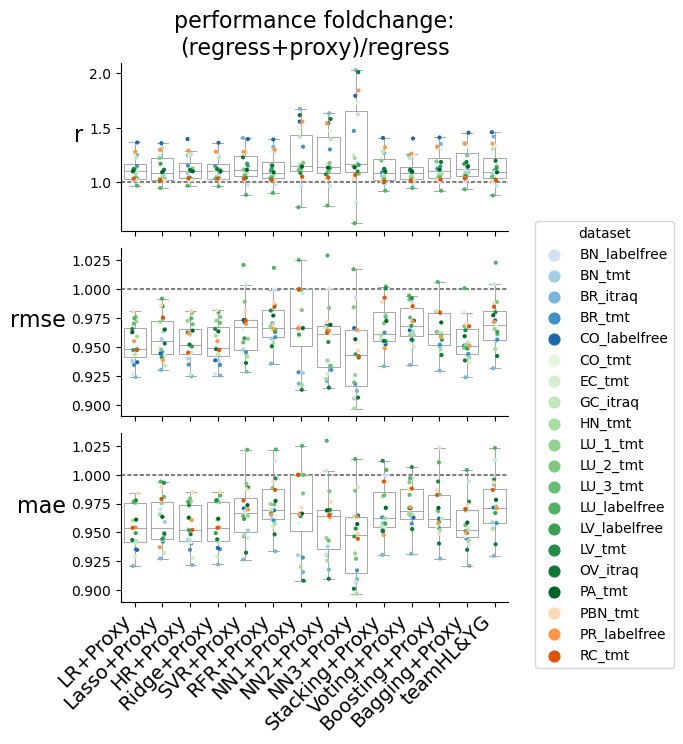

In [1344]:
### 比较1:3和0:1能够提升多少?
subset = ['1:3', '0:1']
myinput = df_out_fixflen.groupby(axis =1, level=['group', 'metric','ratio'], sort=False)\
    .mean().loc[:, ('CVtest', slice(None), subset) ].stack(level=[0,1]).clip(upper=1.1)#.reset_index()
## 
myinput= myinput.loc[:, subset[0]]/myinput.loc[:, subset[1]]
myinput = myinput.unstack().reset_index()#.pivot(index=['dataset'], columns='metric')

## colors mapping for each datasetis the same order as in  figure 1 , prepare the custom cmap: blue+ greeen + orange
cmap = plt.get_cmap("Blues")
outer_colors = cmap([50, 90, 120, 160, 200])

cmap = plt.get_cmap("Greens")
outer_colors = np.vstack([outer_colors, cmap([30, 50, 70, 90, 105, 120, 135, 150, 170, 190, 210, 230])])

cmap = plt.get_cmap("Oranges")
outer_colors = np.vstack([outer_colors, cmap([50, 120,180])])

plt.rcParams["figure.figsize"] = (5, 7) 
fig, axes = plt.subplots(3, 1, sharex=True, sharey=False )
fig.subplots_adjust(wspace=0.2, hspace=0.1 )
for i in range(3):
    mymetric  = list_metric[i]
    sns.boxplot(data=myinput, x="model", y=mymetric, color='white', saturation=1, order= list_model_14, 
                width=0.8, linewidth=0.6, dodge=True, fliersize=0, ax=axes[i])
    sns.stripplot(data=myinput, x="model", y=mymetric, hue = 'dataset', order= list_model_14, 
                  palette=outer_colors, ax=axes[i], size =3, dodge=False)#color=".25")
    if i == 0:
        axes[i].set_title('performance foldchange:\n(regress+proxy)/regress', fontsize = 16)
    if i == 1:
        axes[i].legend(bbox_to_anchor=(1.05, 1, 0.1, 0.2), title='dataset')
    else: 
        axes[i].get_legend().remove()
        
    myfinal_list_model = [ m + '+Proxy' if (m in list_model[:13]) else m for m in list_model_14 ]
    axes[i].set_xticklabels(myfinal_list_model, fontsize=14, rotation = 45,ha ='right')
    axes[i].set_ylabel(mymetric, fontsize=16, rotation = 0, ha ='right')
    axes[i].axhline( y= 1, color=".5", dashes=(2, 1), zorder = 0)
    axes[i].set_xlabel(None)
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)
filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX4_boxplot_14model_foldchange.' + filetype
# plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

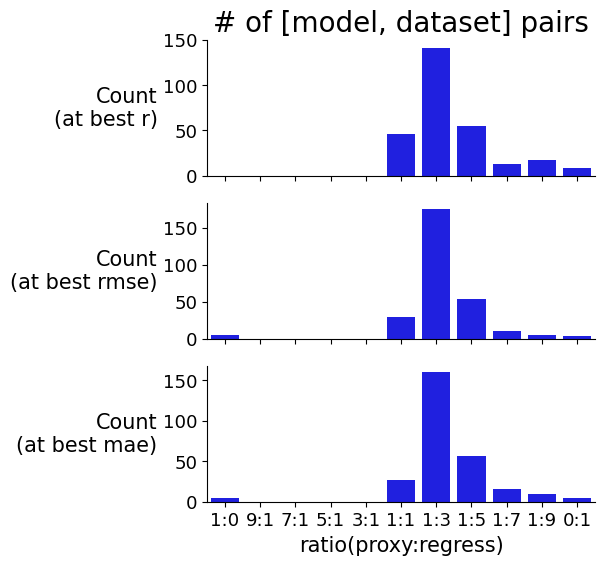

In [1198]:
## In general, considering all model x all datasets,  best ratio is 1:3 on average
plt.rcParams["figure.figsize"] = (5, 6) ### datasets
fig, ax = plt.subplots(3, 1, sharex=True, sharey=False )
fig.subplots_adjust(wspace=0.2, hspace=0.2 )
# for i in range(3):
#     mymetric  = list_metric[i]
#     sns.boxplot(data=myinput, x="model", y=mymetric, color='white', saturation=1, width=0.6, dodge=True, fliersize=0, ax=ax[i])
#     sns.swarmplot(data=myinput, x="model", y=mymetric, hue = 'dataset', palette=outer_colors, ax=ax[i], size =4)#color=".25")
# #     ax[i].legend(bbox_to_anchor=(1.05, 0.8, 0.1, 0.2), title='dataset')
#     ax[i].set_ylabel(mymetric+'\nnormalized by baselineEN', fontsize=12)
#     ax[i].axhline( y= 1, color=".5", dashes=(2, 1), zorder = 0)
inner_cols = [ str(wp)+":"+str(wr) for wp, wr in zip(list_wp, list_wr) ]
group = 'CVtest'
for i in range(3):
    mymetric  = list_metric[i]
    myinput = df_out_fixflen.groupby( axis =1, level=['group', 'metric','ratio'], sort=False).mean().loc[:, (group, mymetric)]

    myinput = myinput.idxmax(axis = 1) if (mymetric == 'r') else myinput.idxmin(axis = 1)
    myinput = myinput.reset_index(name='ratio(proxy:regress)')
    sns.countplot(x="ratio(proxy:regress)",  color='blue', order=inner_cols, 
                    data=myinput, ax=ax[i]); 

    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
#     ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel('Count\n(at best ' + mymetric + ')', rotation=0, fontsize=15, ha='right', va='center')
    ax[i].set_yticks(range(0,200,50))
    ax[i].tick_params(axis="y", rotation= 0, labelsize = 13)
    ax[i].tick_params(axis="x", rotation= 0, labelsize = 13)
    if i < 2:
        ax[i].set_xlabel(None)
    else:
         ax[i].set_xlabel('ratio(proxy:regress)', fontsize=15)
    if i ==0:
        ax[i].set_title('# of [model, dataset] pairs', fontsize=20)

filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX4_count_mix_ratio.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

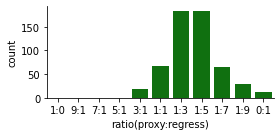

In [165]:
## check top 2 ranking ratios, result is 1:3~1:5
myinput = df_out_fixflen.groupby( axis =1, level=['group', 'metric','ratio'], sort=False)\
.mean().loc[:, (group,'r')].rank(axis = 1, ascending =False)
myinput = (myinput < 3).stack().reset_index()
myinput = myinput.loc[ myinput.loc[:, 0] ==True, ].rename(columns={0:'test','ratio':'ratio(proxy:regress)' })
g = sns.catplot(x="ratio(proxy:regress)",  color='g', order=inner_cols,
                data=myinput, kind="count", height=2, aspect=2);
if False:
    g = sns.catplot(x="ratio(proxy:regress)",  color='blue', order=inner_cols, row="dataset",
                    data=myinput, kind="count", height=1, aspect=4);

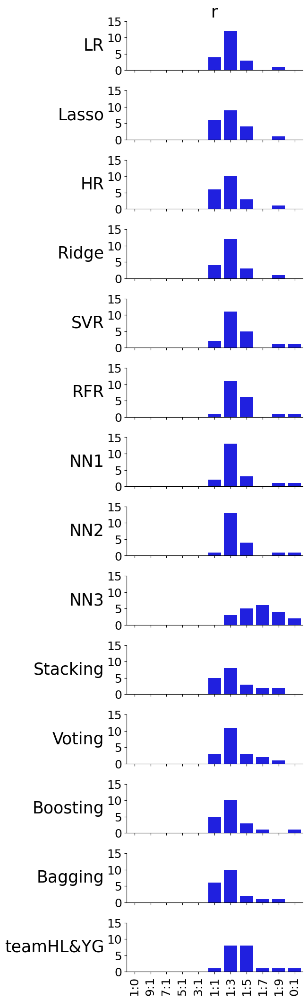

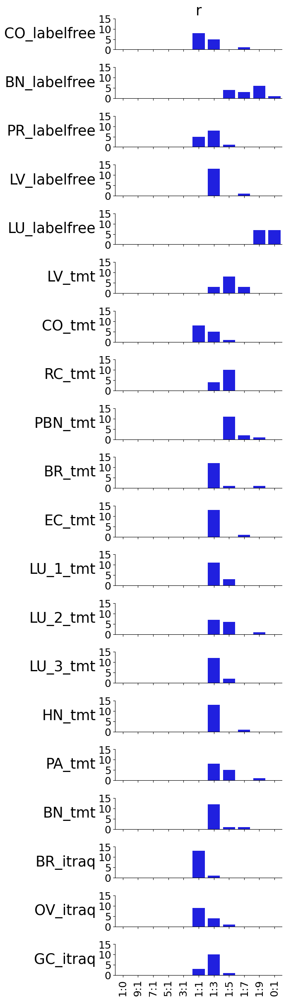

In [1208]:
## best ratio is 1:3 on average
group = 'CVtest'
for i in range(3):
    mymetric  = list_metric[i]
    myinput = df_out_fixflen.groupby( axis =1, level=['group', 'metric','ratio'], sort=False).mean().loc[:, (group, mymetric)]
    myinput = myinput.idxmax(axis = 1) if (mymetric == 'r') else myinput.idxmin(axis = 1)
    myinput = myinput.reset_index(name='ratio(proxy:regress)')
    ## add proteome dataset ShortName
#     myinput.loc[:, 'ShortName'] = df_summary.loc[ myinput['dataset'],  'ShortName' ].values

# g = sns.catplot(x="ratio(proxy:regress)",  color='g', order=inner_cols, 
#                 data=myinput, kind="count", height=2, aspect=2,);
# # filename =  '/media/eys/xwj/proteome/data/figs/figX4_count_mix_ratio.png'
# # plt.savefig(filename, format='png', dpi=200,bbox_inches="tight")
# g = sns.catplot(x="ratio(proxy:regress)",  color='g', order=inner_cols, hue='model', palette='tab20c',
#                 data=myinput, kind="count", height=3, aspect=2,);
# filename =  '/media/eys/xwj/proteome/data/figs/figX4_count_mix_ratio_model1.png'
# plt.savefig(filename, format='png', dpi=200,bbox_inches="tight")
# g = sns.catplot(x="ratio(proxy:regress)",  color='blue', order=inner_cols, row="model",
#                 data=myinput, kind="count", height=1, aspect=4); 
# filename =  '/media/eys/xwj/proteome/data/figs/figX4_count_mix_ratio_model2.png'
# plt.savefig(filename, format='png', dpi=200,bbox_inches="tight")

    g = sns.catplot(data=myinput, x="ratio(proxy:regress)",  color='blue',row='model', 
                    order=inner_cols, row_order= list_model_14,  kind="count", height=1.5, aspect=3);
    i = 0
    for ax in g.axes.flat:
        ax.set_title(None)
        ax.set_xlabel(None)
        ax.set_ylabel(list_model_14[i], fontsize=25, rotation='horizontal', horizontalalignment='right', va='center')
        ax.set_yticks([0,5,10,15])
        ax.tick_params(axis="y", rotation= 0, labelsize = 18)
        ax.tick_params(axis="x", rotation= 90, labelsize = 18)
        if i == 0:
            ax.set_title(mymetric, fontsize=25)
        i +=1
    filetype = 'svg'
    filename =  '/media/eys/xwj/proteome/data/figs/figX4_count_mix_ratio_by_model_%s.' % mymetric + filetype
    plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")
    
 
    g = sns.catplot(data=myinput, x="ratio(proxy:regress)",  color='blue',row='dataset', 
                order=inner_cols, row_order=df_summary.ShortName,  kind="count", height=1.2, aspect=4);
    i = 0
    for ax in g.axes.flat:
        ax.set_title(None)
        ax.set_xlabel(None)
        ax.set_ylabel(df_summary.ShortName[i], fontsize=25, rotation='horizontal', horizontalalignment='right', va='center')
        ax.set_yticks([0,5,10,15])
        ax.tick_params(axis="y", rotation= 0, labelsize = 18)
        ax.tick_params(axis="x", rotation= 90, labelsize = 18)
        if i == 0:
            ax.set_title(mymetric, fontsize=25)
        i +=1
    filetype = 'svg'
    filename =  '/media/eys/xwj/proteome/data/figs/figX4_count_mix_ratio_by_dataset_%s.' % mymetric + filetype

    plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")
    break

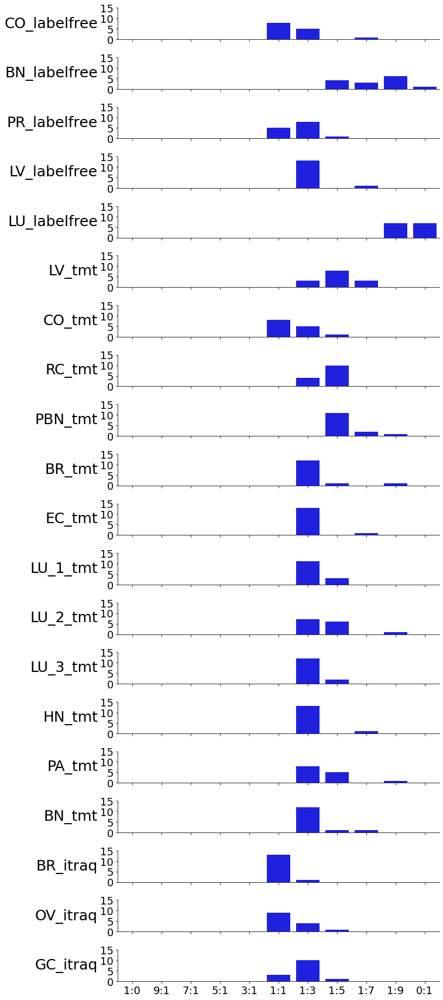

In [657]:
# g = sns.catplot(x="ratio(proxy:regress)",  color='g', order=inner_cols,
#                 data=myinput, kind="count", height=2, aspect=2);
# g = sns.catplot(x="ratio(proxy:regress)",  color='g', order=inner_cols, hue='dataset', palette=outer_colors,
#                 data=myinput, kind="count", height=3, aspect=4,);
# filename =  '/media/eys/xwj/proteome/data/figs/figX4_count_mix_ratio_dataset1.png'
# plt.savefig(filename, format='png', dpi=200,bbox_inches="tight")
# g = sns.catplot(x="ratio(proxy:regress)",  color='blue', order=inner_cols, row="dataset",
#                 data=myinput, kind="count", height=1, aspect=4);
# filename =  '/media/eys/xwj/proteome/data/figs/figX4_count_mix_ratio_dataset2.png'
# plt.savefig(filename, format='png', dpi=200,bbox_inches="tight")

g = sns.catplot(data=myinput, x="ratio(proxy:regress)",  color='blue',row='ShortName', 
                order=inner_cols, row_order=df_summary.ShortName,  kind="count", height=1.2, aspect=7);
i = 0
for ax in g.axes.flat:
    ax.set_title(None)
    ax.set_xlabel(None)
    ax.set_ylabel(df_summary.ShortName[i], fontsize=25, rotation='horizontal', horizontalalignment='right', va='center')
    ax.set_yticks([0,5,10,15])
    ax.tick_params(axis="y", rotation= 0, labelsize = 18)
    ax.tick_params(axis="x", rotation= 0, labelsize = 18)
    i +=1
filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX4_count_mix_ratio_by_dataset.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

In [605]:
df_out_fixflen.groupby( axis =1, level=['group', 'metric','ratio'], sort=False).mean().loc[:, (group, mymetric)]

ratio                                   1:0       9:1       7:1       5:1  \
dataset                 model                                               
colon_86_2014_labelfree LR         0.943494  0.899707  0.889682  0.873819   
                        Lasso      0.943494  0.899436  0.889272  0.873116   
                        HR         0.943494  0.896672  0.885812  0.868528   
                        Ridge      0.943494  0.899638  0.889579  0.873649   
                        SVR        0.943494  0.897998  0.887286  0.870055   
...                                     ...       ...       ...       ...   
stomach_80_2019_itraq   Stacking   0.942225  0.897017  0.886458  0.869583   
                        Voting     0.942225  0.896692  0.885983  0.868774   
                        Boosting   0.942225  0.898624  0.888424  0.872093   
                        Bagging    0.942225  0.899010  0.888951  0.872909   
                        teamHL&YG  0.942225  0.898282  0.887943  0.871329   

ratio                                   3:1       1:1       1:3       1:5  \
dataset                 model                                               
colon_86_2014_labelfree LR         0.845554  0.792952  0.794720  0.807477   
                        Lasso      0.844063  0.787306  0.782567  0.792959   
                        HR         0.837347  0.774852  0.766642  0.776707   
                        Ridge      0.845195  0.791640  0.791968  0.804198   
                        SVR        0.838217  0.767521  0.741062  0.742924   
...                                     ...       ...       ...       ...   
stomach_80_2019_itraq   Stacking   0.838694  0.773056  0.756406  0.762665   
                        Voting     0.836952  0.765994  0.740749  0.743620   
                        Boosting   0.842090  0.777177  0.757690  0.762253   
                        Bagging    0.843736  0.783100  0.770667  0.777920   
                        teamHL&YG  0.840567  0.771524  0.745024  0.746852   

ratio                                   1:7       1:9       0:1  
dataset                 model                                    
colon_86_2014_labelfree LR         0.816079  0.821929  0.850226  
                        Lasso      0.800321  0.805420  0.830715  
                        HR         0.784097  0.789277  0.815138  
                        Ridge      0.812522  0.818211  0.845821  
                        SVR        0.745961  0.748458  0.763369  
...                                     ...       ...       ...  
stomach_80_2019_itraq   Stacking   0.767966  0.771826  0.792122  
                        Voting     0.747182  0.749997  0.766249  
                        Boosting   0.766594  0.769849  0.787645  
                        Bagging    0.783641  0.787745  0.808889  
                        teamHL&YG  0.749810  0.752244  0.766811  

[280 rows x 11 columns]

In [237]:
mykey = dataset_ready
df_out_fixflen.groupby( axis =1, level=['group', 'metric','ratio'], sort=False).mean().loc[mykey, ('CVtest','r')]\
.style.highlight_max(axis=1).format("{:0.3f}")
# df_best_flen = df_metric_list_topn.loc[:, (['cosine', 'custom'], metric)].idxmax(axis = 1)
# df_featurelen_gene[df_featurelen_gene == 'All'] = X.shape[1]
# [ res_proxy['y_pred_CVtest'][i].shape for i in range(N) ], [ res_proxy['y_pred_CVtrain'][i].shape for i in range(np.nan_to_num
# df_best_flen#.loc[ mykey, m ]
# df_out_fixflen.loc[(mykey, m), ('CVtest', 'r', wp_wr, i)]

### 20220107 Figure 5. Final model of all genes, including common genes optimized by proxy:regress ratio=1:3
@ratio1:3 per gene performance metrics

In [ ]:
list_model = list(model_dict.keys())
list_model_14 = ['LR', 'Lasso', 'HR', 'Ridge', 'SVR', 'RFR', 'NN1', 'NN2', 'NN3', 'Stacking', 'Voting', 'Boosting', 'Bagging', 'teamHL&YG']
inner_cols = ['1:3']
wp_wr = '1:3'
jobs = [(m, wp_wr) for m in list_model_14 for wp_wr in inner_cols ]

print(nCPU, inner_cols, list_model_14, 'dict_r_final')
dict_r_final=dict() ## initialize a dict to save all gene r, rmse, mae

In [296]:
%%time 
# Wall time: 3h 
for mykey in df_summary.index:
    with open( '/public/home/test1/mydata/proteome/data/' + df_summary.loc[mykey, "resultpkl_metric"], 'rb') as f:
        [ res ]=pickle.load(f)
    
    print( mykey.ljust(30,'-'), end='\n' )
    
    X = dict_dataset[mykey]["RNA"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
    Y = dict_dataset[mykey]["protein"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()

    ## proxy model need common genes
    common_genes = list(set(X.columns) & set(Y.columns))
    
    res_proxy = dict()
    res_proxy['y_pred_CVtrain'], res_proxy['y_pred_CVtest']  = {}, {}

    df_r_final = pd.DataFrame(
        index = Y.columns, 
        columns= pd.MultiIndex.from_product(
            [ ['CVtrain', 'CVtest'], list_model, ['r', 'rmse', 'mae'], inner_cols, range(N) ], 
            names=[ "group", "model", "metric", "ratio","split"])
    )

    # step 1. regression performance; include baselineEN, teamHYU
    for m in list_model: ## every gene & every model need regression models performance
        mfs, _, topn = df_best_flen.loc[mykey, m] # ('custom', 'r', 'All')
        topn = X.shape[1] if topn == 'All' else topn
        wp_wr = '1:3'
        for metric in list_metric:
            for group in ['CVtrain', 'CVtest']:
                df_r_final.loc[ :, (group, m, metric, wp_wr)] = res[mfs][topn][m]["df_%s_%s" %(group, metric)].values

    # step 2. common genes compute new performance of proxy + regress = 1:3
    for i, (train_index, test_index) in zip(range(N), kf.split(Y)): 
        X_train, X_test = X.iloc[train_index],  X.iloc[test_index]
        Y_train, Y_test = Y.iloc[train_index],  Y.iloc[test_index]

        sample_index = dict({'CVtrain':Y.index[train_index], 'CVtest':Y.index[test_index]})

        res_proxy['y_pred_CVtrain'][i] = X_train.loc[:, common_genes]
        res_proxy['y_pred_CVtest'][i] = X_test.loc[:, common_genes]
        Y_train, Y_test = Y_train.loc[:, common_genes], Y_test.loc[:, common_genes]
        
        # step 2.1 prepare y_pred = proxy + regress
        ############ ratio of proxy:gene-specific model (only at optimal feature length )
        y_pred_mix = dict.fromkeys(['CVtrain', 'CVtest'])
        for group in y_pred_mix:
            
            y_pred_mix[group] = dict.fromkeys(list_model_14)
            for m in list_model_14:
                y_pred_mix[group][m] = dict.fromkeys(inner_cols)

                mfs, _, topn = df_best_flen.loc[mykey, m] # ('custom', 'r', 'All')
                topn = X.shape[1] if topn == 'All' else topn
                y_pred = pd.DataFrame(data=np.array( res[mfs][topn][m]['y_pred_'+group][i]).T, 
                                      index = sample_index[group], 
                                      columns =Y.columns)
                y_pred = y_pred.loc[:, common_genes] # ONLY commmon genes+ proxy. other proteins don't have proxy mRNA
                for wp, wr in zip(list_wp, list_wr):
                    y_pred_mix[group][m][str(wp) + ":" + str(wr)] = (res_proxy['y_pred_'+group][i]*wp+ y_pred*wr)/(wp+wr)

        def speed_up_metric_gene(y_true,  y_pred,  tuple_m_wp_wr):
            (m, wp_wr) = tuple_m_wp_wr
            proteins = y_true.columns
            return m, wp_wr,\
                np.nan_to_num([ np.corrcoef(y_true[g], y_pred[m][wp_wr][g])[1,0] for g in proteins]), \
                np.nan_to_num([ np.sqrt(metrics.mean_squared_error(y_true[g], y_pred[m][wp_wr][g])) for g in proteins ]), \
                np.nan_to_num([ metrics.mean_absolute_error(y_true[g], y_pred[m][wp_wr][g]) for g in proteins ])
        
        # step 2.2 modify with proxy mixed performance
        proteins = common_genes ## 
        with Pool(nCPU) as pool:
            group = 'CVtest'
            metrics_in_rows = pool.map(partial(speed_up_metric_gene, Y_test, y_pred_mix[group]), jobs)
            for m, wp_wr, one_r, one_rmse, one_mae in metrics_in_rows:
                df_r_final.loc[ proteins, (group, m, 'r', wp_wr, i)] = one_r 
                df_r_final.loc[ proteins, (group, m,'rmse', wp_wr,i)] = one_rmse
                df_r_final.loc[ proteins, (group, m,'mae', wp_wr,i)] = one_mae
            group = 'CVtrain'            
            metrics_in_rows = pool.map(partial(speed_up_metric, Y_train, y_pred_mix[group]), jobs)    
            for m, wp_wr, one_r, one_rmse, one_mae in metrics_in_rows:
                df_r_final.loc[ proteins, (group, m, 'r', wp_wr, i)] = one_r 
                df_r_final.loc[ proteins, (group, m,'rmse', wp_wr,i)] = one_rmse
                df_r_final.loc[ proteins, (group, m,'mae', wp_wr,i)] = one_mae
        print(time.ctime(), 'split', i, 'proxy: regress mix done')
    dict_r_final[mykey] = df_r_final ; print(time.ctime(), 'df_r_final filled')

prostate_65_2019_labelfree----
Wed Jan  5 12:52:25 2022 split 0 proxy: regress mix done
Wed Jan  5 12:53:17 2022 split 1 proxy: regress mix done
Wed Jan  5 12:54:09 2022 split 2 proxy: regress mix done
Wed Jan  5 12:55:00 2022 split 3 proxy: regress mix done
Wed Jan  5 12:55:52 2022 split 4 proxy: regress mix done
Wed Jan  5 12:55:52 2022 df_r_final filled
liver_62_2019_labelfree-------
Wed Jan  5 12:57:46 2022 split 0 proxy: regress mix done
Wed Jan  5 12:58:27 2022 split 1 proxy: regress mix done
Wed Jan  5 12:59:10 2022 split 2 proxy: regress mix done
Wed Jan  5 12:59:52 2022 split 3 proxy: regress mix done
Wed Jan  5 13:00:34 2022 split 4 proxy: regress mix done
Wed Jan  5 13:00:34 2022 df_r_final filled
lung_76_2020_labelfree--------
Wed Jan  5 13:02:23 2022 split 0 proxy: regress mix done
Wed Jan  5 13:03:05 2022 split 1 proxy: regress mix done
Wed Jan  5 13:03:48 2022 split 2 proxy: regress mix done
Wed Jan  5 13:04:31 2022 split 3 proxy: regress mix done
Wed Jan  5 13:05:14 202

/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Wed Jan  5 14:08:09 2022 split 0 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Wed Jan  5 14:09:57 2022 split 1 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Wed Jan  5 14:11:46 2022 split 2 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Wed Jan  5 14:13:33 2022 split 3 proxy: regress mix done
Wed Jan  5 14:15:21 2022 split 4 proxy: regress mix done
Wed Jan  5 14:15:21 2022 df_r_final filled
lung_89_2020_tmt--------------
Wed Jan  5 14:19:27 2022 split 0 proxy: regress mix done
Wed Jan  5 14:20:43 2022 split 1 proxy: regress mix done
Wed Jan  5 14:21:56 2022 split 2 proxy: regress mix done
Wed Jan  5 14:23:13 2022 split 3 proxy: regress mix done
Wed Jan  5 14:24:34 2022 split 4 proxy: regress mix done
Wed Jan  5 14:24:34 2022 df_r_final filled
lung_202_2021_tmt-------------


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Wed Jan  5 14:29:17 2022 split 0 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Wed Jan  5 14:31:15 2022 split 1 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Wed Jan  5 14:33:19 2022 split 2 proxy: regress mix done


/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/public/home/test1/soft/anaconda3/envs/py3.7.3_skorch/lib/python3.7/site-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Wed Jan  5 14:35:24 2022 split 3 proxy: regress mix done
Wed Jan  5 14:37:28 2022 split 4 proxy: regress mix done
Wed Jan  5 14:37:28 2022 df_r_final filled
headneck_151_2021_tmt---------
Wed Jan  5 14:42:12 2022 split 0 proxy: regress mix done
Wed Jan  5 14:43:56 2022 split 1 proxy: regress mix done
Wed Jan  5 14:45:35 2022 split 2 proxy: regress mix done
Wed Jan  5 14:47:12 2022 split 3 proxy: regress mix done
Wed Jan  5 14:48:52 2022 split 4 proxy: regress mix done
Wed Jan  5 14:48:52 2022 df_r_final filled
pancrea_140_2021_tmt----------
Wed Jan  5 14:53:12 2022 split 0 proxy: regress mix done
Wed Jan  5 14:54:30 2022 split 1 proxy: regress mix done
Wed Jan  5 14:55:51 2022 split 2 proxy: regress mix done
Wed Jan  5 14:57:09 2022 split 3 proxy: regress mix done
Wed Jan  5 14:58:24 2022 split 4 proxy: regress mix done
Wed Jan  5 14:58:24 2022 df_r_final filled
brain_108_2021_tmt------------
Wed Jan  5 15:02:58 2022 split 0 proxy: regress mix done
Wed Jan  5 15:04:33 2022 split 1 prox

In [297]:
outfile = '/public/home/test1/mydata/proteome/data/df_r_final' + \
    time.strftime("%Y%m%d-%H%M")+ '.pkl'
print(outfile)
with open(outfile, 'wb') as f: 
    pickle.dump( [dict_r_final],  f)

/public/home/test1/mydata/proteome/data/df_r_final20220105-1534.pkl


In [514]:
myinput = df_out_fixflen.groupby( axis =1, level=['group', 'metric','ratio'], sort=False).mean().loc[:, (group, mymetric)]

myinput = myinput.idxmax(axis = 1) if (mymetric == 'r') else myinput.idxmin(axis = 1)
myinput = myinput.reset_index(name='ratio(proxy:regress)')
myinput

,dataset,model,ratio(proxy:regress)
0,colon_86_2014_labelfree,LR,0:1
1,colon_86_2014_labelfree,Lasso,0:1
2,colon_86_2014_labelfree,HR,0:1
3,colon_86_2014_labelfree,Ridge,0:1
4,colon_86_2014_labelfree,SVR,0:1
...,...,...,...
275,stomach_80_2019_itraq,Stacking,0:1
276,stomach_80_2019_itraq,Voting,0:1
277,stomach_80_2019_itraq,Boosting,0:1
278,stomach_80_2019_itraq,Bagging,0:1


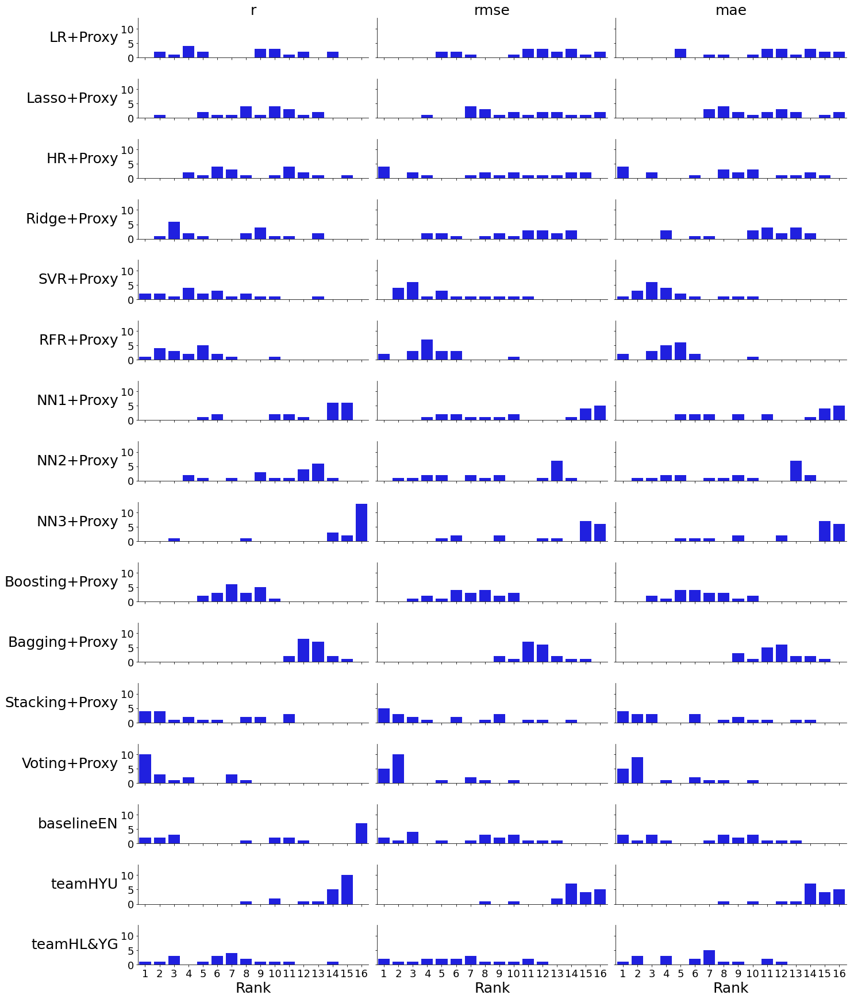

In [714]:

df_draw =pd.concat(dict_r_final,names=['dataset','gene'])\
    .groupby(level=0).mean()\
    .groupby(axis = 1, by=['group', 'model', 'metric']).mean()\
    .loc[:, ('CVtest')].stack().rank(axis  = 1, ascending = True).stack().reset_index().rename(columns={0:'rank'})

df_draw.loc[(df_draw.metric == 'r'), 'rank' ] = 17 - df_draw.loc[(df_draw.metric == 'r'), 'rank' ]
## r is ranking ascending then reversed 

df_draw.loc[:, 'Final Model'] = [ m + '+Proxy' if (m in list_model[:13]) else m for m in df_draw.loc[:, 'model'] ] 
myfinal_list_model = [ m + '+Proxy' if (m in list_model[:13]) else m for m in list_model ]
df_draw
g = sns.catplot(x="rank",  color='blue', row="Final Model", col='metric', col_order=list_metric,  row_order=myfinal_list_model,  order=range(1,17),
                data=df_draw,  kind="count", height=1.5, aspect=4);
i = 0
for ax_row in g.axes:
    for j, ax in zip(range(3), ax_row):
        ax.set_title(list_metric[ j ], fontsize=25) if (i ==0) else ax.set_title(None)
        ax.set_xlabel(None) if (i < 15) else  ax.set_xlabel('Rank', fontsize = 25)
        ax.tick_params(axis="x", rotation= 0, labelsize = 18)
        ax.set_yticks([0,5,10])
        ax.tick_params(axis="y", rotation= 0, labelsize = 18)
        ax.set_ylabel(myfinal_list_model[i], fontsize=25, rotation='horizontal', horizontalalignment='right', va='center')
    i +=1
filename =  '/media/eys/xwj/proteome/data/figs/figX5_rank1st_16_models_proxy.svg'
plt.savefig(filename, format='svg', dpi=200, transparent=True, bbox_inches="tight")

### Figure 4 20220113 striplot boxplot

In [1299]:
## 1. comput mean metric of 5-fold cross-validation
## 2. reshape to long form table
## 3. clip extreme value to 1.1
## 4. change the model name to + proxy
df_draw =pd.concat(dict_r_final,names=['dataset','gene'])\
    .groupby(level=0).mean()\
    .groupby(axis = 1, by=['group', 'model', 'metric']).mean()\
    .stack(level=[1,2]).loc[(df_summary.index, list_model),:].reset_index()#.rename(columns={0:'value'})
df_draw.loc[:, 'ShortName'] = df_summary.loc[ df_draw['dataset'],  'ShortName' ].values
df_draw.loc[:, 'Final Model'] = [ m + '+Proxy' if (m in list_model[:13]) else m for m in df_draw.loc[:, 'model'] ] 
## 
myfinal_list_model = [ m + '+Proxy' if (m in list_model[:13]) else m for m in list_model ]

df_draw.loc[:, ['CVtest','CVtrain']  ] = df_draw.loc[:, ['CVtest','CVtrain']  ].clip(upper=1.1)
df_draw

group,dataset,model,metric,CVtest,CVtrain,ShortName,Final Model
0,colon_86_2014_labelfree,LR,mae,0.798713,0.557727,CO_labelfree,LR+Proxy
1,colon_86_2014_labelfree,LR,r,0.235449,0.697702,CO_labelfree,LR+Proxy
2,colon_86_2014_labelfree,LR,rmse,1.014249,0.708784,CO_labelfree,LR+Proxy
3,colon_86_2014_labelfree,Lasso,mae,0.786041,0.563064,CO_labelfree,Lasso+Proxy
4,colon_86_2014_labelfree,Lasso,r,0.242543,0.690779,CO_labelfree,Lasso+Proxy
...,...,...,...,...,...,...,...
955,stomach_80_2019_itraq,teamHYU,r,0.244719,0.869900,GC_itraq,teamHYU
956,stomach_80_2019_itraq,teamHYU,rmse,1.011522,0.474234,GC_itraq,teamHYU
957,stomach_80_2019_itraq,teamHL&YG,mae,0.746493,0.435569,GC_itraq,teamHL&YG
958,stomach_80_2019_itraq,teamHL&YG,r,0.304997,0.878936,GC_itraq,teamHL&YG


In [1343]:
## Supplemenetal Table S4 , MAE, RMSE, R Save the average performance of 16 models
filename = "/media/eys/xwj/proteome/data/TableS4_16model_final_metric%s.xlsx" % time.strftime("%Y%m%d")
print(filename)

df_draw.drop(columns=['dataset'] ).\
    pivot_table(index=['ShortName'], columns= [ 'metric','Final Model']).loc[:, ('CVtest')]\
#     .to_excel(filename)

/media/eys/xwj/proteome/data/TableS4_16model_final_metric20220113.xlsx


In [1338]:
df_draw.drop(columns=['dataset'] ).\
    pivot_table(index=['ShortName'], columns= [ 'metric','Final Model']).loc[:, ('CVtest', 'r')].\
    idxmax(axis=1).value_counts()
# rank(axis = 1, ascending =False) # 降序

Voting+Proxy      10
Stacking+Proxy     4
SVR+Proxy          2
baselineEN         2
teamHL&YG          1
RFR+Proxy          1
dtype: int64

In [1339]:
df_draw.drop(columns=['dataset'] ).\
    pivot_table(index=['ShortName'], columns= [ 'metric','Final Model']).loc[:, ('CVtest', 'rmse')].\
    idxmin(axis=1).value_counts()

Voting+Proxy      5
HR+Proxy          4
Stacking+Proxy    4
baselineEN        3
RFR+Proxy         2
SVR+Proxy         1
teamHL&YG         1
dtype: int64

In [1340]:
df_draw.drop(columns=['dataset'] ).\
    pivot_table(index=['ShortName'], columns= [ 'metric','Final Model']).loc[:, ('CVtest', 'mae')].\
    idxmin(axis=1).value_counts()

Voting+Proxy      5
HR+Proxy          4
Stacking+Proxy    4
baselineEN        3
RFR+Proxy         2
SVR+Proxy         1
teamHL&YG         1
dtype: int64

In [575]:
start, stop = 150, 250
num = 9; take = [np.int64(x) for x in np.arange(start, stop, (stop-start)/num)]
outer_colors = plt.get_cmap("Blues")(take )

num = 4; take = [np.int64(x) for x in np.arange(start, stop, (stop-start)/num)]
outer_colors = np.vstack([ outer_colors, plt.get_cmap("Oranges")(take) ])

start, stop = 100, 250
num = 1; take = [np.int64(x) for x in np.arange(start, stop, (stop-start)/num)]
outer_colors = np.vstack([ outer_colors, plt.get_cmap("Greens")(take) ])

start, stop = 150, 250
num = 2; take = [np.int64(x) for x in np.arange(start, stop, (stop-start)/num)]
outer_colors = np.vstack([ outer_colors, plt.get_cmap("Greys")(take) ])


## 20220105
my_color = {
    'Stacking':'orange', 'Voting':'red','Bagging':'gold', 'Boosting': 'yellow', 
    'baselineEN':'magenta' , 'teamHYU': 'pink', 'teamHL&YG':'violet', 
    'LR':'BLue', 'Lasso':'RoyalBlue', 'HR':'LightSkyBlue', 'Ridge':'DeepSkyBlue', 'SVR':'dodgerBlue', 'RFR': 'SteelBlue',
    'NN1':'Cyan', 'NN2': 'c', 'NN3':'springgreen',}

## 20220106 add more constrast to 
my_color = {
    'Stacking':'orange', 'Voting':'red','Bagging':'gold', 'Boosting': 'yellow', 
    'NN1':'Cyan', 'NN2': 'c', 'NN3':'springgreen',
    'baselineEN':'#FFFF00' , 'teamHYU': '#F3F781', 'teamHL&YG':'#D8F781', 
    'LR':'RoyalBlue', 'Lasso':'Blue', 'HR':'LightSkyBlue', 'Ridge':'DeepSkyBlue', 'SVR':'dodgerBlue', 'RFR': 'Lime',
}
my_color = {
    'Stacking':'orange', 'Voting':'red','Bagging':'gold', 'Boosting': 'coral', 
    'baselineEN':'black' , 'teamHYU': 'gray', 'teamHL&YG':'silver', 
    'LR':'BLue', 'Lasso':'RoyalBlue', 'HR':'dodgerBlue', 'Ridge':'DeepSkyBlue', 'SVR':'LightSkyBlue', 'RFR': 'Cyan',
    'NN1':'turquoise', 'NN2': 'springgreen', 'NN3':'limegreen',}

my_color = {
    'Stacking+Proxy':'orange', 'Voting+Proxy':'red', 'Bagging+Proxy':'gold', 'Boosting+Proxy': 'coral', 
    'baselineEN':'black' , 'teamHYU': 'gray', 'teamHL&YG':'silver', 
    'LR+Proxy':'BLue', 'Lasso+Proxy':'RoyalBlue', 'HR+Proxy':'dodgerBlue', 'Ridge+Proxy':'DeepSkyBlue', 'SVR+Proxy':'LightSkyBlue', 'RFR+Proxy': 'Cyan',
    'NN1+Proxy':'turquoise', 'NN2+Proxy': 'springgreen', 'NN3+Proxy':'limegreen',}

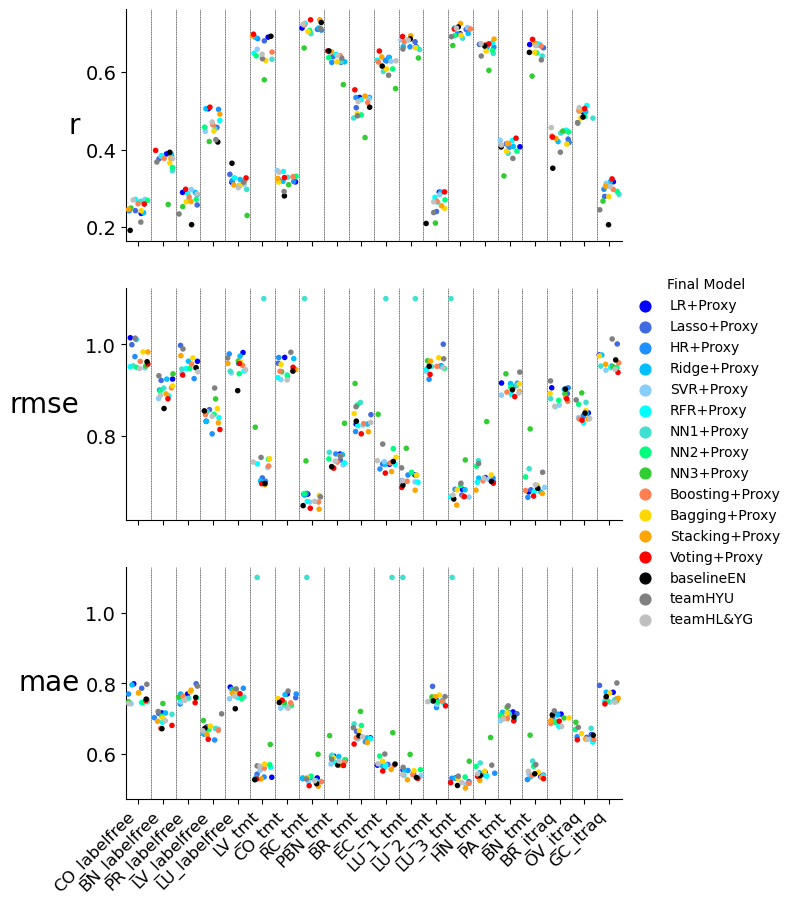

In [889]:
plt.rcParams["figure.figsize"] = (10, 10) 
## use stripplot to 
g = sns.catplot(x="ShortName", y="CVtest", hue="Final Model", row="metric",  
                data=df_draw,  hue_order=myfinal_list_model, row_order = list_metric,  col_order= df_summary.loc[:, 'ShortName' ], 
                kind="strip", palette=my_color,  jitter=0.4, 
                s=4, height=3, aspect=2, dodge=False, sharey=False, alpha=1)
i = 0
for ax in g.axes.flat:
    ax.set_title(None)
    ax.set_xlabel(None)
    ax.set_ylabel(list_metric[i], rotation=0, fontsize=20, horizontalalignment='right', va='center')
    ax.set_xticklabels(df_summary.loc[:, 'ShortName' ], fontsize=12, rotation = 45,ha ='right')
#     ax.tick_params(axis="x", rotation=90, labelsize=14)
    ax.tick_params(axis="y", rotation=0, labelsize=14)
    for x_i in range(len(df_summary.index)):
        ax.axvline(x=x_i +0.5, color='black', dashes=(2,1), lw=0.4, zorder =0)
    i +=1
filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX5_swarm_16_models_proxy_small.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

In [874]:
## 1. comput mean metric of 5-fold cross-validation
## 2. reshape to long form table
## 3. clip extreme value to 1.1
## 4. change the model name to + proxy

In [1209]:
df_draw =pd.concat(dict_r_final,names=['dataset','gene'])\
    .groupby(level=0).mean()\
    .groupby(axis = 1, by=['group', 'model', 'metric']).mean()\
    .stack(level=[1,]).loc[(df_summary.index, list_model),'CVtest']

df_draw.loc[:, 'rmse'] = df_draw['rmse'].clip(upper=1.1)
df_draw.loc[:, 'mae'] = df_draw['mae'].clip(upper=1)

# normalize by baselineEN model
for mykey in dataset_ready:
    df_draw.loc[mykey] = df_draw.loc[mykey].div (df_draw.loc[(mykey,'baselineEN'), :], axis=1).values

# remove baselineEN model from df
list_model_15 = [ x  for x in list_model if (x !='baselineEN')] 
df_draw = df_draw.loc[(slice(None), list_model_15),:].reset_index()

df_draw.loc[:, 'ShortName'] = df_summary.loc[ df_draw['dataset'],  'ShortName' ].values
df_draw.loc[:, 'Final Model'] = [ m + '+Proxy' if (m in list_model[:13]) else m for m in df_draw.loc[:, 'model'] ] 
## 
myfinal_list_model = [ m + '+Proxy' if (m in list_model[:13]) else m for m in list_model_15 ]

df_draw#

metric,dataset,model,mae,r,rmse,ShortName,Final Model
0,colon_86_2014_labelfree,LR,1.057322,1.227800,1.054660,CO_labelfree,LR+Proxy
1,brain_71_2017_labelfree,LR,1.066453,0.989521,1.075044,BN_labelfree,LR+Proxy
2,prostate_65_2019_labelfree,LR,1.012684,1.402682,1.014859,PR_labelfree,LR+Proxy
3,liver_62_2019_labelfree,LR,0.977005,1.204417,0.973203,LV_labelfree,LR+Proxy
4,lung_76_2020_labelfree,LR,1.084103,0.865189,1.092874,LU_labelfree,LR+Proxy
...,...,...,...,...,...,...,...
295,pancrea_140_2021_tmt,teamHL&YG,0.991655,1.011745,0.991890,PA_tmt,teamHL&YG
296,brain_108_2021_tmt,teamHL&YG,1.013227,1.026693,1.011236,BN_tmt,teamHL&YG
297,breast_77_2016_itraq,teamHL&YG,0.953957,1.297384,0.958249,BR_itraq,teamHL&YG
298,ovary_119_2016_itraq,teamHL&YG,0.981797,1.049638,0.985785,OV_itraq,teamHL&YG


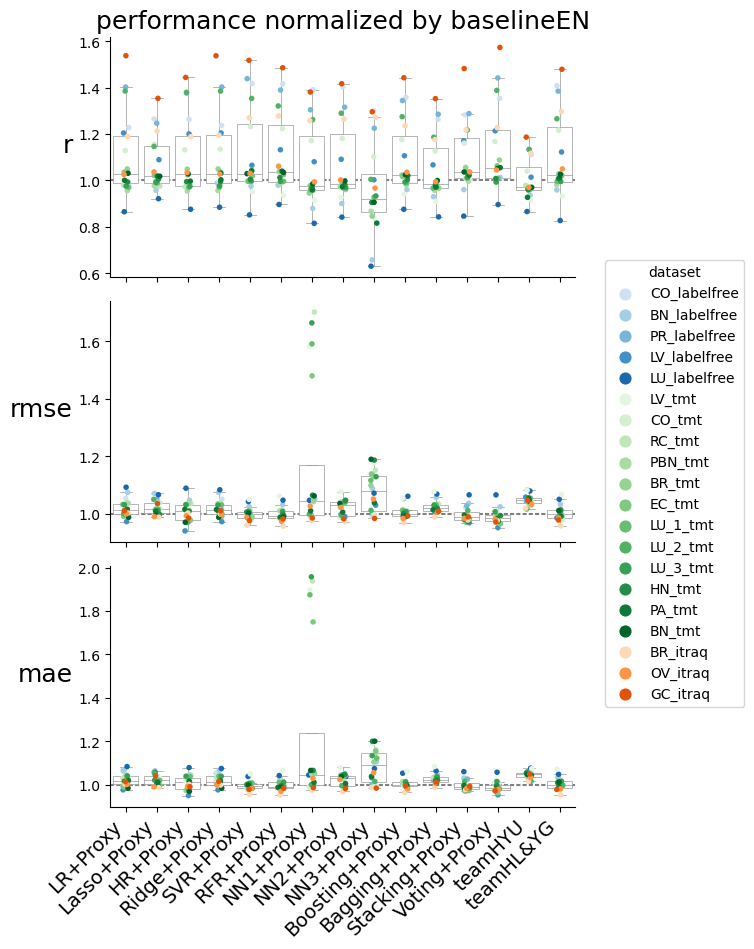

In [1210]:
myinput =df_draw
## colors mapping for each datasetis the same order as in  figure 1 , prepare the custom cmap: blue+ greeen + orange
cmap = plt.get_cmap("Blues")
outer_colors = cmap([50, 90, 120, 160, 200])

cmap = plt.get_cmap("Greens")
outer_colors = np.vstack([outer_colors, cmap([30, 50, 70, 90, 105, 120, 135, 150, 170, 190, 210, 230])])

cmap = plt.get_cmap("Oranges")
outer_colors = np.vstack([outer_colors, cmap([50, 120,180])])

plt.rcParams["figure.figsize"] = (6, 10) 
fig, axes = plt.subplots(3, 1, sharex=True, sharey=False )
fig.subplots_adjust(wspace=0.2, hspace=0.1 )
for i in range(3):
    mymetric  = list_metric[i]
    sns.boxplot(data=myinput, x="model", y=mymetric, color='white', saturation=1, order= list_model_15, 
                linewidth=0.5, dodge=True, fliersize=0, ax=axes[i])
    sns.stripplot(data=myinput, x="model", y=mymetric, hue = 'ShortName', order= list_model_15, 
                  palette=outer_colors, ax=axes[i], size =4)#color=".25")
    if i == 0:
        axes[i].set_title('performance normalized by baselineEN', fontsize = 18)
    if i == 1:
        axes[i].legend(bbox_to_anchor=(1.05, 1, 0.1, 0.2), title='dataset')
    else: 
        axes[i].get_legend().remove() 
    axes[i].set_xticklabels(myfinal_list_model, fontsize=14, rotation = 45,ha ='right')
    axes[i].set_ylabel(mymetric, fontsize=18, rotation = 0, ha ='right')
    axes[i].axhline( y= 1, color=".5", dashes=(2, 1), zorder = 0)
    axes[i].set_xlabel(None)
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX5_boxplot_15model_comparision.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

### Table 2  Table 2  in 14 dataset, the model Voting performs the best

In [1259]:
########
# p-values: compare final weighted models with previous models
# compare my models with exisiting model by Wilcoxon's p-value
show_models = ['baselineEN', 'teamHYU', 'teamHL&YG', 'Voting']
df_summary_p = pd.DataFrame(index = df_summary.index, columns= show_models)

data = pd.concat(dict_r_final, names=['dataset','gene'])\
    .groupby(axis=1, level=['group','model','metric','ratio']).mean()

for mykey in df_summary_p.index:
    temp = data.loc[mykey, ('CVtest', show_models, 'r','1:3')]
    df_summary_p.loc[mykey, show_models] = [ ("%.3f" % x[0] + "±" +  "%.3f" % x[1]) for x in  zip(temp.mean(), temp.std())]
    
    for i in range(3):
        m_exist = show_models[i]
        df_summary_p.loc[mykey, 'H1: %s>%s' % (show_models[3], m_exist) ] = \
            "%.2g" % stats.wilcoxon(temp.iloc[:, 3], temp.iloc[:, i], alternative="greater")[1]
        
# df_summary_p.loc[mykey, 'Wilcox p-value (2)>(0)'] = stats.wilcoxon(df_r_final.iloc[:, 2], df_r_final.iloc[:, 0], alternative="greater")[1]

df_summary_p.columns = [ m + '+Proxy' if (m in list_model[:13]) else m for m in df_summary_p.columns] 
df_summary_p.index = df_summary.ShortName.values
filename = "/media/eys/xwj/proteome/data/Table_df_summary_p_wilcox_%s.xlsx" % time.strftime("%Y%m%d")
print(filename)
df_summary_p.to_excel(filename)
df_summary_p

/media/eys/xwj/proteome/data/Table_df_summary_p_wilcox_20220112.xlsx


,baselineEN,teamHYU,teamHL&YG,Voting+Proxy,H1: Voting>baselineEN,H1: Voting>teamHYU,H1: Voting>teamHL&YG
CO_labelfree,0.169±0.217,0.213±0.195,0.270±0.180,0.259±0.187,3.1e-168,2.1e-68,1
BN_labelfree,0.383±0.268,0.368±0.254,0.377±0.243,0.398±0.242,1.1e-12,3.7e-66,2.5e-84
PR_labelfree,0.201±0.238,0.234±0.229,0.286±0.211,0.298±0.213,4e-270,2.4e-167,3.6e-23
LV_labelfree,0.419±0.213,0.425±0.202,0.471±0.180,0.509±0.164,1.2e-218,1.5e-209,1.1e-162
LU_labelfree,0.351±0.237,0.316±0.218,0.302±0.231,0.327±0.214,1,1.4e-08,4.7e-39
LV_tmt,0.691±0.150,0.634±0.168,0.646±0.162,0.697±0.137,3.5e-45,0,0
CO_tmt,0.251±0.226,0.292±0.199,0.342±0.180,0.328±0.192,0,6.7e-116,1
RC_tmt,0.726±0.171,0.712±0.178,0.723±0.173,0.734±0.162,2.5e-91,2.7e-273,6.7e-115
PBN_tmt,0.653±0.153,0.636±0.152,0.642±0.150,0.654±0.147,5.2e-05,1.2e-185,4.4e-180
BR_tmt,0.497±0.213,0.487±0.196,0.524±0.188,0.554±0.175,0,0,0


In [1284]:
######## Table S5 Supplemental Table, Train fit and Test fit
df_summary_16 = pd.DataFrame(index = df_summary.index, 
                             columns= pd.MultiIndex.from_product([ list_metric,list_model], names = ['metric', 'model']))

data = pd.concat(dict_r_final, names=['dataset','gene'])\
    .groupby(axis=1, level=['group','model','metric','ratio']).mean()
data = data.clip(upper = 1.1) ## RMSE extrem values clip to 1.1

for metric in list_metric:
    for mykey in df_summary_16.index:
        test_perf = data.loc[mykey,  ('CVtest', list_model, metric,'1:3')]
        train_perf = data.loc[mykey, ('CVtrain', list_model, metric,'1:3')]
        df_summary_16.loc[ mykey, (metric, list_model) ] = \
            [ '%.3f±%.3f\n(%.3f±%.3f)' %(x[0], x[1], x[2], x[3]) for x in  zip(test_perf.mean(), test_perf.std(), train_perf.mean(), train_perf.std())]
    
df_summary_16.index = df_summary.ShortName.values
myfinal_list_model = [ m + '+Proxy' if (m in list_model[:13]) else m for m in list_model ]
df_summary_16.columns = pd.MultiIndex.from_product([ list_metric, myfinal_list_model], names = ['metric(test&train)', 'model'])

filename = "/media/eys/xwj/proteome/data/TableS5_df_summary_16_wilcox_%s.xlsx" % time.strftime("%Y%m%d")
print(filename)
df_summary_16.to_excel(filename)
df_summary_16

/media/eys/xwj/proteome/data/Table_df_summary_16_wilcox_20220112.xlsx


metric(test&train)                           r                              \
model                                 LR+Proxy                 Lasso+Proxy   
CO_labelfree        0.235±0.193\n(0.698±0.009)  0.243±0.194\n(0.691±0.010)   
BN_labelfree        0.389±0.243\n(0.957±0.008)  0.376±0.245\n(0.743±0.016)   
PR_labelfree        0.290±0.211\n(0.960±0.007)  0.257±0.225\n(0.745±0.008)   
LV_labelfree        0.505±0.164\n(0.966±0.004)  0.457±0.187\n(0.959±0.005)   
LU_labelfree        0.316±0.211\n(0.669±0.010)  0.336±0.215\n(0.654±0.011)   
LV_tmt              0.690±0.137\n(0.970±0.006)  0.680±0.151\n(0.938±0.009)   
CO_tmt              0.317±0.193\n(0.678±0.009)  0.324±0.193\n(0.671±0.009)   
RC_tmt              0.713±0.166\n(0.972±0.005)  0.710±0.176\n(0.858±0.008)   
PBN_tmt             0.625±0.151\n(0.719±0.018)  0.639±0.152\n(0.765±0.014)   
BR_tmt              0.534±0.172\n(0.976±0.014)  0.508±0.198\n(0.968±0.017)   
EC_tmt              0.637±0.174\n(0.972±0.005)  0.629±0.196\n(0.963±0.006)   
LU_1_tmt            0.665±0.177\n(0.742±0.019)  0.678±0.180\n(0.814±0.011)   
LU_2_tmt            0.290±0.166\n(0.959±0.012)  0.240±0.175\n(0.779±0.014)   
LU_3_tmt            0.698±0.171\n(0.766±0.023)  0.710±0.170\n(0.804±0.016)   
HN_tmt              0.663±0.186\n(0.777±0.018)  0.671±0.185\n(0.794±0.016)   
PA_tmt              0.407±0.165\n(0.636±0.011)  0.415±0.165\n(0.669±0.011)   
BN_tmt              0.671±0.165\n(0.974±0.005)  0.662±0.172\n(0.826±0.012)   
BR_itraq            0.419±0.207\n(0.771±0.005)  0.427±0.207\n(0.766±0.005)   
OV_itraq            0.496±0.200\n(0.734±0.011)  0.502±0.200\n(0.729±0.010)   
GC_itraq            0.317±0.152\n(0.961±0.007)  0.279±0.155\n(0.951±0.009)   

metric(test&train)                                                          \
model                                 HR+Proxy                 Ridge+Proxy   
CO_labelfree        0.242±0.187\n(0.960±0.010)  0.237±0.193\n(0.697±0.009)   
BN_labelfree        0.384±0.241\n(0.955±0.008)  0.389±0.243\n(0.957±0.008)   
PR_labelfree        0.284±0.211\n(0.958±0.007)  0.290±0.211\n(0.960±0.007)   
LV_labelfree        0.504±0.168\n(0.964±0.004)  0.505±0.164\n(0.966±0.004)   
LU_labelfree        0.320±0.208\n(0.660±0.010)  0.323±0.214\n(0.666±0.010)   
LV_tmt              0.686±0.138\n(0.967±0.006)  0.690±0.137\n(0.970±0.006)   
CO_tmt              0.318±0.192\n(0.671±0.009)  0.318±0.193\n(0.678±0.009)   
RC_tmt              0.708±0.168\n(0.970±0.005)  0.713±0.166\n(0.972±0.005)   
PBN_tmt             0.625±0.152\n(0.716±0.018)  0.626±0.151\n(0.719±0.018)   
BR_tmt              0.534±0.170\n(0.972±0.013)  0.534±0.172\n(0.976±0.014)   
EC_tmt              0.630±0.177\n(0.970±0.004)  0.637±0.174\n(0.972±0.005)   
LU_1_tmt            0.665±0.177\n(0.738±0.020)  0.666±0.178\n(0.742±0.019)   
LU_2_tmt            0.289±0.165\n(0.956±0.012)  0.290±0.166\n(0.959±0.012)   
LU_3_tmt            0.698±0.171\n(0.763±0.024)  0.699±0.171\n(0.766±0.023)   
HN_tmt              0.664±0.185\n(0.772±0.019)  0.664±0.186\n(0.777±0.018)   
PA_tmt              0.406±0.164\n(0.628±0.011)  0.408±0.165\n(0.636±0.011)   
BN_tmt              0.669±0.161\n(0.972±0.004)  0.671±0.165\n(0.974±0.005)   
BR_itraq            0.418±0.207\n(0.764±0.005)  0.421±0.206\n(0.771±0.005)   
OV_itraq            0.500±0.198\n(0.725±0.011)  0.497±0.200\n(0.733±0.010)   
GC_itraq            0.298±0.151\n(0.959±0.007)  0.317±0.152\n(0.961±0.007)   

metric(test&train)                                                          \
model                                SVR+Proxy                   RFR+Proxy   
CO_labelfree        0.272±0.180\n(0.870±0.018)  0.272±0.184\n(0.874±0.019)   
BN_labelfree        0.383±0.246\n(0.800±0.020)  0.385±0.243\n(0.885±0.015)   
PR_labelfree        0.297±0.212\n(0.892±0.011)  0.287±0.216\n(0.886±0.012)   
LV_labelfree        0.447±0.179\n(0.841±0.010)  0.475±0.180\n(0.903±0.008)   
LU_labelfree        0.311±0.227\n(0.793±0.018)  0.327±0.224\n(0.863±0.016)   
LV_tmt              

### Fig3. swarm + heatmap. sample > 150. datasets x weighted Voting models 3 metric: r / rmse / mae

In [589]:
%%time
# Wall time: 0.5min/dataset if only 100 genes
# 
res_out_voting = {
#     'liver_318_2019_tmt': '/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211219-2351_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_liver_318_2019_tmt.pkl',
#     'renal_185_2019_tmt': '/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211219-2336_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_renal_185_2019_tmt.pkl',
#     'pedbrain_188_2020_tmt': '/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211219-2331_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_pedbrain_188_2020_tmt.pkl',
#     'lung_211_2020_tmt': '/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211219-2337_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_lung_211_2020_tmt.pkl',
#     'lung_202_2021_tmt': '/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211219-2340_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_lung_202_2021_tmt.pkl',
#     'headneck_151_2021_tmt': '/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211219-2332_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_headneck_151_2021_tmt.pkl',  
    'headneck_151_2021_tmt' : "/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211221-0432_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_headneck_151_2021_tmt.pkl", 
    'pedbrain_188_2020_tmt' :  "/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211221-1159_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_pedbrain_188_2020_tmt.pkl", 
    'renal_185_2019_tmt' : "/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211221-1202_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_renal_185_2019_tmt.pkl", 
    'lung_211_2020_tmt' : "/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211221-1252_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_lung_211_2020_tmt.pkl",
    'lung_202_2021_tmt' : "/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211221-1620_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_lung_202_2021_tmt.pkl", 
    'liver_318_2019_tmt' : "/public/home/test1/mydata/proteome/data/res_v4.3_voting_20211221-2038_LR-Lasso-HR-Ridge-SVR-RFR-Voting-Voting-wt-in_LR-in_Lasso-in_HR-in_Ridge-in_SVR-in_RFR_liver_318_2019_tmt.pkl",
}

assert set(res_out_voting.keys()) == set(df_summary[(df_summary.samples > 150)].index)

### y_pred to performance metric for 6 datates.
# ['pedbrain_188_2020_tmt', 'headneck_151_2021_tmt', 'renal_185_2019_tmt', 
# 'lung_211_2020_tmt', 'lung_202_2021_tmt', 'liver_318_2019_tmt']

list_model= ['LR', 'Lasso', 'HR', 'Ridge', 'SVR', 'RFR', 'Voting', 'Voting-wt']
method_feature_select = ['cosine']
list_topn = [10, 20, 50, 100, 200, 500, 1000, 5000, 'All']
list_metric =  ['r', 'rmse', 'mae']

print( list_model, method_feature_select, list_topn, list_metric)

## 1. store train fit
df_metric_list_topn_wt =  pd.DataFrame(data = 0, 
        index = pd.MultiIndex.from_product([res_out_voting.keys(), list_model ],  names=["dataset", "model"]), 
        columns= pd.MultiIndex.from_product([ method_feature_select, list_metric, list_topn ],names=[ "feature selection", "metric", "topn"])) 
## 2. store test fit
df_metric_list_topn_wt2 =  deepcopy(df_metric_list_topn_wt)                                                       
df_metric_list_topn_wt.shape

for mykey in res_out_voting:
    print( mykey.ljust(30,'-'), end=':' ) 
    X = dict_dataset[mykey]["RNA"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
    Y = dict_dataset[mykey]["protein"].transform(lambda x: (x-x.mean())/x.std(), axis=1).round(3).transpose()
#     Y = Y.iloc[:, :100]
    ### outer layer split, should be enough > 150 = 120 + 30 
    X_use, X_test, Y_use, Y_test = train_test_split(X, Y, test_size=0.2, random_state=123, shuffle=True)

    filename = res_out_voting[mykey] ##
    with open(filename, 'rb') as f:
        [ res ]=pickle.load(f) # load res for current data set

    #### copy performance value to df_metric
    for mfs in method_feature_select: 
        for topn in res[mfs].keys():
            my_topn = 'All' if (topn > 5000) else topn
            for m in list_model:
                for metric in list_metric:
                    df_metric_list_topn_wt.loc[(mykey, m), (mfs, metric, my_topn)]  = res[mfs][topn][m]["df_CVtest_"+ metric].fillna(0).loc[:, 0].mean()
                    df_metric_list_topn_wt2.loc[(mykey, m), (mfs, metric, my_topn)]  = res[mfs][topn][m]["df_CVtrain_"+ metric].fillna(0).loc[:, 0].mean()
        print(mfs, end=",")
    print('finish')        

['LR', 'Lasso', 'HR', 'Ridge', 'SVR', 'RFR', 'Voting', 'Voting-wt'] ['cosine'] [10, 20, 50, 100, 200, 500, 1000, 5000, 'All'] ['r', 'rmse', 'mae']
headneck_151_2021_tmt---------:cosine,finish
pedbrain_188_2020_tmt---------:cosine,finish
renal_185_2019_tmt------------:cosine,finish
lung_211_2020_tmt-------------:cosine,finish
lung_202_2021_tmt-------------:cosine,finish
liver_318_2019_tmt------------:cosine,finish
CPU times: user 5min 51s, sys: 37.9 s, total: 6min 29s
Wall time: 6min 30s


In [590]:
## Look at default Voting ensemble, which topn it reach best performance, 
## then compare Voting-wt against default Voting
best_topn_voting = df_metric_list_topn_wt.loc[ (slice(None),'Voting'), ('cosine','r')].idxmax(axis = 1).droplevel(1)
best_topn_voting

dataset
headneck_151_2021_tmt    All
pedbrain_188_2020_tmt    All
renal_185_2019_tmt       All
lung_211_2020_tmt         20
lung_202_2021_tmt         20
liver_318_2019_tmt       All
dtype: object

In [591]:
df_draw = df_metric_list_topn_wt.stack(level = [0,1,2],).droplevel(2).reset_index().rename(columns={0:'regress'})
df_draw.loc[:, 'mask'] = 0
for mykey in best_topn_voting.index:
    mask = (df_draw['dataset'] == mykey) & (df_draw['topn'] == best_topn_voting[mykey])
    df_draw.loc[mask, 'mask'] = 1
df_draw = df_draw.loc[(df_draw['mask'] == 1),:]
df_draw.loc[:, 'ShortName'] = df_summary.loc[ df_draw['dataset'],  'ShortName' ].values
df_draw

,dataset,model,metric,topn,regress,mask,ShortName
8,headneck_151_2021_tmt,LR,mae,All,0.587821,1,HN_tmt
17,headneck_151_2021_tmt,LR,r,All,0.614392,1,HN_tmt
26,headneck_151_2021_tmt,LR,rmse,All,0.760287,1,HN_tmt
35,headneck_151_2021_tmt,Lasso,mae,All,0.569712,1,HN_tmt
44,headneck_151_2021_tmt,Lasso,r,All,0.637059,1,HN_tmt
...,...,...,...,...,...,...,...
1259,liver_318_2019_tmt,Voting,r,All,0.701982,1,LV_tmt
1268,liver_318_2019_tmt,Voting,rmse,All,0.682950,1,LV_tmt
1277,liver_318_2019_tmt,Voting-wt,mae,All,0.516264,1,LV_tmt
1286,liver_318_2019_tmt,Voting-wt,r,All,0.701365,1,LV_tmt


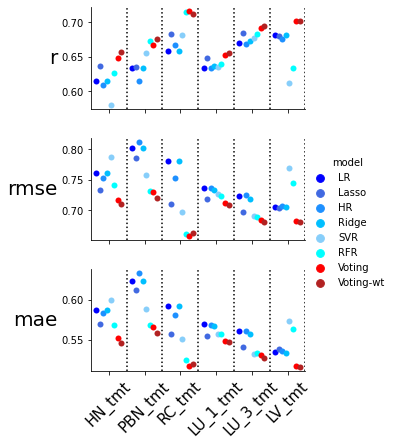

In [598]:
my_color = {
    'Voting':'orange', 'Voting-wt':'red', 
    'LR':'BLue', 'Lasso':'RoyalBlue', 'HR':'LightSkyBlue', 'Ridge':'DeepSkyBlue', 'SVR':'dodgerBlue', 'RFR': 'SteelBlue',}

my_color = {
 'Voting': 'red',
 'Voting-wt': 'firebrick',
 'baselineEN': 'black',
 'LR': 'BLue',
 'Lasso': 'RoyalBlue',
 'HR': 'dodgerBlue',
 'Ridge': 'DeepSkyBlue',
 'SVR': 'LightSkyBlue',
 'RFR': 'Cyan',
}

## Compared to single classical models, our Weighted_mean is improved in performance in 3 metric: r / rmse / mae

g = sns.catplot(x="ShortName", y="regress", hue="model", row="metric",  data=df_draw,  
                kind="swarm", palette = my_color, row_order = list_metric, s=6, height=2, aspect=2, dodge=True, sharey=False);
i = 0
for ax in g.axes.flat:
    ax.set_title(None)
    ax.set_xlabel(None)
    ax.set_ylabel(list_metric[i], fontsize=20, rotation='horizontal', horizontalalignment='right', va='center')
    ax.tick_params(axis="x", rotation=45, labelsize=15)
    for x_i in range(len(list_model)):
        ax.axvline(x=x_i +0.5, color='black', linestyle='dotted', zorder =0)
    i +=1

filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX5_scatter_voting_weighted_no_proxy.' + filetype
plt.savefig(filename, format=filetype, dpi=200, transparent=True, bbox_inches="tight")

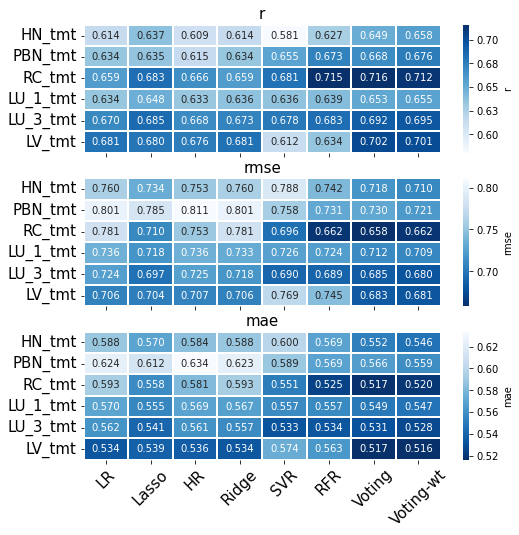

In [601]:
plt.rcParams["figure.figsize"] = (8, 8) ### datasets
fig, axes = plt.subplots(3, 1, sharex=True, sharey='row')
fig.subplots_adjust( hspace=0.2)

for i, metric in zip(range(3), list_metric):
    
    temp = df_draw.pivot_table(index=['ShortName'], columns=['metric','model'],values='regress', sort=False)\
        .loc[:, (metric)].loc[:, list_model]
    my_cmap = 'Blues' if (metric == 'r') else 'Blues_r'
    sns.heatmap( temp, cmap=my_cmap, annot=True, fmt='.3f', linewidths = 0.1, ax= axes[i],
                cbar_kws={'label': metric, "orientation": "vertical", 'format':'%.2f', 'shrink': 1} )
    axes[i].set_title(metric, fontsize=15)
    axes[i].set_ylabel(None)
    axes[i].set_xlabel(None)
    axes[i].tick_params(axis="x", labelsize=15,rotation=45)
    axes[i].tick_params(axis="y", labelsize=15)

# plt.savefig("/media/eys/xwj/proteome/data/figs/figX5_heatmap.svg", 
#            format='svg', dpi=300, transparent=True, bbox_inches="tight")
# plt.savefig("/media/eys/xwj/proteome/data/figs/figX5_heatmap.png", format='png', dpi=200)

filetype = 'svg'
filename =  '/media/eys/xwj/proteome/data/figs/figX5_heatmap_voting_weighted_no_proxy.' + filetype

plt.savefig(filename, format=filetype, dpi=300, transparent=True, bbox_inches="tight")